In [ ]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(
    { "figure.figsize": (6, 4) },
    style='ticks',
    color_codes=True,
    font_scale=0.8
)
%config InlineBackend.figure_formats = set(('retina', 'svg'))



---


#**Data Extraction from various sources**


---



In [ ]:
import glob
import pandas as pd

# Specify the folder path where the CSV files are located
folder_path = '/content/drive/MyDrive/MSc Project - Football Prediction/England'

# Get a list of CSV file paths in the folder
csv_files = glob.glob(folder_path + '/*.csv')

# Initialize an empty list to store the dataframes
dfs = []

# Read and append each CSV file to the list of dataframes
for file in csv_files:
    # Extract the year from the filename (assuming the filename is in the format 'YYYY.csv')
    year = int(file.split('/')[-1].split('.')[0])

    # Read the CSV file and add a 'Year' column with the extracted year
    df = pd.read_csv(file)
    df['Year'] = year

    # Append the dataframe to the list
    dfs.append(df)

# Concatenate the dataframes vertically
combined_df = pd.concat(dfs, ignore_index=True)



In [ ]:
combined_df

,Div,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTHG,HTAG,HTR,...,AvgC<2.5,AHCh,B365CAHH,B365CAHA,PCAHH,PCAHA,MaxCAHH,MaxCAHA,AvgCAHH,AvgCAHA
0,E0,13/08/16,Burnley,Swansea,0.0,1.0,A,0.0,0.0,D,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,E0,13/08/16,Crystal Palace,West Brom,0.0,1.0,A,0.0,0.0,D,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,E0,13/08/16,Everton,Tottenham,1.0,1.0,D,1.0,0.0,H,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,E0,13/08/16,Hull,Leicester,2.0,1.0,H,1.0,0.0,H,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,E0,13/08/16,Man City,Sunderland,2.0,1.0,H,1.0,0.0,H,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4176,E0,26/07/2020,Leicester,Man United,0.0,2.0,A,0.0,0.0,D,...,2.03,0.50,1.89,2.01,1.88,2.05,1.94,2.05,1.86,2.02
4177,E0,26/07/2020,Man City,Norwich,5.0,0.0,H,2.0,0.0,H,...,5.77,-3.75,2.03,1.87,2.01,1.88,2.06,1.88,2.02,1.84
4178,E0,26/07/2020,Newcastle,Liverpool,1.0,3.0,A,1.0,1.0,D,...,2.40,1.00,1.94,1.96,1.95,1.97,2.03,2.00,1.95,1.92
4179,E0,26/07/2020,Southampton,Sheffield United,3.0,1.0,H,0.0,1.0,A,...,2.01,-0.50,1.97,1.93,2.00,1.93,2.03,1.96,1.98,1.89


In [ ]:
# Extracting matchweek and season information from another dataframe

mw=pd.read_csv("/content/drive/MyDrive/MSc Project - Football Prediction/PL_Matchweek.csv")

In [ ]:
combined_df['Year'].value_counts()

2015    381
2017    380
2016    380
2014    380
2013    380
2023    380
2022    380
2021    380
2018    380
2019    380
2020    380
Name: Year, dtype: int64

In [ ]:
# Extracting team rating data

rating = pd.read_csv("/content/drive/MyDrive/MSc Project - Football Prediction/rating_csv.csv")

In [ ]:
rating.sample(5)

,Name,Overall,Attack,Midfield,Defence,Year
215,Wigan Athletic,74,74,72,72,2013
179,Leicester City,70,70,71,70,2015
198,Cardiff City,71,71,73,69,2014
72,Crystal Palace,77,79,77,76,2020
1,Liverpool,84,84,81,85,2023


## **Concatenating MatchWeek number and Year**

In [ ]:
# observing the matchweek dataset

mw

,Season_End_Year,Wk,Date,Home,HomeGoals,AwayGoals,Away,FTR
0,1993,1,1992-08-15,Coventry City,2,1,Middlesbrough,H
1,1993,1,1992-08-15,Leeds United,2,1,Wimbledon,H
2,1993,1,1992-08-15,Sheffield Utd,2,1,Manchester Utd,H
3,1993,1,1992-08-15,Crystal Palace,3,3,Blackburn,D
4,1993,1,1992-08-15,Arsenal,2,4,Norwich City,A
...,...,...,...,...,...,...,...,...
12021,2023,38,2023-05-28,Everton,1,0,Bournemouth,H
12022,2023,38,2023-05-28,Leicester City,2,1,West Ham,H
12023,2023,38,2023-05-28,Aston Villa,2,1,Brighton,H
12024,2023,38,2023-05-28,Leeds United,1,4,Tottenham,A


In [ ]:
# Obtaining the unique year values in the 'combined_data' dataset (team properties)

y_value=combined_df['Year'].unique().tolist()

In [ ]:
# Observing the value counts of year values

combined_df['Year'].value_counts()

2015    381
2017    380
2016    380
2014    380
2013    380
2023    380
2022    380
2021    380
2018    380
2019    380
2020    380
Name: Year, dtype: int64

In [ ]:
# Extracting the available match week number data for the season under consideration

mw_pl = mw[mw['Season_End_Year'].isin(y_value)][['Season_End_Year', 'Date', 'Home', 'Away', 'Wk']]

In [ ]:
# Observing the selected season's matchweek dataset

mw_pl

,Season_End_Year,Date,Home,Away,Wk
7846,2013,2012-08-18,Arsenal,Sunderland,1
7847,2013,2012-08-18,Fulham,Norwich City,1
7848,2013,2012-08-18,Newcastle Utd,Tottenham,1
7849,2013,2012-08-18,West Brom,Liverpool,1
7850,2013,2012-08-18,West Ham,Aston Villa,1
...,...,...,...,...,...
12021,2023,2023-05-28,Everton,Bournemouth,38
12022,2023,2023-05-28,Leicester City,West Ham,38
12023,2023,2023-05-28,Aston Villa,Brighton,38
12024,2023,2023-05-28,Leeds United,Tottenham,38


In [ ]:
# length of the dataset considered for building the model

len(mw_pl)

4180

In [ ]:
# copying values of combined csv files into a new dataframe 'pl'

pl = combined_df

In [ ]:
# Team names appearing over various seasons in the dataset

pl['HomeTeam'].unique()

array(['Burnley', 'Crystal Palace', 'Everton', 'Hull', 'Man City',
       'Middlesbrough', 'Southampton', 'Arsenal', 'Bournemouth',
       'Chelsea', 'Man United', 'Leicester', 'Stoke', 'Swansea',
       'Tottenham', 'Watford', 'West Brom', 'Sunderland', 'West Ham',
       'Liverpool', 'Norwich', 'Newcastle', 'Aston Villa', 'QPR', nan,
       'Fulham', 'Cardiff', 'Reading', 'Wigan', 'Leeds', 'Brighton',
       'Wolves', 'Brentford', "Nott'm Forest", 'Sheffield United',
       'Huddersfield'], dtype=object)

In [ ]:
pl['Year'].value_counts()

2015    381
2017    380
2016    380
2014    380
2013    380
2023    380
2022    380
2021    380
2018    380
2019    380
2020    380
Name: Year, dtype: int64

In [ ]:

pl = pl.sort_values(by=['Year']).groupby(['HomeTeam','AwayTeam']).apply(lambda x: x.reset_index(drop=True))

In [ ]:
pl

Div        Date HomeTeam     AwayTeam  FTHG  FTAG FTR  \
HomeTeam AwayTeam                                                              
Arsenal  Aston Villa 0  E0    23/02/13  Arsenal  Aston Villa   2.0   1.0   H   
                     1  E0    17/08/13  Arsenal  Aston Villa   1.0   3.0   A   
                     2  E0    01/02/15  Arsenal  Aston Villa   5.0   0.0   H   
                     3  E0  15/05/2016  Arsenal  Aston Villa   4.0   0.0   H   
                     4  E0  22/09/2019  Arsenal  Aston Villa   3.0   2.0   H   
...                     ..         ...      ...          ...   ...   ...  ..   
Wolves   West Ham    0  E0  29/01/2019   Wolves     West Ham   3.0   0.0   H   
                     1  E0  04/12/2019   Wolves     West Ham   2.0   0.0   H   
                     2  E0  05/04/2021   Wolves     West Ham   2.0   3.0   A   
                     3  E0  20/11/2021   Wolves     West Ham   1.0   0.0   H   
                     4  E0  14/01/2023   Wolves     West Ham   1.0   0.0   H   

                        HTHG  HTAG HTR  ... AvgC<2.5  AHCh  B365CAHH  \
HomeTeam AwayTeam                       ...                            
Arsenal  Aston Villa 0   1.0   0.0   H  ...      NaN   NaN       NaN   
                     1   1.0   1.0   D  ...      NaN   NaN       NaN   
                     2   1.0   0.0   H  ...      NaN   NaN       NaN   
                     3   1.0   0.0   H  ...      NaN   NaN       NaN   
                     4   0.0   1.0   A  ...     2.95 -1.25      1.97   
...                      ...   ...  ..  ...      ...   ...       ...   
Wolves   West Ham    0   0.0   0.0   D  ...      NaN   NaN       NaN   
                     1   1.0   0.0   H  ...     2.03 -0.75      1.88   
                     2   1.0   3.0   A  ...     1.64  0.00      2.03   
                     3   0.0   0.0   D  ...     1.85  0.25      1.81   
                     4   0.0   0.0   D  ...     1.66 -0.25      2.11   

                        B365CAHA  PCAHH  PCAHA  MaxCAHH  MaxCAHA  AvgCAHH  \
HomeTeam AwayTeam                                                           
Arsenal  Aston Villa 0       NaN    NaN    NaN      NaN      NaN      NaN   
                     1       NaN    NaN    NaN      NaN      NaN      NaN   
                     2       NaN    NaN    NaN      NaN      NaN      NaN   
                     3       NaN    NaN    NaN      NaN      NaN      NaN   
                     4      1.96   1.94   2.00     1.99     2.05     1.91   
...                          ...    ...    ...      ...      ...      ...   
Wolves   West Ham    0       NaN    NaN    NaN      NaN      NaN      NaN   
                     1      2.05   1.88   2.05     1.95     2.06     1.87   
                     2      1.90   2.02   1.90     2.08     2.01     2.01   
                     3      2.09   1.84   2.10     1.93     2.13     1.83   
                     4      1.82   2.15   1.80     2.19     1.84     2.13   

                        AvgCAHA  
HomeTeam AwayTeam                
Arsenal  Aston Villa 0      NaN  
                     1      NaN  
                     2      NaN  
                     3      NaN  
                     4     1.99  
...                         ...  
Wolves   West Ham    0      NaN  
                     1     2.01  
                     2     1.87  
                     3     2.06  
                     4     1.77  

[4180 rows x 137 columns]

In [ ]:
# Convert 'Date' column to datetime format

mw_pl['Date'] = pd.to_datetime(mw_pl['Date'], format='%Y-%m-%d')


In [ ]:
# Sort the values in Alphabetical order of Home Team and Away Team

mw_pl=mw_pl.sort_values(by=['Season_End_Year']).groupby(['Home','Away']).apply(lambda x: x.reset_index(drop=True))
mw_pl

Season_End_Year       Date     Home         Away  Wk
Home    Away                                                               
Arsenal Aston Villa 0             2013 2013-02-23  Arsenal  Aston Villa  27
                    1             2014 2013-08-17  Arsenal  Aston Villa   1
                    2             2015 2015-02-01  Arsenal  Aston Villa  23
                    3             2016 2016-05-15  Arsenal  Aston Villa  38
                    4             2020 2019-09-22  Arsenal  Aston Villa   6
...                                ...        ...      ...          ...  ..
Wolves  West Ham    0             2019 2019-01-29   Wolves     West Ham  24
                    1             2020 2019-12-04   Wolves     West Ham  15
                    2             2021 2021-04-05   Wolves     West Ham  30
                    3             2022 2021-11-20   Wolves     West Ham  12
                    4             2023 2023-01-14   Wolves     West Ham  20

[4180 rows x 5 columns]

In [ ]:
pl = pl.reset_index(drop=True)
mw_pl = mw_pl.reset_index(drop=True)

# Copy the matchweek number and year value to create a new feature in 'pl' dataset

pl['MW'] = mw_pl['Wk']
pl['Date'] = mw_pl['Date']

In [ ]:
# Observing the premier league (pl) dataset with matchweek and season information added

pl

,Div,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTHG,HTAG,HTR,...,AHCh,B365CAHH,B365CAHA,PCAHH,PCAHA,MaxCAHH,MaxCAHA,AvgCAHH,AvgCAHA,MW
0,E0,2013-02-23,Arsenal,Aston Villa,2.0,1.0,H,1.0,0.0,H,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27
1,E0,2013-08-17,Arsenal,Aston Villa,1.0,3.0,A,1.0,1.0,D,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
2,E0,2015-02-01,Arsenal,Aston Villa,5.0,0.0,H,1.0,0.0,H,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23
3,E0,2016-05-15,Arsenal,Aston Villa,4.0,0.0,H,1.0,0.0,H,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38
4,E0,2019-09-22,Arsenal,Aston Villa,3.0,2.0,H,0.0,1.0,A,...,-1.25,1.97,1.96,1.94,2.00,1.99,2.05,1.91,1.99,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4175,E0,2019-01-29,Wolves,West Ham,3.0,0.0,H,0.0,0.0,D,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24
4176,E0,2019-12-04,Wolves,West Ham,2.0,0.0,H,1.0,0.0,H,...,-0.75,1.88,2.05,1.88,2.05,1.95,2.06,1.87,2.01,15
4177,E0,2021-04-05,Wolves,West Ham,2.0,3.0,A,1.0,3.0,A,...,0.00,2.03,1.90,2.02,1.90,2.08,2.01,2.01,1.87,30
4178,E0,2021-11-20,Wolves,West Ham,1.0,0.0,H,0.0,0.0,D,...,0.25,1.81,2.09,1.84,2.10,1.93,2.13,1.83,2.06,12


In [ ]:
# Checking for null values in MW column of the dataset

pl['MW'].isna().value_counts()

False    4180
Name: MW, dtype: int64

In [ ]:
# Observing number of match data available in each season of the dataset

pl['Year'].value_counts()

2013    380
2014    380
2015    380
2016    380
2020    380
2021    380
2022    380
2023    380
2017    380
2018    380
2019    380
Name: Year, dtype: int64

In [ ]:
# Observing the number of matches in each matchweek in the entire dataset

mw_pl['Wk'].value_counts()

27    110
29    110
2     110
12    110
20    110
24    110
17    110
34    110
35    110
33    110
1     110
11    110
21    110
14    110
16    110
25    110
31    110
3     110
18    110
22    110
10    110
36    110
23    110
38    110
6     110
8     110
9     110
5     110
19    110
13    110
4     110
28    110
26    110
7     110
37    110
15    110
32    110
30    110
Name: Wk, dtype: int64

In [ ]:
pl['MW'].value_counts()

27    110
29    110
2     110
12    110
20    110
24    110
17    110
34    110
35    110
33    110
1     110
11    110
21    110
14    110
16    110
25    110
31    110
3     110
18    110
22    110
10    110
36    110
23    110
38    110
6     110
8     110
9     110
5     110
19    110
13    110
4     110
28    110
26    110
7     110
37    110
15    110
32    110
30    110
Name: MW, dtype: int64

In [ ]:
pl

,Div,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTHG,HTAG,HTR,...,AHCh,B365CAHH,B365CAHA,PCAHH,PCAHA,MaxCAHH,MaxCAHA,AvgCAHH,AvgCAHA,MW
0,E0,2013-02-23,Arsenal,Aston Villa,2.0,1.0,H,1.0,0.0,H,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27
1,E0,2013-08-17,Arsenal,Aston Villa,1.0,3.0,A,1.0,1.0,D,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
2,E0,2015-02-01,Arsenal,Aston Villa,5.0,0.0,H,1.0,0.0,H,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23
3,E0,2016-05-15,Arsenal,Aston Villa,4.0,0.0,H,1.0,0.0,H,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38
4,E0,2019-09-22,Arsenal,Aston Villa,3.0,2.0,H,0.0,1.0,A,...,-1.25,1.97,1.96,1.94,2.00,1.99,2.05,1.91,1.99,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4175,E0,2019-01-29,Wolves,West Ham,3.0,0.0,H,0.0,0.0,D,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24
4176,E0,2019-12-04,Wolves,West Ham,2.0,0.0,H,1.0,0.0,H,...,-0.75,1.88,2.05,1.88,2.05,1.95,2.06,1.87,2.01,15
4177,E0,2021-04-05,Wolves,West Ham,2.0,3.0,A,1.0,3.0,A,...,0.00,2.03,1.90,2.02,1.90,2.08,2.01,2.01,1.87,30
4178,E0,2021-11-20,Wolves,West Ham,1.0,0.0,H,0.0,0.0,D,...,0.25,1.81,2.09,1.84,2.10,1.93,2.13,1.83,2.06,12


## **Adding rating values to `HomeTeam` and `AwayTeam` from `rating` csv file**

In [ ]:
# Sorting HomeTeam names alphabetically in 'pl' dataset containing match stats

pl = pl.sort_values(by=['HomeTeam'])

In [ ]:
# Observing the team names present in HomeTeam feature of 'pl'

pl['HomeTeam'].unique()

array(['Arsenal', 'Aston Villa', 'Bournemouth', 'Brentford', 'Brighton',
       'Burnley', 'Cardiff', 'Chelsea', 'Crystal Palace', 'Everton',
       'Fulham', 'Huddersfield', 'Hull', 'Leeds', 'Leicester',
       'Liverpool', 'Man City', 'Man United', 'Middlesbrough',
       'Newcastle', 'Norwich', "Nott'm Forest", 'QPR', 'Reading',
       'Sheffield United', 'Southampton', 'Stoke', 'Sunderland',
       'Swansea', 'Tottenham', 'Watford', 'West Brom', 'West Ham',
       'Wigan', 'Wolves'], dtype=object)

In [ ]:
len(pl['HomeTeam'].unique())

35

In [ ]:
# Sorting Names alphabetically in 'rating' dataset containing team ratings

rating = rating.sort_values(by=['Name'])

In [ ]:
# Observing the team names present in Squad feature of 'rating'

rating['Name'].unique()

array(['AFC Bournemouth ', 'Arsenal ', 'Aston Villa ', 'Brentford ',
       'Brighton & Hove Albion ', 'Burnley ', 'Cardiff City ', 'Chelsea ',
       'Crystal Palace ', 'Everton ', 'Fulham ', 'Huddersfield Town ',
       'Hull City ', 'Leeds United ', 'Leicester City ', 'Liverpool ',
       'Manchester City ', 'Manchester United ', 'Middlesbrough ',
       'Newcastle United ', 'Norwich City ', 'Nottingham Forest ',
       'Queens Park Rangers ', 'Reading ', 'Sheffield United ',
       'Southampton ', 'Stoke City ', 'Sunderland ', 'Swansea City ',
       'Tottenham Hotspur ', 'Watford ', 'West Bromwich Albion ',
       'West Ham United ', 'Wigan Athletic ', 'Wolverhampton Wanderers '],
      dtype=object)

In [ ]:
# Unique names from 'pl' dataset
pl_names = ['Arsenal', 'Aston Villa', 'Bournemouth', 'Brentford', 'Brighton',
       'Burnley', 'Cardiff', 'Chelsea', 'Crystal Palace', 'Everton',
       'Fulham', 'Huddersfield', 'Hull', 'Leeds', 'Leicester',
       'Liverpool', 'Man City', 'Man United', 'Middlesbrough',
       'Newcastle', 'Norwich', "Nott'm Forest", 'QPR', 'Reading',
       'Sheffield United', 'Southampton', 'Stoke', 'Sunderland',
       'Swansea', 'Tottenham', 'Watford', 'West Brom', 'West Ham',
       'Wigan', 'Wolves']

# Corresponding names from 'rating' dataset
ratings_names = [ 'Arsenal ', 'Aston Villa ','AFC Bournemouth ', 'Brentford ',
                 'Brighton & Hove Albion ', 'Burnley ', 'Cardiff City ', 'Chelsea ',
                 'Crystal Palace ', 'Everton ', 'Fulham ', 'Huddersfield Town ',
                 'Hull City ', 'Leeds United ', 'Leicester City ', 'Liverpool ',
                 'Manchester City ', 'Manchester United ', 'Middlesbrough ',
                 'Newcastle United ', 'Norwich City ', 'Nottingham Forest ',
                 'Queens Park Rangers ', 'Reading ', 'Sheffield United ',
                 'Southampton ', 'Stoke City ', 'Sunderland ', 'Swansea City ',
                 'Tottenham Hotspur ', 'Watford ', 'West Bromwich Albion ',
                 'West Ham United ', 'Wigan Athletic ', 'Wolverhampton Wanderers ']

# Create a mapping dictionary
name_mapping = dict(zip(ratings_names, pl_names))

# Replace names in 'ratings' dataset using the mapping
rating['Name'] = rating['Name'].map(name_mapping)


In [ ]:
rating = rating.sort_values(by=['Name'])
rating['Name'].unique()

array(['Arsenal', 'Aston Villa', 'Bournemouth', 'Brentford', 'Brighton',
       'Burnley', 'Cardiff', 'Chelsea', 'Crystal Palace', 'Everton',
       'Fulham', 'Huddersfield', 'Hull', 'Leeds', 'Leicester',
       'Liverpool', 'Man City', 'Man United', 'Middlesbrough',
       'Newcastle', 'Norwich', "Nott'm Forest", 'QPR', 'Reading',
       'Sheffield United', 'Southampton', 'Stoke', 'Sunderland',
       'Swansea', 'Tottenham', 'Watford', 'West Brom', 'West Ham',
       'Wigan', 'Wolves'], dtype=object)

In [ ]:
rating.columns

Index(['Name', 'Overall', 'Attack', 'Midfield', 'Defence', 'Year'], dtype='object')

In [ ]:
# Adding team properties to all the team names appearing in HomeTeam column

pl = pd.merge(pl, rating, left_on=['HomeTeam', 'Year'], right_on=['Name', 'Year'], how='left', suffixes=('', '_H'))

# Rename the columns by adding the suffix '_H' to differentiate HomeTeam attributes
columns_to_rename = ['Overall', 'Attack', 'Midfield', 'Defence']
for column in columns_to_rename:
    pl.rename(columns={column: f'{column}_H'}, inplace=True)

# Drop the 'Squad' column from combined_data
pl.drop(['Name'], axis=1, inplace=True)

pl[['HomeTeam','Overall_H', 'Attack_H', 'Midfield_H', 'Defence_H','Year']]

,HomeTeam,Overall_H,Attack_H,Midfield_H,Defence_H,Year
0,Arsenal,80,80,79,80,2013
1,Arsenal,79,82,80,77,2022
2,Arsenal,82,82,84,81,2023
3,Arsenal,80,80,79,80,2013
4,Arsenal,80,81,80,80,2015
...,...,...,...,...,...,...
4175,Wolves,78,77,80,77,2020
4176,Wolves,75,76,80,73,2019
4177,Wolves,75,76,80,73,2019
4178,Wolves,75,76,80,73,2019


In [ ]:
# Adding team properties to all the team names appearing in AwayTeam column

pl = pd.merge(pl, rating, left_on=['AwayTeam', 'Year'], right_on=['Name', 'Year'], how='left', suffixes=('', '_A'))

# Rename the columns by adding the suffix '_A' to differentiate AwayTeam attributes
columns_to_rename = ['Overall', 'Attack', 'Midfield', 'Defence']
for column in columns_to_rename:
    pl.rename(columns={column: f'{column}_A'}, inplace=True)

# Drop the 'Squad' column from combined_data
pl.drop(['Name'], axis=1, inplace=True)

pl[['AwayTeam','Overall_A', 'Attack_A', 'Midfield_A', 'Defence_A','Year']]

,AwayTeam,Overall_A,Attack_A,Midfield_A,Defence_A,Year
0,Aston Villa,75,74,72,71,2013
1,Norwich,74,76,73,73,2022
2,Nott'm Forest,77,75,76,77,2023
3,QPR,75,77,73,74,2013
4,QPR,75,77,74,74,2015
...,...,...,...,...,...,...
4175,Chelsea,81,80,82,80,2020
4176,Chelsea,84,84,85,82,2019
4177,Cardiff,72,73,72,72,2019
4178,Leicester,78,79,78,78,2019


# **Dealing with missing values**

In [ ]:
pl.columns

Index(['Div', 'Date', 'HomeTeam', 'AwayTeam', 'FTHG', 'FTAG', 'FTR', 'HTHG',
       'HTAG', 'HTR',
       ...
       'AvgCAHA', 'MW', 'Overall_H', 'Attack_H', 'Midfield_H', 'Defence_H',
       'Overall_A', 'Attack_A', 'Midfield_A', 'Defence_A'],
      dtype='object', length=146)

## **Filling the missing values in the betting columns**

In [ ]:
# Taking the betting data columns in the dataset

bet_column = ['B365H', 'B365D', 'B365A', 'BWH', 'BWD', 'BWA', 'IWH', 'IWD', 'IWA', 'PSH', 'PSD', 'PSA', 'WHH', 'WHD', 'WHA', 'VCH', 'VCD', 'VCA']

# Initialize an empty dictionary to store the results
bet_data = {}

# Define a lambda function to calculate average and maximum values for each suffix
calc_avg = lambda suffix: pl[[col for col in bet_column if col.endswith(suffix)]].mean(axis=1)
calc_max = lambda suffix: pl[[col for col in bet_column if col.endswith(suffix)]].max(axis=1)

# Apply the lambda functions to calculate average and maximum values for each suffix
bet_data['AvgH'] = calc_avg('H')
bet_data['AvgD'] = calc_avg('D')
bet_data['AvgA'] = calc_avg('A')
bet_data['MaxH'] = calc_max('H')
bet_data['MaxD'] = calc_max('D')
bet_data['MaxA'] = calc_max('A')

# Convert the dictionary to a DataFrame
bet_data_df = pd.DataFrame(bet_data)


In [ ]:
# Checking the betting data statistics in the filled dataset

bet_data_df.describe()

,AvgH,AvgD,AvgA,MaxH,MaxD,MaxA
count,4180.000000,4180.000000,4180.000000,4180.000000,4180.000000,4180.000000
mean,2.888624,4.095630,4.777787,3.023376,4.296160,5.173221
std,2.071710,1.249712,4.145277,2.297754,1.410614,4.854862
min,1.061667,2.966667,1.126667,1.070000,3.000000,1.140000
25%,1.661667,3.358333,2.291667,1.700000,3.500000,2.350000
50%,2.238333,3.610000,3.360833,2.300000,3.750000,3.500000
75%,3.200417,4.298333,5.443750,3.320000,4.500000,5.752500
max,20.503333,14.160000,39.323333,23.000000,17.000000,51.000000


In [ ]:
# Checking the betting statistics in the original dataset

bet_original = pl[['AvgH','AvgD','AvgA','MaxH','MaxD','MaxA']]
bet_original.describe()

,AvgH,AvgD,AvgA,MaxH,MaxD,MaxA
count,1520.000000,1520.000000,1520.000000,1520.000000,1520.000000,1520.000000
mean,3.002138,4.213987,4.603191,3.191480,4.457243,5.079289
std,2.208591,1.332203,4.236966,2.537703,1.526636,5.266574
min,1.070000,2.970000,1.150000,1.090000,3.100000,1.180000
25%,1.670000,3.440000,2.180000,1.720000,3.597500,2.250000
50%,2.320000,3.740000,3.190000,2.410000,3.900000,3.320000
75%,3.390000,4.450000,5.297500,3.550000,4.700000,5.620000
max,18.090000,12.840000,37.570000,21.000000,16.000000,50.000000


In [ ]:
bet_data_df.columns

Index(['AvgH', 'AvgD', 'AvgA', 'MaxH', 'MaxD', 'MaxA'], dtype='object')

In [ ]:
bet_original.columns

Index(['AvgH', 'AvgD', 'AvgA', 'MaxH', 'MaxD', 'MaxA'], dtype='object')

<ipython-input-321-7e38e68e5d39>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bet_original['Source'] = 'Bet Original'


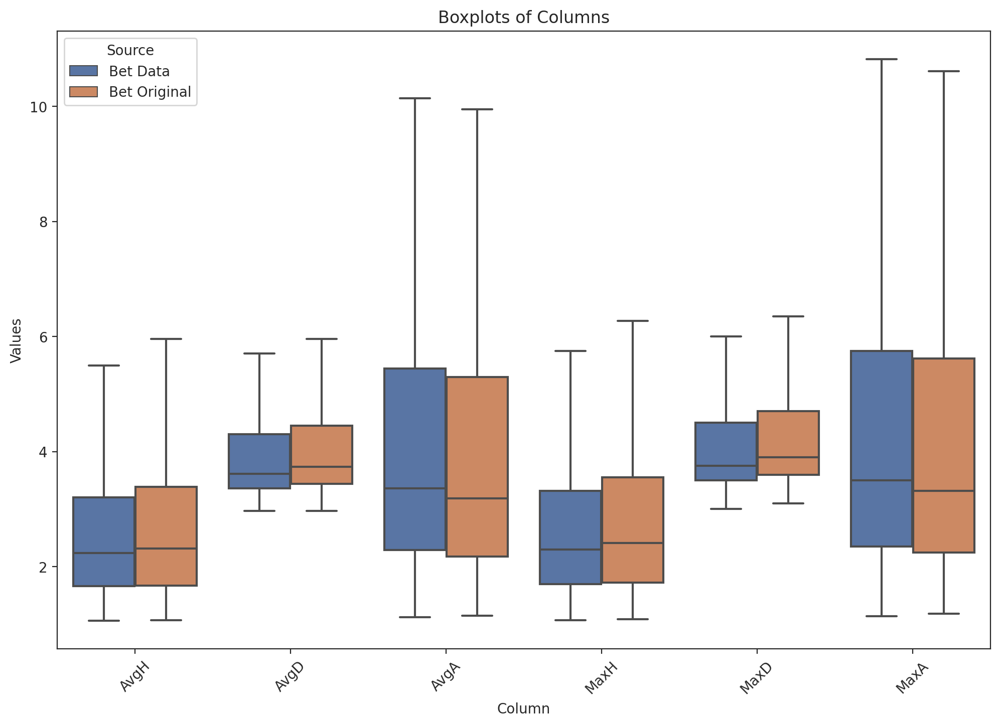

In [ ]:
# Create a new column to distinguish between the two DataFrames
bet_data_df['Source'] = 'Bet Data'
bet_original['Source'] = 'Bet Original'

# Combine the DataFrames
combined_betting_data = pd.concat([bet_data_df, bet_original])

# Reshape the data using pd.melt()
melted_data = pd.melt(combined_betting_data, id_vars=['Source'], value_vars=['AvgH', 'AvgD', 'AvgA', 'MaxH', 'MaxD', 'MaxA'],
                      var_name='Column', value_name='Value')

# Create the boxplot with side-by-side columns
plt.figure(figsize=(12, 8))
sns.boxplot(data=melted_data, x='Column', y='Value', hue='Source',showfliers=False)
plt.title("Boxplots of Columns")
plt.ylabel("Values")
plt.xticks(rotation=45)
plt.show()

In [ ]:
# Replacing the betting statstics in the original dataset with the new calculated data

# Define the columns to update
columns_to_update = ['AvgH', 'AvgD', 'AvgA', 'MaxH', 'MaxD', 'MaxA']

# Use the 'update()' method to replace the values in 'pl' with the values from 'bet_data_df'
pl.update(bet_data_df[columns_to_update])

In [ ]:
pl.columns

Index(['Div', 'Date', 'HomeTeam', 'AwayTeam', 'FTHG', 'FTAG', 'FTR', 'HTHG',
       'HTAG', 'HTR',
       ...
       'AvgCAHA', 'MW', 'Overall_H', 'Attack_H', 'Midfield_H', 'Defence_H',
       'Overall_A', 'Attack_A', 'Midfield_A', 'Defence_A'],
      dtype='object', length=146)

In [ ]:
goal_bet = pl.filter(like='2.5',axis=1)
goal_bet

,BbMx>2.5,BbAv>2.5,BbMx<2.5,BbAv<2.5,B365>2.5,B365<2.5,P>2.5,P<2.5,Max>2.5,Max<2.5,Avg>2.5,Avg<2.5,B365C>2.5,B365C<2.5,PC>2.5,PC<2.5,MaxC>2.5,MaxC<2.5,AvgC>2.5,AvgC<2.5
0,1.60,1.53,2.64,2.42,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,1.72,2.10,1.73,2.21,1.75,2.26,1.71,2.17,1.66,2.20,1.67,2.33,1.70,2.55,1.63,2.33
2,NaN,NaN,NaN,NaN,1.50,2.62,1.51,2.68,1.53,2.68,1.50,2.57,1.53,2.50,1.55,2.56,1.58,2.66,1.53,2.49
3,1.56,1.50,2.75,2.53,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.47,1.44,2.88,2.74,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4175,NaN,NaN,NaN,NaN,1.90,1.90,2.02,1.90,2.02,1.91,1.97,1.86,2.00,1.80,2.04,1.88,2.04,2.05,1.97,1.86
4176,1.96,1.91,1.97,1.90,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4177,2.05,1.98,1.91,1.85,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4178,2.50,2.38,1.64,1.59,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
goal_bet.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4180 entries, 0 to 4179
Data columns (total 20 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   BbMx>2.5   2660 non-null   float64
 1   BbAv>2.5   2660 non-null   float64
 2   BbMx<2.5   2660 non-null   float64
 3   BbAv<2.5   2660 non-null   float64
 4   B365>2.5   1519 non-null   float64
 5   B365<2.5   1519 non-null   float64
 6   P>2.5      1519 non-null   float64
 7   P<2.5      1519 non-null   float64
 8   Max>2.5    1520 non-null   float64
 9   Max<2.5    1520 non-null   float64
 10  Avg>2.5    1520 non-null   float64
 11  Avg<2.5    1520 non-null   float64
 12  B365C>2.5  1520 non-null   float64
 13  B365C<2.5  1520 non-null   float64
 14  PC>2.5     1519 non-null   float64
 15  PC<2.5     1519 non-null   float64
 16  MaxC>2.5   1520 non-null   float64
 17  MaxC<2.5   1520 non-null   float64
 18  AvgC>2.5   1520 non-null   float64
 19  AvgC<2.5   1520 non-null   float64
dtypes: float

In [ ]:
goal_bet.columns

Index(['BbMx>2.5', 'BbAv>2.5', 'BbMx<2.5', 'BbAv<2.5', 'B365>2.5', 'B365<2.5',
       'P>2.5', 'P<2.5', 'Max>2.5', 'Max<2.5', 'Avg>2.5', 'Avg<2.5',
       'B365C>2.5', 'B365C<2.5', 'PC>2.5', 'PC<2.5', 'MaxC>2.5', 'MaxC<2.5',
       'AvgC>2.5', 'AvgC<2.5'],
      dtype='object')

In [ ]:
goal_bet.describe()

,BbMx>2.5,BbAv>2.5,BbMx<2.5,BbAv<2.5,B365>2.5,B365<2.5,P>2.5,P<2.5,Max>2.5,Max<2.5,Avg>2.5,Avg<2.5,B365C>2.5,B365C<2.5,PC>2.5,PC<2.5,MaxC>2.5,MaxC<2.5,AvgC>2.5,AvgC<2.5
count,2660.000000,2660.000000,2660.000000,2660.000000,1519.000000,1519.000000,1519.000000,1519.000000,1520.000000,1520.000000,1520.000000,1520.000000,1520.000000,1520.000000,1519.000000,1519.000000,1520.000000,1520.00000,1520.00000,1520.000000
mean,1.957970,1.876252,2.114327,2.008985,1.834510,2.088282,1.872014,2.138828,1.906033,2.186862,1.835803,2.094461,1.846941,2.089447,1.887465,2.143351,1.931882,2.23748,1.84775,2.101803
std,0.298425,0.274877,0.403204,0.356783,0.266948,0.405410,0.281074,0.415451,0.283684,0.431711,0.263983,0.394387,0.295572,0.454665,0.305042,0.466781,0.311262,0.49919,0.28621,0.438327
min,1.240000,1.220000,1.450000,1.400000,1.220000,1.440000,1.200000,1.470000,1.220000,1.510000,1.210000,1.470000,0.000000,0.000000,1.120000,1.410000,1.160000,1.44000,1.13000,1.390000
25%,1.750000,1.680000,1.830000,1.760000,1.660000,1.800000,1.660000,1.850000,1.700000,1.890000,1.640000,1.820000,1.620000,1.800000,1.660000,1.820000,1.700000,1.91000,1.64000,1.800000
50%,1.930000,1.855000,2.040000,1.940000,1.800000,2.000000,1.850000,2.060000,1.880000,2.100000,1.820000,2.010000,1.850000,2.000000,1.870000,2.040000,1.910000,2.14000,1.84000,2.000000
75%,2.150000,2.060000,2.300000,2.180000,2.000000,2.200000,2.060000,2.340000,2.100000,2.380000,2.010000,2.280000,2.032500,2.300000,2.090000,2.340000,2.140000,2.45000,2.05000,2.280000
max,3.140000,2.910000,4.750000,4.170000,2.750000,4.330000,2.860000,5.060000,2.880000,5.060000,2.690000,4.450000,3.200000,6.000000,3.150000,6.720000,3.200000,6.82000,3.01000,5.770000


In [ ]:
len(goal_bet.loc[(goal_bet['Max>2.5'].notna()) | (goal_bet['BbMx>2.5'].notna())])

4180

In [ ]:
len(goal_bet.loc[(goal_bet['Max<2.5'].notna()) | (goal_bet['BbMx<2.5'].notna())])

4180

In [ ]:
len(goal_bet.loc[(goal_bet['Avg>2.5'].notna()) | (goal_bet['BbAv>2.5'].notna())])

4180

In [ ]:
len(goal_bet.loc[(goal_bet['Avg<2.5'].notna()) | (goal_bet['BbAv<2.5'].notna())])

4180

In [ ]:
# Listing out the columns of interest for model building

cols=['Div','Date', 'Time', 'HomeTeam', 'AwayTeam', 'FTHG', 'FTAG', 'FTR',\
       'HTHG', 'HTAG', 'HTR', 'Referee', 'HS', 'AS', 'HST', 'AST', 'HF', 'AF',\
       'HC', 'AC', 'HY', 'AY', 'HR', 'AR','AvgH','AvgD','AvgA','MaxH','MaxD','MaxA',\
       'MW', 'Year','Max>2.5','BbMx>2.5','Max<2.5','BbMx<2.5','Avg>2.5',\
      'BbAv>2.5','Avg<2.5','BbAv<2.5','Overall_H', 'Attack_H', 'Midfield_H', 'Defence_H',\
      'Overall_A', 'Attack_A', 'Midfield_A', 'Defence_A']

In [ ]:
# Making a new dataframe with the columns listed above

data=pl[cols]

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4180 entries, 0 to 4179
Data columns (total 48 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Div         4180 non-null   object        
 1   Date        4180 non-null   datetime64[ns]
 2   Time        1520 non-null   object        
 3   HomeTeam    4180 non-null   object        
 4   AwayTeam    4180 non-null   object        
 5   FTHG        4180 non-null   float64       
 6   FTAG        4180 non-null   float64       
 7   FTR         4180 non-null   object        
 8   HTHG        4180 non-null   float64       
 9   HTAG        4180 non-null   float64       
 10  HTR         4180 non-null   object        
 11  Referee     4180 non-null   object        
 12  HS          4180 non-null   float64       
 13  AS          4180 non-null   float64       
 14  HST         4180 non-null   float64       
 15  AST         4180 non-null   float64       
 16  HF          4180 non-nul

## **Filling missing values in  `Max & Avg <2.5` and `Max & Avg >2.5`**

In [ ]:
data.loc[data['Max>2.5'].isnull(), 'Max>2.5'] = data['BbMx>2.5']
data.loc[data['Max<2.5'].isnull(), 'Max<2.5'] = data['BbMx<2.5']
data.loc[data['Avg>2.5'].isnull(), 'Avg>2.5'] = data['BbAv>2.5']
data.loc[data['Avg<2.5'].isnull(), 'Avg<2.5'] = data['BbAv<2.5']

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4180 entries, 0 to 4179
Data columns (total 48 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Div         4180 non-null   object        
 1   Date        4180 non-null   datetime64[ns]
 2   Time        1520 non-null   object        
 3   HomeTeam    4180 non-null   object        
 4   AwayTeam    4180 non-null   object        
 5   FTHG        4180 non-null   float64       
 6   FTAG        4180 non-null   float64       
 7   FTR         4180 non-null   object        
 8   HTHG        4180 non-null   float64       
 9   HTAG        4180 non-null   float64       
 10  HTR         4180 non-null   object        
 11  Referee     4180 non-null   object        
 12  HS          4180 non-null   float64       
 13  AS          4180 non-null   float64       
 14  HST         4180 non-null   float64       
 15  AST         4180 non-null   float64       
 16  HF          4180 non-nul

# **Feature Engineering**

## **Seperating full time result `FTR` to home team result (`H_TR`) and away team result (`A_TR`)**

In [ ]:
data.loc[data['FTR'] == 'H', ['H_TR', 'A_TR']] = ['W', 'L']
data.loc[data['FTR'] == 'A', ['H_TR', 'A_TR']] = ['L', 'W']
data.loc[data['FTR'] == 'D', ['H_TR', 'A_TR']] = ['D', 'D']

## **Calculating winning streak of teams**

In [ ]:
data['Year'].min(),data['Year'].max()

(2013, 2023)

In [ ]:
from collections import defaultdict, deque

# Create a dictionary to store team results as circular lists
team_results = defaultdict(lambda: deque(maxlen=5))

# Group the data by year and 'MW'
grouped_data = data.groupby(['Year', 'MW'])

# Initialize variables to keep track of the previous year and matchweek
prev_year = None
prev_matchweek = None

# Iterate through each group
for group_key, group_data in grouped_data:
    year, match_week = group_key

    # Reset the streak lists if a new year is encountered
    if prev_year is not None and year != prev_year:
        team_results.clear()

    # Reset the streak lists if MW is 1
    if match_week == 1:
        team_results.clear()

    # Iterate through each row in the group
    for index, row in group_data.iterrows():
        home_team = row['HomeTeam']
        away_team = row['AwayTeam']
        home_result = row['H_TR']
        away_result = row['A_TR']

        # Get the previous results for the home team
        home_streak = ''.join(team_results[home_team])

        # Get the previous results for the away team
        away_streak = ''.join(team_results[away_team])

        # Append the current result to the circular lists
        team_results[home_team].append(home_result)
        team_results[away_team].append(away_result)

        # Assign the streak values to the respective columns
        data.at[index, 'H_SK'] = home_streak
        data.at[index, 'A_SK'] = away_streak

    # Update the previous year and matchweek
    prev_year = year
    prev_matchweek = match_week

# Filter the data within the specific year range
filtered_data1 = data.loc[(data['Year'] >= data['Year'].min()) & (data['Year'] <= data['Year'].max())].copy()


<ipython-input-339-270c952a2f34>:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.at[index, 'H_SK'] = home_streak
<ipython-input-339-270c952a2f34>:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.at[index, 'A_SK'] = away_streak


In [ ]:
# Observing the dataset with streak added to the dataset

filtered_data1[['HomeTeam','AwayTeam','FTR','H_SK','A_SK','MW','Year','Date']].sort_values(by=['Year','MW'])

,HomeTeam,AwayTeam,FTR,H_SK,A_SK,MW,Year,Date
50,Arsenal,Sunderland,D,,,1,2013,2012-08-18
1225,Everton,Man United,H,,,1,2013,2012-08-20
1426,Fulham,Norwich,H,,,1,2013,2012-08-18
2033,Man City,Southampton,H,,,1,2013,2012-08-19
2549,Newcastle,Tottenham,H,,,1,2013,2012-08-18
...,...,...,...,...,...,...,...,...
1326,Everton,Bournemouth,H,LDWLD,WWLLL,38,2023,2023-05-28
1614,Leeds,Tottenham,A,DLLDL,DLWLL,38,2023,2023-05-28
1708,Leicester,West Ham,H,DDLLD,LLWLW,38,2023,2023-05-28
2424,Man United,Fulham,H,DWLWW,LLWWD,38,2023,2023-05-28


In [ ]:
# Initialize the streak point variables
hstreak_point = 0
astreak_point = 0

# Iterate through each row
for index, row in filtered_data1.iterrows():
    hstreak_value = row['H_SK']
    astreak_value = row['A_SK']
    hstreak_length = len(hstreak_value)
    astreak_length = len(astreak_value)

    if hstreak_length != 0:
        # Calculate the streak point for home team
        hstreak_point = sum([3 if result == 'W' else 0 if result == 'L' else 1 for result in hstreak_value]) / (3 * hstreak_length)

    if astreak_length != 0:
        # Calculate the streak point for away team
        astreak_point = sum([3 if result == 'W' else 0 if result == 'L' else 1 for result in astreak_value]) / (3 * astreak_length)

    # Check if MW is 1 and set H_SP and A_SP to 0
    if row['MW'] == 1:
        hstreak_point = 0
        astreak_point = 0

    # Assign the streak point value to the respective column
    filtered_data1.at[index, 'H_SP'] = hstreak_point
    filtered_data1.at[index, 'A_SP'] = astreak_point


In [ ]:
# Observing the dataset with streak points added to the dataset

filtered_data1[['HomeTeam','AwayTeam','FTR','H_SK','H_SP','A_SK','A_SP','MW','Year','Date']].sort_values(by=['Year','MW'])

,HomeTeam,AwayTeam,FTR,H_SK,H_SP,A_SK,A_SP,MW,Year,Date
50,Arsenal,Sunderland,D,,0.000000,,0.000000,1,2013,2012-08-18
1225,Everton,Man United,H,,0.000000,,0.000000,1,2013,2012-08-20
1426,Fulham,Norwich,H,,0.000000,,0.000000,1,2013,2012-08-18
2033,Man City,Southampton,H,,0.000000,,0.000000,1,2013,2012-08-19
2549,Newcastle,Tottenham,H,,0.000000,,0.000000,1,2013,2012-08-18
...,...,...,...,...,...,...,...,...,...,...
1326,Everton,Bournemouth,H,LDWLD,0.333333,WWLLL,0.400000,38,2023,2023-05-28
1614,Leeds,Tottenham,A,DLLDL,0.133333,DLWLL,0.266667,38,2023,2023-05-28
1708,Leicester,West Ham,H,DDLLD,0.200000,LLWLW,0.400000,38,2023,2023-05-28
2424,Man United,Fulham,H,DWLWW,0.666667,LLWWD,0.466667,38,2023,2023-05-28


## **Calculating form of each team**

In [ ]:
# sorting the dataset by year and matchweek number

filtered_data1=filtered_data1.sort_values(by=['Year','MW'])

In [ ]:
team_form={}


# Iterate through each row
for index, row in filtered_data1.iterrows():
    home_team = row['HomeTeam']
    away_team = row['AwayTeam']
    match_week = row['MW']

    # Initialize the form value for the home team and away team in match week 1
    if match_week == 1:
        team_form[home_team] = 1.0
        team_form[away_team] = 1.0


    # Update the form values for subsequent match weeks
    else:
        prev_match_week = match_week - 1

        # Check if the home team was home in the previous match week
        if home_team in filtered_data1.loc[(filtered_data1['MW'] == prev_match_week) &
                                           (filtered_data1['Year'] == row['Year']), 'HomeTeam']\
                                           .values:
            prev_home_result = filtered_data1.loc[(filtered_data1['MW'] == prev_match_week) &
                                                  (filtered_data1['HomeTeam'] == home_team) &
                                                  (filtered_data1['Year'] == row['Year'])]
            H_Re, P_F1, R_F1 = prev_home_result['H_TR'].values[0], \
                                    prev_home_result['H_F'].values[0], prev_home_result['A_F'].values[0]
        elif home_team in filtered_data1.loc[(filtered_data1['MW'] == prev_match_week) &
                                             (filtered_data1['Year'] == row['Year']),\
                                             'AwayTeam'].values:
            prev_home_result = filtered_data1.loc[(filtered_data1['MW'] == prev_match_week) &
                                                  (filtered_data1['AwayTeam'] == home_team) &
                                                  (filtered_data1['Year'] == row['Year'])]
            H_Re, P_F1, R_F1 = prev_home_result['A_TR'].values[0], \
                                  prev_home_result['A_F'].values[0], prev_home_result['H_F'].values[0]
        # else:
        #     H_TR, H_F, A_F = None, None, None

        # Check if the away team was home in the previous match week
        if away_team in filtered_data1.loc[(filtered_data1['MW'] == prev_match_week) &
                                           (filtered_data1['Year'] == row['Year']), 'HomeTeam'].values:
            prev_away_result = filtered_data1.loc[(filtered_data1['MW'] == prev_match_week) &
                                                  (filtered_data1['HomeTeam'] == away_team) &
                                                  (filtered_data1['Year'] == row['Year'])]
            A_Re, P_F2, R_F2 = prev_away_result['H_TR'].values[0], prev_away_result['H_F']\
                                                 .values[0], prev_away_result['A_F'].values[0]
        elif away_team in filtered_data1.loc[(filtered_data1['MW'] == prev_match_week) &
                                             (filtered_data1['Year'] == row['Year']),\
                                                             'AwayTeam'].values:
            prev_away_result = filtered_data1.loc[(filtered_data1['MW'] == prev_match_week) &
                                                  (filtered_data1['AwayTeam'] == away_team) &
                                                  (filtered_data1['Year'] == row['Year'])]
            A_Re, P_F2, R_F2 = prev_away_result['A_TR'].values[0],\
                                 prev_away_result['A_F'].values[0], prev_away_result['H_F'].values[0]
        # else:
        #     A_TR, H_F, A_F = None, None, None

        # Update the form values based on the previous result
        if H_Re == 'W':
            team_form[home_team] = round(P_F1 + (0.3 * abs(R_F1)),3)
        elif H_Re == 'L':
            team_form[home_team] = round(P_F1 - (0.3 * abs(R_F1)),3)
        elif H_Re == 'D':
            form_diff = abs(P_F1 - R_F1)
            team_form[home_team] = round(P_F1 - abs((0.3 * form_diff)),3)

        if A_Re == 'W':
            team_form[away_team] = round(P_F2 + (0.3 * abs(R_F2)),3)
        elif A_Re == 'L':
            team_form[away_team] = round(P_F2 - (0.3 * abs(R_F2)),3)
        elif A_Re == 'D':
            form_diff = abs(P_F2 - R_F2)
            team_form[away_team] = round(P_F2 - abs((0.3 * form_diff)),3)

    # Assign the form value to the respective column
    filtered_data1.at[index, 'H_F'] = team_form.get(home_team, 0)
    filtered_data1.at[index, 'A_F'] = team_form.get(away_team, 0)


In [ ]:
filtered_data1[['HomeTeam','AwayTeam','FTR','HTR','H_TR','A_TR','H_F','A_F','MW','Year']].sort_values(by=['Year','MW'])

,HomeTeam,AwayTeam,FTR,HTR,H_TR,A_TR,H_F,A_F,MW,Year
50,Arsenal,Sunderland,D,D,D,D,1.000,1.000,1,2013
1225,Everton,Man United,H,D,W,L,1.000,1.000,1,2013
1426,Fulham,Norwich,H,H,W,L,1.000,1.000,1,2013
2033,Man City,Southampton,H,H,W,L,1.000,1.000,1,2013
2549,Newcastle,Tottenham,H,D,W,L,1.000,1.000,1,2013
...,...,...,...,...,...,...,...,...,...,...
1326,Everton,Bournemouth,H,D,W,L,-18.126,2.593,38,2023
1614,Leeds,Tottenham,A,A,L,W,-39.377,-10.156,38,2023
1708,Leicester,West Ham,H,H,W,L,-24.958,3.304,38,2023
2424,Man United,Fulham,H,D,W,L,10.009,7.371,38,2023


In [ ]:
# from google.colab import autoviz
# def categorical_histogram(df, colname, figsize=(6, 4), mpl_palette_name='Dark2'):
#   from matplotlib import pyplot as plt
#   import seaborn as sns
#   _, ax = plt.subplots(figsize=figsize)
#   bars = df[colname].value_counts()
#   plt.barh(bars.index, bars.values, color=sns.palettes.mpl_palette(mpl_palette_name))
#   plt.title('Full time result')
#   plt.xlabel('No. of matches')
#   ax.spines[['top', 'right',]].set_visible(False)
#   return autoviz.MplChart.from_current_mpl_state()

# chart = categorical_histogram(filtered_data1, *['FTR'], **{})
# chart

In [ ]:
# from google.colab import autoviz
# def heatmap(df, x_colname, y_colname, figsize=(6, 4), mpl_palette_name='viridis'):
#   from matplotlib import pyplot as plt
#   import seaborn as sns
#   import pandas as pd
#   plt.subplots(figsize=figsize)
#   df_2dhist = pd.DataFrame({
#       x_label: grp[y_colname].value_counts()
#       for x_label, grp in df.groupby(x_colname)
#   })
#   sns.heatmap(df_2dhist, cmap=mpl_palette_name,annot=True,fmt='d')
#   plt.xlabel(x_colname)
#   plt.ylabel(y_colname)
#   return autoviz.MplChart.from_current_mpl_state()

# chart = heatmap(filtered_data1, *['FTR', 'HTR'], **{})
# chart

## **Goal difference**

In [ ]:
filtered_data1=filtered_data1.sort_values(by=['Year','MW'])

filtered_data1['HCGS'] = 0
filtered_data1['HCGC'] = 0
filtered_data1['ACGS'] = 0
filtered_data1['ACGC'] = 0

team_statistics = {}
current_season = None

for index, row in filtered_data1.iterrows():
    home_team = row['HomeTeam']
    away_team = row['AwayTeam']
    home_goals_scored = row['FTHG']
    home_goals_conceded = row['FTAG']
    away_goals_scored = row['FTAG']
    away_goals_conceded = row['FTHG']

    if home_team not in team_statistics:
        team_statistics[home_team] = {
            'GS': 0,
            'GC': 0
        }

    if away_team not in team_statistics:
        team_statistics[away_team] = {
            'GS': 0,
            'GC': 0
        }

    current_season = row['Year']

    if current_season not in team_statistics[home_team]:
        team_statistics[home_team][current_season] = {
            'GS': 0,
            'GC': 0
        }

    if current_season not in team_statistics[away_team]:
        team_statistics[away_team][current_season] = {
            'GS': 0,
            'GC': 0
        }

    current_matchweek = row['MW']
    prev_matchweek = current_matchweek - 1

    if current_matchweek == 1:
        team_statistics[home_team][current_season]['GS_MW1'] = 0
        team_statistics[home_team][current_season]['GC_MW1'] = 0
        team_statistics[away_team][current_season]['GS_MW1'] = 0
        team_statistics[away_team][current_season]['GC_MW1'] = 0

    if prev_matchweek > 0:
        team_statistics[home_team][current_season]['GS'] += team_statistics[home_team][current_season]['GS_MW' + str(prev_matchweek)]
        team_statistics[home_team][current_season]['GC'] += team_statistics[home_team][current_season]['GC_MW' + str(prev_matchweek)]
        team_statistics[away_team][current_season]['GS'] += team_statistics[away_team][current_season]['GS_MW' + str(prev_matchweek)]
        team_statistics[away_team][current_season]['GC'] += team_statistics[away_team][current_season]['GC_MW' + str(prev_matchweek)]

    team_statistics[home_team][current_season]['GS_MW' + str(current_matchweek)] = home_goals_scored
    team_statistics[home_team][current_season]['GC_MW' + str(current_matchweek)] = home_goals_conceded
    team_statistics[away_team][current_season]['GS_MW' + str(current_matchweek)] = away_goals_scored
    team_statistics[away_team][current_season]['GC_MW' + str(current_matchweek)] = away_goals_conceded

    filtered_data1.at[index, 'HCGS'] = team_statistics[home_team][current_season]['GS']
    filtered_data1.at[index, 'HCGC'] = team_statistics[home_team][current_season]['GC']
    filtered_data1.at[index, 'ACGS'] = team_statistics[away_team][current_season]['GS']
    filtered_data1.at[index, 'ACGC'] = team_statistics[away_team][current_season]['GC']


In [ ]:
filtered_data1[['HomeTeam','AwayTeam','FTHG','FTAG','HCGS','HCGC','ACGS','ACGC','MW','Year']].sort_values(by=['Year','MW'])

,HomeTeam,AwayTeam,FTHG,FTAG,HCGS,HCGC,ACGS,ACGC,MW,Year
50,Arsenal,Sunderland,0.0,0.0,0,0,0,0,1,2013
1225,Everton,Man United,1.0,0.0,0,0,0,0,1,2013
1426,Fulham,Norwich,5.0,0.0,0,0,0,0,1,2013
2033,Man City,Southampton,3.0,2.0,0,0,0,0,1,2013
2549,Newcastle,Tottenham,2.0,1.0,0,0,0,0,1,2013
...,...,...,...,...,...,...,...,...,...,...
1326,Everton,Bournemouth,1.0,0.0,33,57,37,70,38,2023
1614,Leeds,Tottenham,1.0,4.0,47,74,66,62,38,2023
1708,Leicester,West Ham,2.0,1.0,49,67,41,53,38,2023
2424,Man United,Fulham,2.0,1.0,56,42,54,51,38,2023


In [ ]:
# filtered_data1['FTHG']

In [ ]:
filtered_data1['HTGD'] = filtered_data1['HCGS'] - filtered_data1['HCGC']
filtered_data1['ATGD'] = filtered_data1['ACGS'] - filtered_data1['ACGC']

In [ ]:
filtered_data1[['HomeTeam','AwayTeam','FTR','HTGD','ATGD','MW','Year']].sort_values(by=['Year','MW'])

,HomeTeam,AwayTeam,FTR,HTGD,ATGD,MW,Year
50,Arsenal,Sunderland,D,0,0,1,2013
1225,Everton,Man United,H,0,0,1,2013
1426,Fulham,Norwich,H,0,0,1,2013
2033,Man City,Southampton,H,0,0,1,2013
2549,Newcastle,Tottenham,H,0,0,1,2013
...,...,...,...,...,...,...,...
1326,Everton,Bournemouth,H,-24,-33,38,2023
1614,Leeds,Tottenham,A,-27,4,38,2023
1708,Leicester,West Ham,H,-18,-12,38,2023
2424,Man United,Fulham,H,14,3,38,2023


## **Probability based on previous goal difference**

In [ ]:
filtered_data1['TGD'] = filtered_data1['HTGD'] - filtered_data1['ATGD']

In [ ]:
filtered_data1[['HomeTeam','AwayTeam','TGD','FTR']]

,HomeTeam,AwayTeam,TGD,FTR
50,Arsenal,Sunderland,0,D
1225,Everton,Man United,0,H
1426,Fulham,Norwich,0,H
2033,Man City,Southampton,0,H
2549,Newcastle,Tottenham,0,H
...,...,...,...,...
1326,Everton,Bournemouth,9,H
1614,Leeds,Tottenham,-31,A
1708,Leicester,West Ham,-6,H
2424,Man United,Fulham,11,H


In [ ]:
cross_tab_result = pd.crosstab(index=filtered_data1['TGD'], columns=filtered_data1['FTR'],normalize='index')
cross_tab_result = cross_tab_result.reset_index()
cross_tab_result = cross_tab_result.rename_axis(None, axis=1)
cross_tab_result

,TGD,A,D,H
0,-101,1.0,0.0,0.0
1,-96,1.0,0.0,0.0
2,-91,1.0,0.0,0.0
3,-90,1.0,0.0,0.0
4,-89,1.0,0.0,0.0
...,...,...,...,...
164,90,0.0,0.0,1.0
165,91,0.0,0.0,1.0
166,106,0.0,0.0,1.0
167,107,0.0,1.0,0.0


In [ ]:
# from google.colab import autoviz
# def scatter_plots(df, colname_pairs, scatter_plot_size=4.5, size=8, alpha=.6):
#   from matplotlib import pyplot as plt
#   plt.figure(figsize=(len(colname_pairs) * scatter_plot_size, scatter_plot_size))
#   for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
#     ax = plt.subplot(1, len(colname_pairs), plot_i)
#     ax.scatter(df[x_colname], df[y_colname], s=size, alpha=alpha)
#     plt.xlabel(x_colname)
#     plt.ylabel(y_colname)
#     ax.spines[['top', 'right',]].set_visible(False)
#   plt.tight_layout()
#   return autoviz.MplChart.from_current_mpl_state()

# chart = scatter_plots(cross_tab_result, *[[['TGD', 'A'], ['TGD', 'D'], ['TGD', 'H']]], **{})
# chart

In [ ]:
cross_tab_result['TGD']

0     -101
1      -96
2      -91
3      -90
4      -89
      ... 
164     90
165     91
166    106
167    107
168    108
Name: TGD, Length: 169, dtype: int64

In [ ]:
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

In [ ]:
x_pred_range = pd.DataFrame(
    np.linspace(cross_tab_result['TGD'].min(), cross_tab_result['TGD'].max(), 1000),
    columns=['TGD']
)

In [ ]:
x_pred_range

,TGD
0,-101.000000
1,-100.790791
2,-100.581582
3,-100.372372
4,-100.163163
...,...
995,107.163163
996,107.372372
997,107.581582
998,107.790791


In [ ]:
cross_tab_result['TGD'].min()

-101

# Draw matches polynomial regression

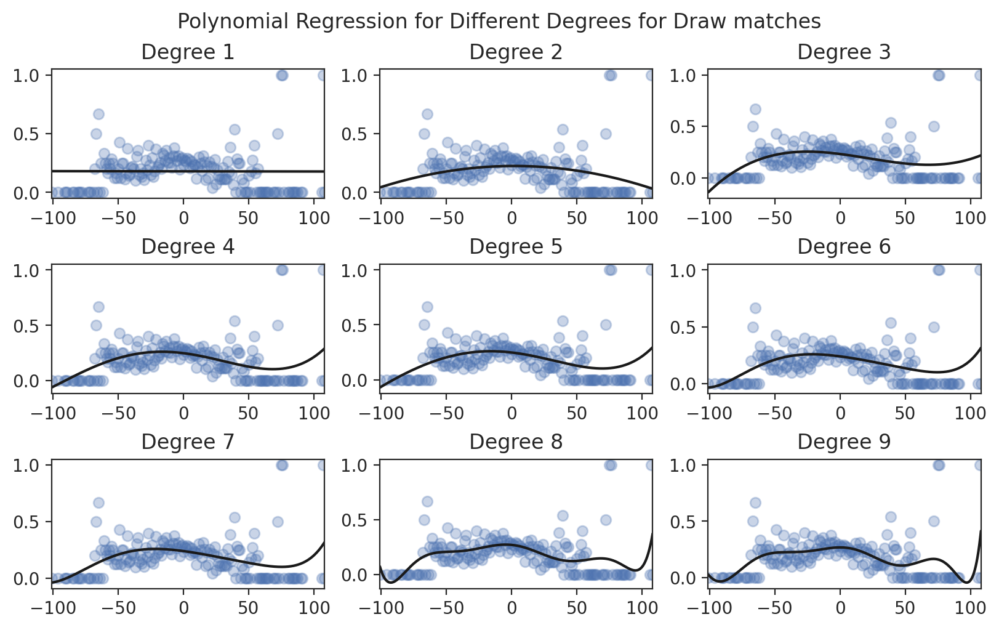

In [ ]:
%matplotlib inline
orders = [1, 2, 3, 4, 5, 6, 7, 8, 9]
fig, axs = plt.subplots(3, 3, figsize=(8, 5), constrained_layout=True)
lr_models_D = []

for ax, order in zip(axs.ravel(), orders):
    model = make_pipeline(
        PolynomialFeatures(order, include_bias=True),
        LinearRegression()
    )
    lr_models_D.append(
        model.fit(cross_tab_result['TGD'].values.reshape(-1, 1), cross_tab_result['D'])
    )
    ax.set_xlim(cross_tab_result['TGD'].min(), cross_tab_result['TGD'].max())
    ax.scatter(cross_tab_result['TGD'], cross_tab_result['D'], alpha=0.3, marker='o', c='b')
    ax.plot(x_pred_range['TGD'], model.predict(x_pred_range['TGD'].values.reshape(-1, 1)), c='k')
    ax.set_title(f'Degree {order}')

fig.suptitle("Polynomial Regression for Different Degrees for Draw matches", fontsize=12);


In [ ]:
tester = pd.DataFrame(
    np.linspace(cross_tab_result['TGD'].min(), cross_tab_result['TGD'].max(), len(cross_tab_result)),
    columns=['TGD']
)

In [ ]:
from sklearn.metrics import mean_squared_error
from functools import partial
rmse = partial(mean_squared_error, squared=False)
from sklearn.metrics import r2_score

In [ ]:
# Loop through the lr_models_D list
for i, model in enumerate(lr_models_D):
    pred_D = model.predict(tester.values)

    # Calculate RMSE
    rmseD = mean_squared_error(cross_tab_result['D'], pred_D, squared=False)

    # Calculate R-squared
    r_squaredD = r2_score(cross_tab_result['D'], pred_D)

    # Print the results for each model
    print(f"Results for Degree {i + 1}:")
    print(f"RMSE: {rmseD}")
    print(f"R-squared: {r_squaredD}")
    print()

Results for Degree 1:
RMSE: 0.1740961359934635
R-squared: 0.00015976838927345138

Results for Degree 2:
RMSE: 0.16733278494801831
R-squared: 0.07633513950077475

Results for Degree 3:
RMSE: 0.16527733337143438
R-squared: 0.09888765812618228

Results for Degree 4:
RMSE: 0.16520033703296846
R-squared: 0.09972704956812306

Results for Degree 5:
RMSE: 0.16511656331551464
R-squared: 0.10063988171424132

Results for Degree 6:
RMSE: 0.16573437644077577
R-squared: 0.09389705736237719

Results for Degree 7:
RMSE: 0.16568203353076377
R-squared: 0.09446930527308284

Results for Degree 8:
RMSE: 0.16670998913737656
R-squared: 0.0831979199871744

Results for Degree 9:
RMSE: 0.1711995134365061
R-squared: 0.03315379788747164



In [ ]:
# Loop through the lr_models_D list and calculate RMSE_D and R-squared for each model
results_D = []
for i, model in enumerate(lr_models_D):
    pred_D = model.predict(tester.values)
    rmse_D = mean_squared_error(cross_tab_result['D'], pred_D, squared=False)
    r_squared_D = r2_score(cross_tab_result['D'], pred_D)
    results_D.append((i + 1, rmse_D, r_squared_D))

# Find the model with the lowest RMSE_D and highest R-squared score
best_model_idx_D = np.argmin([result[1] for result in results_D])
selected_degree_D, selected_rmse_D, selected_r_squared_D = results_D[best_model_idx_D]

# Get the coefficients_D of the selected model
selected_model_D = lr_models_D[best_model_idx_D]
coefficients_D = selected_model_D[-1].coef_
intercept_D = selected_model_D[-1].intercept_

# Print the results_D for the selected model
print(f"Best fit is obtained for Degree {selected_degree_D}:")
print(f"RMSE_D: {selected_rmse_D}")
print(f"R-squared: {selected_r_squared_D}")
print(f"Polynomial Regression Equation: D = {intercept_D:.2f}", end="")
for i, coef in enumerate(coefficients_D[1:], start=1):
    print(f" + ({coef:.8f} * TGD^{i})", end="")
print()


Best fit is obtained for Degree 5:
RMSE_D: 0.16511656331551464
R-squared: 0.10063988171424132
Polynomial Regression Equation: D = 0.25 + (-0.00137790 * TGD^1) + (-0.00003814 * TGD^2) + (0.00000023 * TGD^3) + (0.00000000 * TGD^4) + (0.00000000 * TGD^5)


In [ ]:
# Assuming you have selected the best model as mentioned in your previous code

# Get the coefficients of the selected model
coefficients_D = selected_model_D[-1].coef_
intercept_D = selected_model_D[-1].intercept_

# Feature engineering and calculating 'Prob_A' using polynomial regression equation
filtered_data1['Prob_D'] = intercept_D
for i, coef in enumerate(coefficients_D[1:], start=1):
    filtered_data1['Prob_D'] += coef * filtered_data1['TGD']**i

# Print the results
print(filtered_data1[['TGD', 'Prob_D']])


      TGD    Prob_D
50      0  0.247995
1225    0  0.247995
1426    0  0.247995
2033    0  0.247995
2549    0  0.247995
...   ...       ...
1326    9  0.232689
1614  -31  0.248866
1708   -6  0.254841
2424   11  0.228567
2895  -65  0.144314

[4180 rows x 2 columns]


# Away matches ploynomial regression

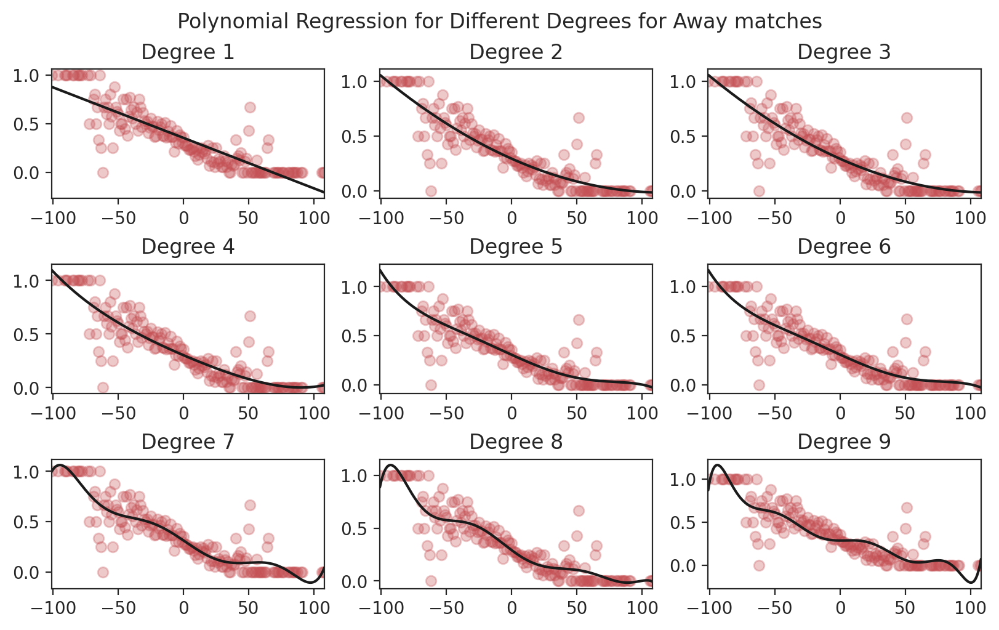

In [ ]:
orders = [1, 2, 3, 4, 5, 6, 7, 8, 9]
fig, axs = plt.subplots(3, 3, figsize=(8, 5), constrained_layout=True)
lr_models_A = []

for ax, order in zip(axs.ravel(), orders):
    model = make_pipeline(
        PolynomialFeatures(order, include_bias=True),
        LinearRegression()
    )
    lr_models_A.append(
        model.fit(cross_tab_result['TGD'].values.reshape(-1, 1), cross_tab_result['A'])
    )
    ax.set_xlim(cross_tab_result['TGD'].min(), cross_tab_result['TGD'].max())
    ax.scatter(cross_tab_result['TGD'], cross_tab_result['A'], alpha=0.3, marker='o', c='r')
    ax.plot(x_pred_range['TGD'], model.predict(x_pred_range['TGD'].values.reshape(-1, 1)), c='k')
    ax.set_title(f'Degree {order}')

fig.suptitle("Polynomial Regression for Different Degrees for Away matches", fontsize=12);


In [ ]:
# Loop through the lr_models_A list
for i, model in enumerate(lr_models_A):
    pred_A = model.predict(tester.values)

    # Calculate RMSE
    rmse = mean_squared_error(cross_tab_result['A'], pred_A, squared=False)

    # Calculate R-squared
    r_squared = r2_score(cross_tab_result['A'], pred_A)

    # Print the results for each model
    print(f"Results for Degree {i + 1}:")
    print(f"RMSE: {rmse}")
    print(f"R-squared: {r_squared}")
    print()

Results for Degree 1:
RMSE: 0.15516513750875144
R-squared: 0.740117720598801

Results for Degree 2:
RMSE: 0.14596539913426268
R-squared: 0.7700209877654152

Results for Degree 3:
RMSE: 0.14593510389177072
R-squared: 0.7701164425369382

Results for Degree 4:
RMSE: 0.14583207819217672
R-squared: 0.7704409094217861

Results for Degree 5:
RMSE: 0.1428413819074524
R-squared: 0.7797598712969885

Results for Degree 6:
RMSE: 0.1429222904675081
R-squared: 0.7795103027466067

Results for Degree 7:
RMSE: 0.14754726071488025
R-squared: 0.7650093037356602

Results for Degree 8:
RMSE: 0.1464252865722536
R-squared: 0.7685695331972067

Results for Degree 9:
RMSE: 0.15569729348729283
R-squared: 0.7383320738368844



In [ ]:
# Loop through the lr_models_A list and calculate RMSE and R-squared for each model
results_A = []
for i, model in enumerate(lr_models_A):
    pred_A = model.predict(tester.values)
    rmse_A = mean_squared_error(cross_tab_result['A'], pred_A, squared=False)
    r_squared_A = r2_score(cross_tab_result['A'], pred_A)
    results_A.append((i + 1, rmse_A, r_squared_A))

# Find the model with the lowest RMSE and highest R-squared score
best_model_idx_A = np.argmin([result[1] for result in results_A])
selected_degree_A, selected_rmse_A, selected_r_squared_A = results_A[best_model_idx_A]

# Get the coefficients_A of the selected model
selected_model_A = lr_models_A[best_model_idx_A]
coefficients_A = selected_model_A[-1].coef_
intercept_A = selected_model_A[-1].intercept_

# Print the results_A for the selected model
print(f"Best fit is obtained for Degree {selected_degree_A}:")
print(f"RMSE: {selected_rmse_A}")
print(f"R-squared: {selected_r_squared_A}")
print(f"Polynomial Regression Equation: A = {intercept_A:.2f}", end="")
for i, coef in enumerate(coefficients_A[1:], start=1):
    print(f" + ({coef:.8f} * TGD^{i})", end="")
print()


Best fit is obtained for Degree 5:
RMSE: 0.1428413819074524
R-squared: 0.7797598712969885
Polynomial Regression Equation: A = 0.31 + (-0.00604256 * TGD^1) + (0.00000843 * TGD^2) + (0.00000036 * TGD^3) + (0.00000000 * TGD^4) + (-0.00000000 * TGD^5)


In [ ]:
# Get the coefficients of the selected model
coefficients_A = selected_model_A[-1].coef_
intercept_A = selected_model_A[-1].intercept_

# Feature engineering and calculating 'Prob_A' using polynomial regression equation
filtered_data1['Prob_A'] = intercept_A
for i, coef in enumerate(coefficients_A[1:], start=1):
    filtered_data1['Prob_A'] += coef * filtered_data1['TGD']**i

# Print the results
print(filtered_data1[['TGD', 'Prob_A']])


      TGD    Prob_A
50      0  0.305436
1225    0  0.305436
1426    0  0.305436
2033    0  0.305436
2549    0  0.305436
...   ...       ...
1326    9  0.252010
1614  -31  0.492745
1708   -6  0.341919
2424   11  0.240491
2895  -65  0.706076

[4180 rows x 2 columns]


# Home match polynomial regression

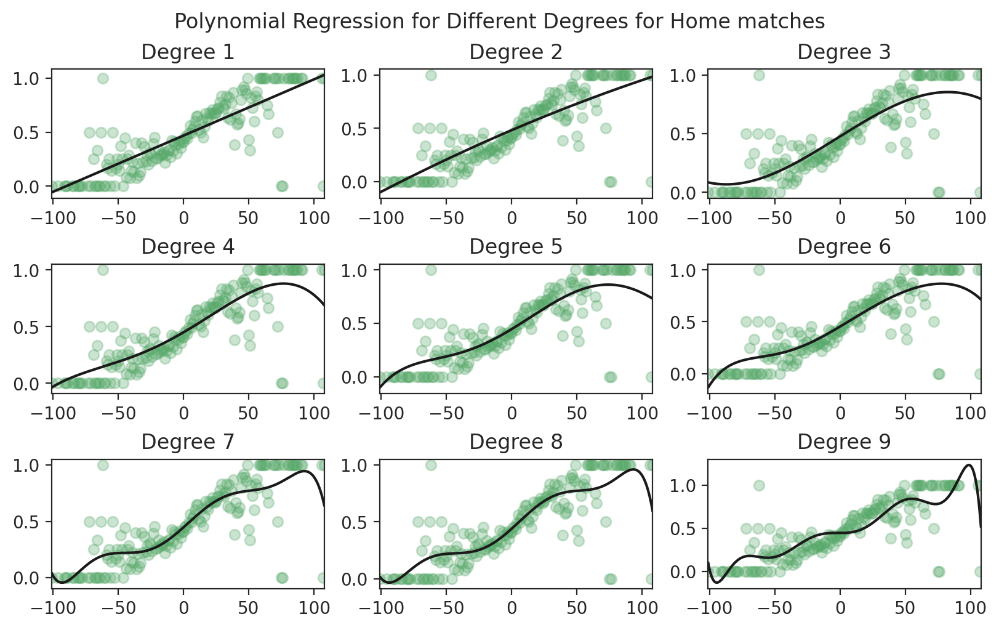

In [ ]:
orders = [1, 2, 3, 4, 5, 6, 7, 8, 9]
fig, axs = plt.subplots(3, 3, figsize=(8, 5), constrained_layout=True)
lr_models_H = []

for ax, order in zip(axs.ravel(), orders):
    model = make_pipeline(
        PolynomialFeatures(order, include_bias=True),
        LinearRegression()
    )
    lr_models_H.append(
        model.fit(cross_tab_result['TGD'].values.reshape(-1, 1), cross_tab_result['H'])
    )
    ax.set_xlim(cross_tab_result['TGD'].min(), cross_tab_result['TGD'].max())
    ax.scatter(cross_tab_result['TGD'], cross_tab_result['H'], alpha=0.3, marker='o', c='g')
    ax.plot(x_pred_range['TGD'], model.predict(x_pred_range['TGD'].values.reshape(-1, 1)), c='k')
    ax.set_title(f'Degree {order}')

fig.suptitle("Polynomial Regression for Different Degrees for Home matches", fontsize=12);


In [ ]:
# Loop through the lr_models_H list
for i, model in enumerate(lr_models_H):
    pred_H = model.predict(tester.values)

    # Calculate RMSE
    rmseH = mean_squared_error(cross_tab_result['H'], pred_H, squared=False)

    # Calculate R-squared
    r_squared = r2_score(cross_tab_result['H'], pred_H)

    # Print the results for each model
    print(f"Results for Degree {i + 1}:")
    print(f"RMSE: {rmseH}")
    print(f"R-squared: {r_squared}")
    print()

Results for Degree 1:
RMSE: 0.19387106659520825
R-squared: 0.6525490666409521

Results for Degree 2:
RMSE: 0.19403386300762246
R-squared: 0.6519653022334894

Results for Degree 3:
RMSE: 0.18882531643100445
R-squared: 0.6703994515000268

Results for Degree 4:
RMSE: 0.18848478670268537
R-squared: 0.6715871903160033

Results for Degree 5:
RMSE: 0.18698416495888406
R-squared: 0.6767956912760009

Results for Degree 6:
RMSE: 0.18672923331444616
R-squared: 0.6776763951347514

Results for Degree 7:
RMSE: 0.1883364967063558
R-squared: 0.6721037431662693

Results for Degree 8:
RMSE: 0.18868553903849336
R-squared: 0.6708872425892418

Results for Degree 9:
RMSE: 0.20801927213030988
R-squared: 0.5999865186319995



In [ ]:
# Loop through the lr_models_H list and calculate RMSE and R-squared for each model
results_H = []
for i, model in enumerate(lr_models_H):
    pred_H = model.predict(tester.values)
    rmse_H = mean_squared_error(cross_tab_result['H'], pred_H, squared=False)
    r_squared_H = r2_score(cross_tab_result['H'], pred_H)
    results_H.append((i + 1, rmse_H, r_squared_H))

# Find the model with the lowest RMSE and highest R-squared score
best_model_idx_H = np.argmin([result[1] for result in results_H])
selected_degree_H, selected_rmse_H, selected_r_squared_H = results_H[best_model_idx_H]

# Get the coefficients of the selected model
selected_model_H = lr_models_H[best_model_idx_H]
coefficients_H = selected_model_H[-1].coef_
intercept_H = selected_model_H[-1].intercept_

# Print the results_H for the selected model
print(f"Best fit is obtained for Degree {selected_degree_H}:")
print(f"RMSE: {selected_rmse_H}")
print(f"R-squared: {selected_r_squared_H}")
print(f"Polynomial Regression Equation: H = {intercept_H:.8f}", end="")
for i, coef in enumerate(coefficients_H[1:], start=1):
    print(f" + ({coef:.8f} * TGD^{i})", end="")
print()


Best fit is obtained for Degree 6:
RMSE: 0.18672923331444616
R-squared: 0.6776763951347514
Polynomial Regression Equation: H = 0.45341580 + (0.00753682 * TGD^1) + (0.00001562 * TGD^2) + (-0.00000067 * TGD^3) + (0.00000000 * TGD^4) + (0.00000000 * TGD^5) + (-0.00000000 * TGD^6)


In [ ]:

# Get the coefficients of the selected model
coefficients_H = selected_model_H[-1].coef_
intercept_H = selected_model_H[-1].intercept_

# Feature engineering and calculating 'Prob_H' using polynomial regression equation
filtered_data1['Prob_H'] = intercept_H
for i, coef in enumerate(coefficients_H[1:], start=1):
    filtered_data1['Prob_H'] += coef * filtered_data1['TGD']**i

# Print the results
print(filtered_data1[['TGD', 'Prob_H']])


      TGD    Prob_H
50      0  0.453416
1225    0  0.453416
1426    0  0.453416
2033    0  0.453416
2549    0  0.453416
...   ...       ...
1326    9  0.522029
1614  -31  0.253568
1708   -6  0.408901
2424   11  0.537330
2895  -65  0.152023

[4180 rows x 2 columns]


## **ELO**

In [ ]:
filtered_data1['GD'] = filtered_data1['FTHG'] - filtered_data1['FTAG']

In [ ]:
dataset = filtered_data1

In [ ]:
data_13 = dataset.loc[dataset['Year']==2013].sort_values(by=['Year','MW'])
data_14 = dataset.loc[dataset['Year']==2014].sort_values(by=['Year','MW'])
data_15 = dataset.loc[dataset['Year']==2015].sort_values(by=['Year','MW'])
data_16 = dataset.loc[dataset['Year']==2016].sort_values(by=['Year','MW'])
data_17 = dataset.loc[dataset['Year']==2017].sort_values(by=['Year','MW'])
data_18 = dataset.loc[dataset['Year']==2018].sort_values(by=['Year','MW'])
data_19 = dataset.loc[dataset['Year']==2019].sort_values(by=['Year','MW'])
data_20 = dataset.loc[dataset['Year']==2020].sort_values(by=['Year','MW'])
data_21 = dataset.loc[dataset['Year']==2021].sort_values(by=['Year','MW'])
data_22 = dataset.loc[dataset['Year']==2022].sort_values(by=['Year','MW'])
data_23 = dataset.loc[dataset['Year']==2023].sort_values(by=['Year','MW'])

In [ ]:
def calculate_elo_ratings(df):
    initial_elo = 1000
    team_elo = {}

    # Function to calculate Elo ratings after a match
    def update_elo_ratings(home_team, away_team, gd, ftr, k_factor, team_elo):
        if home_team not in team_elo:
            team_elo[home_team] = initial_elo
        if away_team not in team_elo:
            team_elo[away_team] = initial_elo

        gamma_home = 1 / (1 + 10 ** ((team_elo[away_team] - team_elo[home_team]) / 400))
        gamma_away = 1 - gamma_home

        if ftr == 'H':  # Home team wins
            result_home, result_away = 1, 0
        elif ftr == 'A':  # Away team wins
            result_home, result_away = 0, 1
        else:  # Draw
            result_home, result_away = 0.5, 0.5

        # Update Elo ratings after the match
        team_elo[home_team] += k_factor * (result_home - gamma_home)
        team_elo[away_team] += k_factor * (result_away - gamma_away)
        return team_elo

    df['Elo_Before_Home'] = df['Elo_Before_Away'] = initial_elo

    for i in range(1, df['MW'].max() + 1):
        current_week = df[df['MW'] == i]

        for index, row in current_week.iterrows():
            home_team = row['HomeTeam']
            away_team = row['AwayTeam']
            gd = row['GD']
            ftr = row['FTR']
            k_factor = 10 * (1 + abs(gd))

            # Update Elo ratings after the match
            team_elo = update_elo_ratings(home_team, away_team, gd, ftr, k_factor, team_elo)

            # Store Elo ratings for the current match
            df.at[index, 'Elo_After_Home'] = team_elo[home_team]
            df.at[index, 'Elo_After_Away'] = team_elo[away_team]

        if i < df['MW'].max():
            next_week = df[df['MW'] == i + 1]
            for index, row in next_week.iterrows():
                home_team = row['HomeTeam']
                away_team = row['AwayTeam']
                prev_match_week = df[(df['MW'] == i) & (df['Year'] == row['Year'])]
                home_team_was_home = prev_match_week[prev_match_week['HomeTeam'] == home_team].shape[0] > 0

                if home_team_was_home:
                    df.at[index, 'Elo_Before_Home'] = prev_match_week[prev_match_week['HomeTeam'] == home_team]['Elo_After_Home'].values[0]
                else:
                    df.at[index, 'Elo_Before_Home'] = prev_match_week[prev_match_week['AwayTeam'] == home_team]['Elo_After_Away'].values[0]

                away_team_was_home = prev_match_week[prev_match_week['HomeTeam'] == away_team].shape[0] > 0

                if away_team_was_home:
                    df.at[index, 'Elo_Before_Away'] = prev_match_week[prev_match_week['HomeTeam'] == away_team]['Elo_After_Home'].values[0]
                else:
                    df.at[index, 'Elo_Before_Away'] = prev_match_week[prev_match_week['AwayTeam'] == away_team]['Elo_After_Away'].values[0]

    return df


In [ ]:
data13 = calculate_elo_ratings(data_13)
data14 = calculate_elo_ratings(data_14)
data15 = calculate_elo_ratings(data_15)
data16 = calculate_elo_ratings(data_16)
data17 = calculate_elo_ratings(data_17)
data18 = calculate_elo_ratings(data_18)
data19 = calculate_elo_ratings(data_19)
data20 = calculate_elo_ratings(data_20)
data21 = calculate_elo_ratings(data_21)
data22 = calculate_elo_ratings(data_22)
data23 = calculate_elo_ratings(data_23)

In [ ]:
elo_data = pd.concat([data13, data14, data15, data16, data17, data18, data19, data20, data21,data22,data23], axis=0)

# Reset the index if needed
elo_data.reset_index(drop=True, inplace=True)

In [ ]:
elo_data = elo_data.sort_values(by=['Year','MW'])
elo_data[['HomeTeam','AwayTeam','FTR','Elo_Before_Home','Elo_Before_Away','Elo_After_Home','Elo_After_Away','Year','MW']].sort_values(by=['Year','MW'])

,HomeTeam,AwayTeam,FTR,Elo_Before_Home,Elo_Before_Away,Elo_After_Home,Elo_After_Away,Year,MW
0,Arsenal,Sunderland,D,1000.000000,1000.000000,1000.000000,1000.000000,2013,1
1,Everton,Man United,H,1000.000000,1000.000000,1010.000000,990.000000,2013,1
2,Fulham,Norwich,H,1000.000000,1000.000000,1030.000000,970.000000,2013,1
3,Man City,Southampton,H,1000.000000,1000.000000,1010.000000,990.000000,2013,1
4,Newcastle,Tottenham,H,1000.000000,1000.000000,1010.000000,990.000000,2013,1
...,...,...,...,...,...,...,...,...,...
4175,Everton,Bournemouth,H,915.532606,889.880603,924.795621,880.617588,2023,38
4176,Leeds,Tottenham,A,857.521120,997.401812,845.164702,1009.758230,2023,38
4177,Leicester,West Ham,H,910.002116,961.753993,921.480735,950.275373,2023,38
4178,Man United,Fulham,H,1077.878645,1006.092686,1085.841387,998.129943,2023,38


## **No. of days between matches**

In [ ]:
elo_data.columns

Index(['Div', 'Date', 'Time', 'HomeTeam', 'AwayTeam', 'FTHG', 'FTAG', 'FTR',
       'HTHG', 'HTAG', 'HTR', 'Referee', 'HS', 'AS', 'HST', 'AST', 'HF', 'AF',
       'HC', 'AC', 'HY', 'AY', 'HR', 'AR', 'AvgH', 'AvgD', 'AvgA', 'MaxH',
       'MaxD', 'MaxA', 'MW', 'Year', 'Max>2.5', 'BbMx>2.5', 'Max<2.5',
       'BbMx<2.5', 'Avg>2.5', 'BbAv>2.5', 'Avg<2.5', 'BbAv<2.5', 'Overall_H',
       'Attack_H', 'Midfield_H', 'Defence_H', 'Overall_A', 'Attack_A',
       'Midfield_A', 'Defence_A', 'H_TR', 'A_TR', 'H_SK', 'A_SK', 'H_SP',
       'A_SP', 'H_F', 'A_F', 'HCGS', 'HCGC', 'ACGS', 'ACGC', 'HTGD', 'ATGD',
       'TGD', 'Prob_D', 'Prob_A', 'Prob_H', 'GD', 'Elo_Before_Home',
       'Elo_Before_Away', 'Elo_After_Home', 'Elo_After_Away'],
      dtype='object')

In [ ]:
from datetime import datetime, timedelta
import pandas as pd

def feature_engineer_days_between_matches(dataframe):
    # Convert the 'Date' column to datetime format
    dataframe['Date'] = pd.to_datetime(dataframe['Date'])

    for index, row in dataframe.iterrows():
        home_team = row['HomeTeam']
        away_team = row['AwayTeam']
        match_date = row['Date']
        matchweek = row['MW']

        # Check if it's matchweek 1 and set Days_H and Days_A as 60
        if matchweek == 1:
            dataframe.at[index, 'Days_H'] = 60
            dataframe.at[index, 'Days_A'] = 60

        else:
            prev_match_week = matchweek - 1

            # Check if the home team was home in the previous match week
            if home_team in dataframe.loc[(dataframe['MW'] == prev_match_week) &
                                          (dataframe['Year'] == row['Year']), 'HomeTeam'].values:
                prev_home = dataframe.loc[(dataframe['MW'] == prev_match_week) &
                                          (dataframe['HomeTeam'] == home_team) &
                                          (dataframe['Year'] == row['Year'])]
                prev_home_date = prev_home['Date'].values[0]
                days_gap = abs(match_date - prev_home_date).days
                dataframe.at[index, 'Days_H'] = days_gap

            elif home_team in dataframe.loc[(dataframe['MW'] == prev_match_week) &
                                            (dataframe['Year'] == row['Year']), 'AwayTeam'].values:
                prev_home = dataframe.loc[(dataframe['MW'] == prev_match_week) &
                                          (dataframe['AwayTeam'] == home_team) &
                                          (dataframe['Year'] == row['Year'])]
                prev_home_date = prev_home['Date'].values[0]
                days_gap = abs(match_date - prev_home_date).days
                dataframe.at[index, 'Days_H'] = days_gap

            # Check if the away team was home in the previous match week
            if away_team in dataframe.loc[(dataframe['MW'] == prev_match_week) &
                                          (dataframe['Year'] == row['Year']), 'HomeTeam'].values:
                prev_away = dataframe.loc[(dataframe['MW'] == prev_match_week) &
                                          (dataframe['HomeTeam'] == away_team) &
                                          (dataframe['Year'] == row['Year'])]
                prev_away_date = prev_away['Date'].values[0]
                days_gap = abs(match_date - prev_away_date).days
                dataframe.at[index, 'Days_A'] = days_gap

            elif away_team in dataframe.loc[(dataframe['MW'] == prev_match_week) &
                                            (dataframe['Year'] == row['Year']), 'AwayTeam'].values:
                prev_away = dataframe.loc[(dataframe['MW'] == prev_match_week) &
                                          (dataframe['AwayTeam'] == away_team) &
                                          (dataframe['Year'] == row['Year'])]
                prev_away_date = prev_away['Date'].values[0]
                days_gap = abs(match_date - prev_away_date).days
                dataframe.at[index, 'Days_A'] = days_gap

    return dataframe


In [ ]:
# Assuming your dataframe is named 'football_data', call the function to perform feature engineering
football_data = feature_engineer_days_between_matches(elo_data)

In [ ]:
football_data['Days_D'] = football_data['Days_H'] - football_data['Days_A']

In [ ]:
football_data[['Date','MW','Year','HomeTeam','AwayTeam','Days_D']].sort_values(by=['Year','MW'])

,Date,MW,Year,HomeTeam,AwayTeam,Days_D
0,2012-08-18,1,2013,Arsenal,Sunderland,0.0
1,2012-08-20,1,2013,Everton,Man United,0.0
2,2012-08-18,1,2013,Fulham,Norwich,0.0
3,2012-08-19,1,2013,Man City,Southampton,0.0
4,2012-08-18,1,2013,Newcastle,Tottenham,0.0
...,...,...,...,...,...,...
4175,2023-05-28,38,2023,Everton,Bournemouth,0.0
4176,2023-05-28,38,2023,Leeds,Tottenham,-1.0
4177,2023-05-28,38,2023,Leicester,West Ham,-1.0
4178,2023-05-28,38,2023,Man United,Fulham,0.0


In [ ]:
elo_data = football_data

#**Dropping columns**

In [ ]:
elo_data.columns

Index(['Div', 'Date', 'Time', 'HomeTeam', 'AwayTeam', 'FTHG', 'FTAG', 'FTR',
       'HTHG', 'HTAG', 'HTR', 'Referee', 'HS', 'AS', 'HST', 'AST', 'HF', 'AF',
       'HC', 'AC', 'HY', 'AY', 'HR', 'AR', 'AvgH', 'AvgD', 'AvgA', 'MaxH',
       'MaxD', 'MaxA', 'MW', 'Year', 'Max>2.5', 'BbMx>2.5', 'Max<2.5',
       'BbMx<2.5', 'Avg>2.5', 'BbAv>2.5', 'Avg<2.5', 'BbAv<2.5', 'Overall_H',
       'Attack_H', 'Midfield_H', 'Defence_H', 'Overall_A', 'Attack_A',
       'Midfield_A', 'Defence_A', 'H_TR', 'A_TR', 'H_SK', 'A_SK', 'H_SP',
       'A_SP', 'H_F', 'A_F', 'HCGS', 'HCGC', 'ACGS', 'ACGC', 'HTGD', 'ATGD',
       'TGD', 'Prob_D', 'Prob_A', 'Prob_H', 'GD', 'Elo_Before_Home',
       'Elo_Before_Away', 'Elo_After_Home', 'Elo_After_Away', 'Days_H',
       'Days_A', 'Days_D'],
      dtype='object')

In [ ]:
tar_col=['FTHG', 'FTAG','HTHG', 'HTAG', 'HTR','GD','Elo_After_Home', 'Elo_After_Away']
cat_col=['HomeTeam', 'AwayTeam','HTR', 'Referee','H_TR', 'A_TR','H_SK', 'A_SK']
other_col=['Div','Time','HCGS', 'HCGC', 'ACGS','ACGC','Date','Days_H',\
           'Days_A','BbMx>2.5','BbMx<2.5','BbAv>2.5','BbAv<2.5']

In [ ]:
pl = elo_data.drop(columns=tar_col + cat_col + other_col)

In [ ]:
pl.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4180 entries, 0 to 4179
Data columns (total 46 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   FTR              4180 non-null   object 
 1   HS               4180 non-null   float64
 2   AS               4180 non-null   float64
 3   HST              4180 non-null   float64
 4   AST              4180 non-null   float64
 5   HF               4180 non-null   float64
 6   AF               4180 non-null   float64
 7   HC               4180 non-null   float64
 8   AC               4180 non-null   float64
 9   HY               4180 non-null   float64
 10  AY               4180 non-null   float64
 11  HR               4180 non-null   float64
 12  AR               4180 non-null   float64
 13  AvgH             4180 non-null   float64
 14  AvgD             4180 non-null   float64
 15  AvgA             4180 non-null   float64
 16  MaxH             4180 non-null   float64
 17  MaxD          

In [ ]:
pl.sample(5)

,FTR,HS,AS,HST,AST,HF,AF,HC,AC,HY,...,A_F,HTGD,ATGD,TGD,Prob_D,Prob_A,Prob_H,Elo_Before_Home,Elo_Before_Away,Days_D
998,H,23.0,7.0,8.0,3.0,8.0,12.0,10.0,3.0,3.0,...,2.850,5,19,-14,0.259243,0.390781,0.352781,1046.058156,1102.254126,1.0
1420,D,20.0,16.0,7.0,5.0,9.0,10.0,8.0,4.0,1.0,...,6.557,4,-3,7,0.236566,0.263679,0.506711,1038.151186,999.287868,1.0
4121,A,15.0,7.0,4.0,1.0,5.0,13.0,5.0,2.0,1.0,...,-15.695,-6,5,-11,0.258254,0.372475,0.373287,952.397990,1011.657980,25.0
1483,H,18.0,9.0,9.0,1.0,15.0,10.0,4.0,6.0,1.0,...,-6.315,26,-11,37,0.160902,0.112904,0.722002,1146.998555,946.695513,-1.0
4076,H,16.0,6.0,7.0,2.0,8.0,8.0,6.0,3.0,0.0,...,-2.444,42,-14,56,0.115338,0.057000,0.820405,1170.156973,926.503473,1.0


## **Constructing crrelation heat map to identify highly correlated features in the dataset**

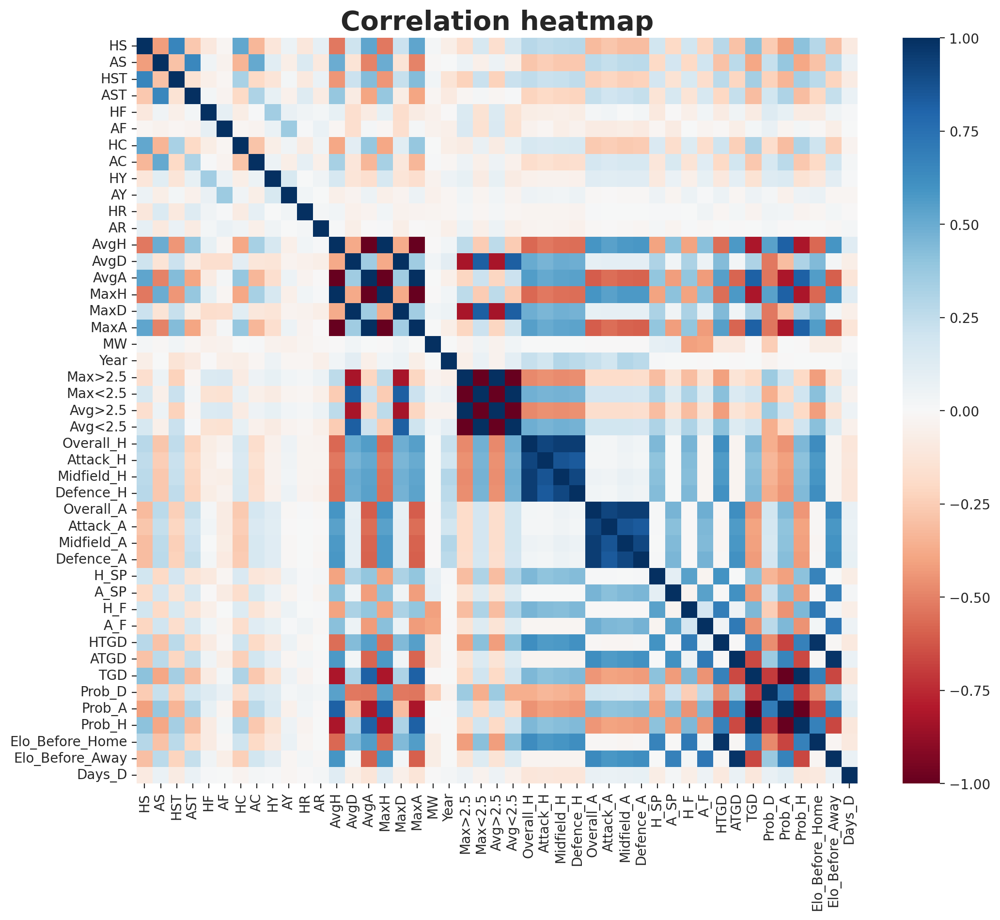

In [ ]:
corr_matrix = pl.corr(method='spearman', numeric_only=True)

plt.figure(figsize=(12, 10))  # Adjust the figure size as needed

sns.heatmap(corr_matrix, annot=False, cmap="RdBu")
plt.yticks(rotation=0)
plt.xticks(rotation=90)

plt.title('Correlation heatmap', fontsize=20, fontweight="bold")
plt.show()

In [ ]:
# Identify features with correlation greater than 0.9
high_corr_features = []
threshold = 0.9

for column in corr_matrix.columns:
    correlated_cols = corr_matrix.index[abs(corr_matrix[column]) > threshold].tolist()
    correlated_cols.remove(column)  # Remove the same column
    for correlated_col in correlated_cols:
        high_corr_features.append((column, correlated_col))

# Display the highly correlated features
print("Highly correlated features:")
for feature_pair in high_corr_features:
    print(f"{feature_pair[0]} - {feature_pair[1]}: {corr_matrix.loc[feature_pair[0], feature_pair[1]]}")

Highly correlated features:
AvgH - AvgA: -0.9973263109946223
AvgH - MaxH: 0.9996162999403845
AvgH - MaxA: -0.9966232716983291
AvgD - MaxD: 0.9926282812277348
AvgA - AvgH: -0.9973263109946223
AvgA - MaxH: -0.9968879343502967
AvgA - MaxA: 0.99953313819222
MaxH - AvgH: 0.9996162999403845
MaxH - AvgA: -0.9968879343502967
MaxH - MaxA: -0.9961468733403305
MaxD - AvgD: 0.9926282812277348
MaxA - AvgH: -0.9966232716983291
MaxA - AvgA: 0.99953313819222
MaxA - MaxH: -0.9961468733403305
Max>2.5 - Max<2.5: -0.9938562089933876
Max>2.5 - Avg>2.5: 0.9979274088687614
Max>2.5 - Avg<2.5: -0.9960034291128426
Max<2.5 - Max>2.5: -0.9938562089933876
Max<2.5 - Avg>2.5: -0.9954108190294724
Max<2.5 - Avg<2.5: 0.9966610877659121
Avg>2.5 - Max>2.5: 0.9979274088687614
Avg>2.5 - Max<2.5: -0.9954108190294724
Avg>2.5 - Avg<2.5: -0.9966467654600529
Avg<2.5 - Max>2.5: -0.9960034291128426
Avg<2.5 - Max<2.5: 0.9966610877659121
Avg<2.5 - Avg>2.5: -0.9966467654600529
Overall_H - Attack_H: 0.9180663468280399
Overall_H - Mid

In [ ]:
pl = pl.drop(columns=['HTGD','ATGD','Prob_A','Prob_H'])

In [ ]:
len(pl.columns)

42

## **Calculating the difference of some features to drop them from model building**

In [ ]:
# calcualating the difference parameters so that individual parameters can be dropped and hence the overall parameters can be brought to
# 48 in total number. Hence i can make a sqaure structure

pl['form_diff'] = pl['H_F'] - pl['A_F']
pl['SP_diff'] = pl['H_SP'] - pl['A_SP']
pl['Overall_diff'] = pl['Overall_H'] - pl['Overall_A']
pl['Attack_diff'] = pl['Attack_H'] - pl['Attack_A']
pl['Midfield_diff'] = pl['Midfield_H'] - pl['Midfield_A']
pl['Defence_diff'] = pl['Defence_H'] - pl['Defence_A']

In [ ]:
# dropping the redundend 12 features in the dataset, so total features can be brought down to 36

pl = pl.drop(columns=['H_F','A_F','H_SP','A_SP','Overall_H','Overall_A', 'Attack_H', \
                                       'Attack_A', 'Midfield_H','Midfield_A','Defence_H','Defence_A' ])

In [ ]:
pl.columns

Index(['FTR', 'HS', 'AS', 'HST', 'AST', 'HF', 'AF', 'HC', 'AC', 'HY', 'AY',
       'HR', 'AR', 'AvgH', 'AvgD', 'AvgA', 'MaxH', 'MaxD', 'MaxA', 'MW',
       'Year', 'Max>2.5', 'Max<2.5', 'Avg>2.5', 'Avg<2.5', 'TGD', 'Prob_D',
       'Elo_Before_Home', 'Elo_Before_Away', 'Days_D', 'form_diff', 'SP_diff',
       'Overall_diff', 'Attack_diff', 'Midfield_diff', 'Defence_diff'],
      dtype='object')

In [ ]:
len(pl.columns)

36

# **Train-test-validation split of the dataset**

In [ ]:
from sklearn.model_selection import train_test_split


X = pl.drop(columns=['FTR'])
y = pl['FTR']

# Split the data into training, validation, and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, stratify=y_train, test_size=0.2, random_state=42)

## scaling the data

In [ ]:
norm_cols=['MW', 'Year','Overall_diff', 'Attack_diff',\
       'Midfield_diff', 'Defence_diff']

In [ ]:
std_cols = [col for col in X_train.columns if col not in norm_cols]

In [ ]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler,Normalizer

In [ ]:
# Create transformers
stdscaling_transformer = StandardScaler()
normscaling_transformer = Normalizer()

# Create a ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ("std", stdscaling_transformer, std_cols),
        ("norm", normscaling_transformer, norm_cols)
    ],
    remainder='passthrough'
)

# Apply the transformations and convert back to a pandas DataFrame
X_train_scale = preprocessor.fit_transform(X_train)
X_train_scale = pd.DataFrame(X_train_scale, columns=std_cols + norm_cols)

In [ ]:
X_train_scale.head(5)

,HS,AS,HST,AST,HF,AF,HC,AC,HY,AY,...,Elo_Before_Away,Days_D,form_diff,SP_diff,MW,Year,Overall_diff,Attack_diff,Midfield_diff,Defence_diff
0,-1.396419,0.555852,-0.342593,1.196182,0.439857,-0.258782,-0.921011,-0.630620,1.220044,-0.585084,...,1.341247,0.093985,-2.073264,-0.171657,0.017384,0.999826,-0.002980,-0.003973,-0.002980,-0.003477
1,2.468657,-0.466638,1.760932,-0.838788,-1.043524,-1.097526,0.692840,-0.630620,-0.421615,-1.357973,...,0.841969,-0.093076,-0.088650,-0.567289,0.005932,0.999979,0.000494,-0.001483,0.001977,0.000989
2,1.238860,0.146856,0.709170,-0.431794,-0.450171,-2.495432,0.370070,-0.630620,-0.421615,-1.357973,...,-0.407460,-0.093076,0.087822,2.004324,0.001978,0.999969,0.003462,0.002473,0.004451,0.004451
3,-1.396419,1.373844,-1.394355,-0.024800,0.736533,1.139124,-1.243782,2.332769,1.220044,0.960694,...,2.074483,0.093985,-0.902241,-0.171657,0.013881,0.999896,-0.001983,-0.001487,-0.001983,-0.002479
4,-0.517992,0.351354,-0.693180,-0.024800,0.143181,-0.258782,-0.598241,0.480651,-0.421615,-0.585084,...,0.171091,0.187516,-0.005569,-1.160738,0.008436,0.999957,-0.001489,-0.001489,-0.000993,-0.002978


In [ ]:
X_val_scale = preprocessor.fit_transform(X_val)
X_val_scale = pd.DataFrame(X_val_scale, columns=std_cols + norm_cols)

X_val_scale.head(5)

,HS,AS,HST,AST,HF,AF,HC,AC,HY,AY,...,Elo_Before_Away,Days_D,form_diff,SP_diff,MW,Year,Overall_diff,Attack_diff,Midfield_diff,Defence_diff
0,-0.163338,0.073125,-1.073667,0.280915,0.426005,0.298330,1.022407,0.070750,-0.497892,-1.378599,...,-0.300668,0.029292,-0.021987,-0.758409,0.003968,0.999990,-0.000496,-0.001488,-0.000992,0.000000
1,0.018481,-0.336252,-0.049985,-0.503771,-0.473040,-0.557024,-0.271192,0.070750,-0.497892,0.219811,...,-0.787930,-0.054452,0.756453,1.721466,0.010874,0.999923,0.002966,0.002471,0.003954,0.002471
2,1.654851,-1.769070,0.291242,-0.896114,-0.173358,0.868566,1.992606,-1.021518,1.159272,4.215836,...,0.265328,0.029292,0.266892,0.688185,0.009910,0.999913,0.003964,0.005946,0.003964,0.002973
3,0.563938,-1.564382,0.632469,-1.288458,-1.671767,-1.127260,0.375608,-1.385607,-0.497892,-0.579394,...,-0.183157,0.113035,0.124521,1.721466,0.005934,0.999963,0.002967,0.002473,0.003956,0.002967
4,0.563938,-1.155005,0.291242,-0.503771,0.426005,1.153684,2.639406,-0.657428,2.816437,1.019016,...,-0.435738,-0.054452,-0.104982,0.481529,0.005462,0.999984,0.000497,0.000993,0.000000,0.000497


In [ ]:
X_test_scale = preprocessor.fit_transform(X_test)
X_test_scale = pd.DataFrame(X_test_scale, columns=std_cols + norm_cols)

X_test_scale.head(5)

,HS,AS,HST,AST,HF,AF,HC,AC,HY,AY,...,Elo_Before_Away,Days_D,form_diff,SP_diff,MW,Year,Overall_diff,Attack_diff,Midfield_diff,Defence_diff
0,-0.561743,0.544859,-0.690512,1.858131,-1.599067,0.662203,1.707644,0.137403,-1.295508,1.093057,...,-0.059681,0.033114,0.137591,1.014738,0.006448,0.999973,0.000992,0.000992,0.002480,0.001984
1,-0.201469,1.573545,-1.023808,0.693956,-1.021482,0.947713,-1.209775,0.873739,-0.474398,1.936043,...,-0.174328,0.033114,0.174896,2.477192,0.001488,0.999987,-0.002480,-0.001984,-0.001984,-0.002976
2,-0.922016,1.779283,-1.023808,2.246189,0.133687,1.233222,0.411013,-0.598934,-0.474398,-0.592913,...,0.395013,0.142535,-0.380491,-1.520183,0.010885,0.999937,-0.001484,-0.001484,-0.001484,-0.000990
3,0.338942,-1.101039,0.309375,-0.082161,-1.021482,1.518731,3.004274,0.137403,1.167824,3.622013,...,-0.043499,0.142535,0.107122,0.429756,0.002978,0.999993,0.000496,0.000496,0.001489,0.001489
4,-0.741879,-0.483827,-0.690512,-0.470219,-0.732690,0.091185,-0.561460,-0.967103,-0.474398,-0.592913,...,0.854950,0.033114,0.844239,1.014738,0.012864,0.999891,0.003463,0.003463,0.003463,0.003958


# Logistic Regression

In [ ]:
from sklearn.linear_model import LogisticRegression
lg = LogisticRegression(multi_class='ovr', solver='liblinear',C = 0.1, class_weight= 'balanced', penalty = 'l1')

In [ ]:
X_train_scale = X_train_scale[['HS', 'AS', 'HST', 'AST', 'AC', 'HR', 'AR', 'AvgH', 'AvgA', 'MaxA']]
X_val_scale = X_val_scale[['HS', 'AS', 'HST', 'AST', 'AC', 'HR', 'AR', 'AvgH', 'AvgA', 'MaxA']]
X_test_scale = X_test_scale[['HS', 'AS', 'HST', 'AST', 'AC', 'HR', 'AR', 'AvgH', 'AvgA', 'MaxA']]

In [ ]:
import numpy as np
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE
from sklearn.metrics import  make_scorer,f1_score,precision_score,recall_score

kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Initialize lists to store cross-validation results
cv_scores = []

# Iterate over the cross-validation folds
for train_idx, val_idx in kfold.split(X_train_scale, y_train):
    # Split the training data into training and validation sets for the fold
    X_train_fold, X_val_fold = X_train_scale.iloc[train_idx], X_train_scale.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]


smote = SMOTE(sampling_strategy='auto', random_state=42)

X_train_fold_resampled, y_train_fold_resampled = smote.fit_resample(X_train_fold, y_train_fold)

lg.fit(X_train_fold_resampled, y_train_fold_resampled)

LogisticRegression(C=0.1, class_weight='balanced', multi_class='ovr',
                   penalty='l1', solver='liblinear')

In [ ]:
from sklearn.metrics import classification_report

y_pred_lg = lg.predict(X_test_scale)
class_report_lg = classification_report(y_test, y_pred_lg)
print("\nClassification Report:")
print(class_report_lg)


Classification Report:
              precision    recall  f1-score   support

           A       0.62      0.68      0.65       260
           D       0.33      0.36      0.34       190
           H       0.74      0.66      0.70       386

    accuracy                           0.60       836
   macro avg       0.56      0.57      0.56       836
weighted avg       0.61      0.60      0.60       836



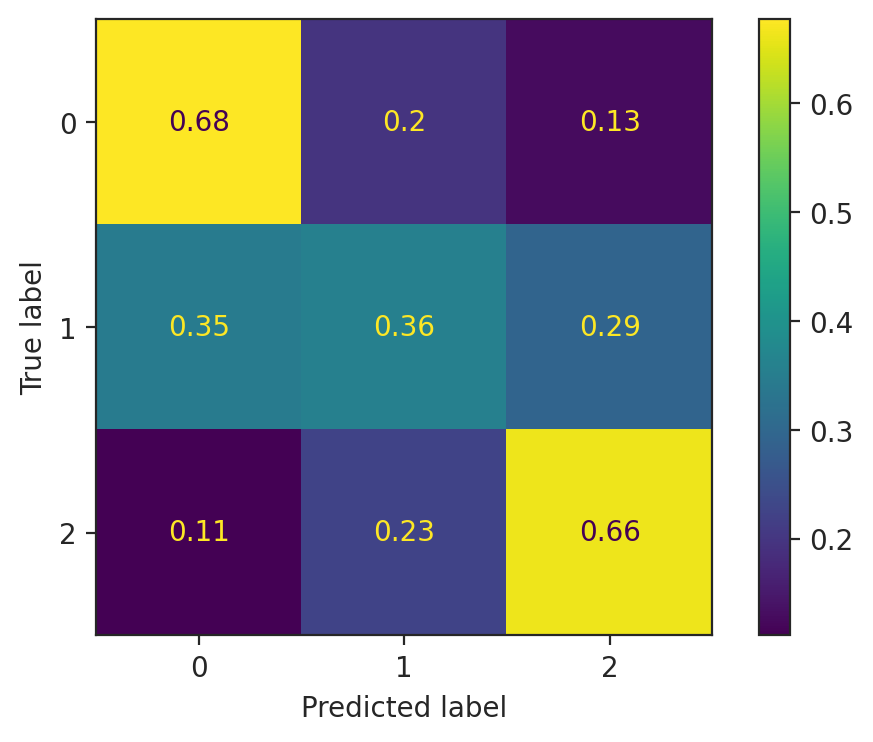

In [ ]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_test,lg.predict(X_test_scale),normalize='true')
ConfusionMatrixDisplay(confusion_matrix=cm).plot();

## **SHAP**

In [ ]:
row_idx=0

In [ ]:
y_test.iloc[row_idx]

'A'

In [ ]:
# Extract the first instance from your test data (you can replace 0 with the desired row index)
instance = X_test_scale.iloc[0]

# Make a prediction for the instance using the hgc model
prediction = lg.predict([instance])

# 'prediction' now contains the predicted class label for the instance
print(f"Predicted Class: {prediction[0]}")

Predicted Class: A


X does not have valid feature names, but LogisticRegression was fitted with feature names


In [ ]:
# explainer = shap.Explainer(logistic_model, X_train)

In [ ]:
explainer = shap.Explainer(lg,X_train_fold_resampled)

In [ ]:
shap_values = explainer.shap_values(X_test_scale)

In [ ]:
shap.initjs()
# Obtain the expected base value from the explainer
expected_value = explainer.expected_value

# Plot the force plot with the expected base value as the first parameter
# Plot the force plot with the expected base value as the first parameter
shap.force_plot(
    explainer.expected_value[0],  # First parameter is the expected base value
    shap_values[0][row_idx],
    X_test_scale.iloc[row_idx]
)

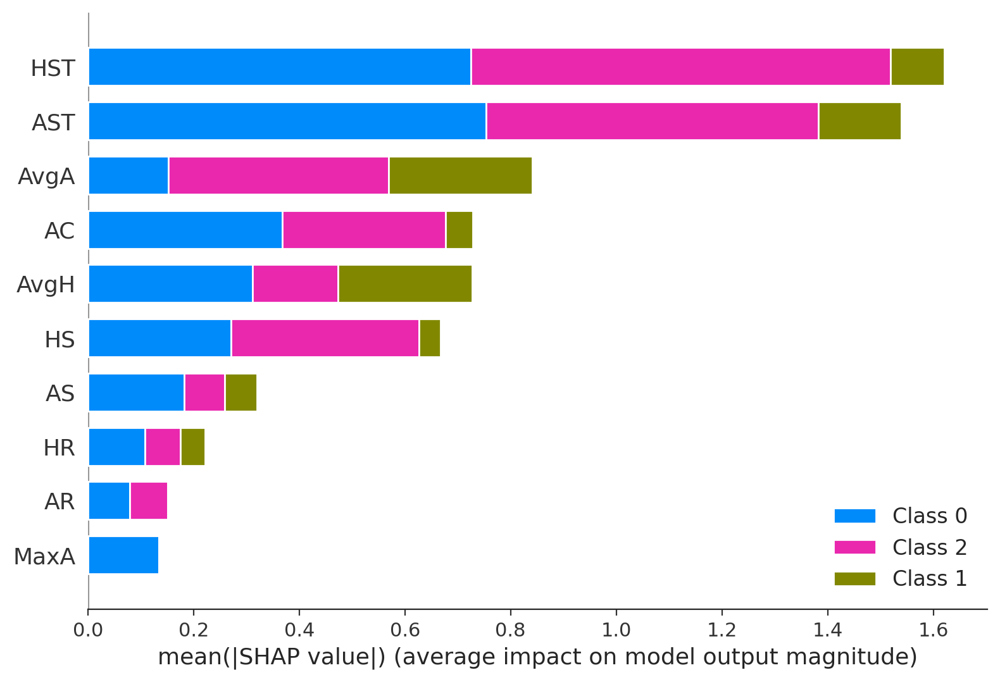

In [ ]:
shap.summary_plot(shap_values, X_test_scale)

In [ ]:
explanation = shap.Explanation(
    values=shap_values[0][row_idx],
    base_values=expected_value[0],
    data=X_test_scale.iloc[row_idx],
    feature_names=X_test_scale.columns
)

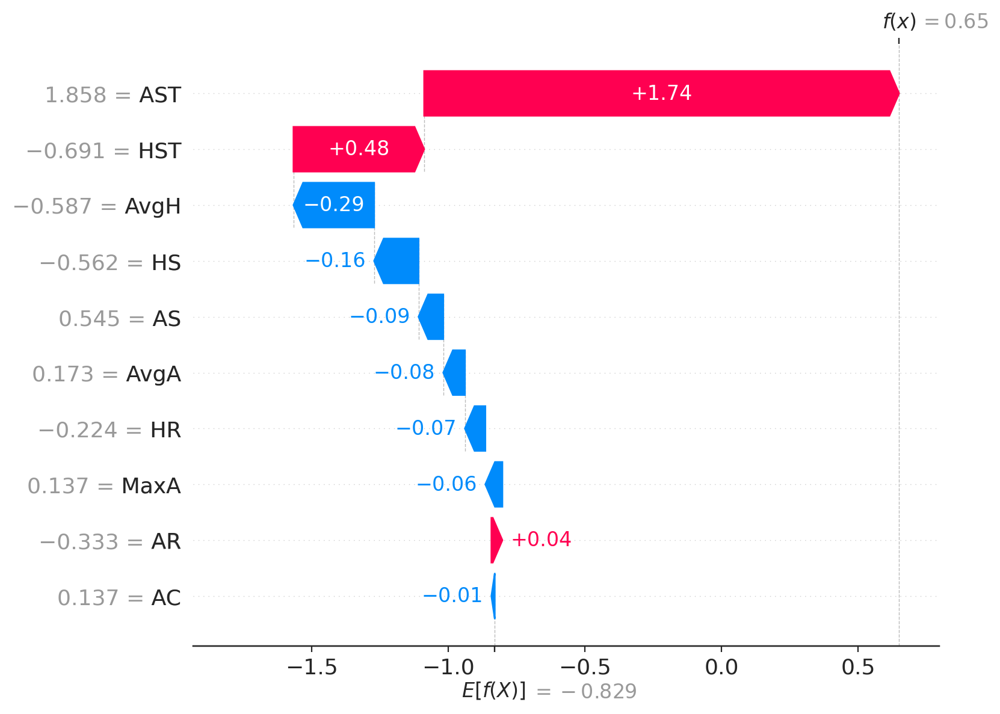

In [ ]:
shap.initjs()
shap.plots.waterfall(explanation)

## **Absolute mean SHAP**

In [ ]:
explanation = shap.Explanation(
    values=shap_values[0],
    base_values=expected_value[0],
    data=X_test_scale,
    feature_names=X_test_scale.columns
)

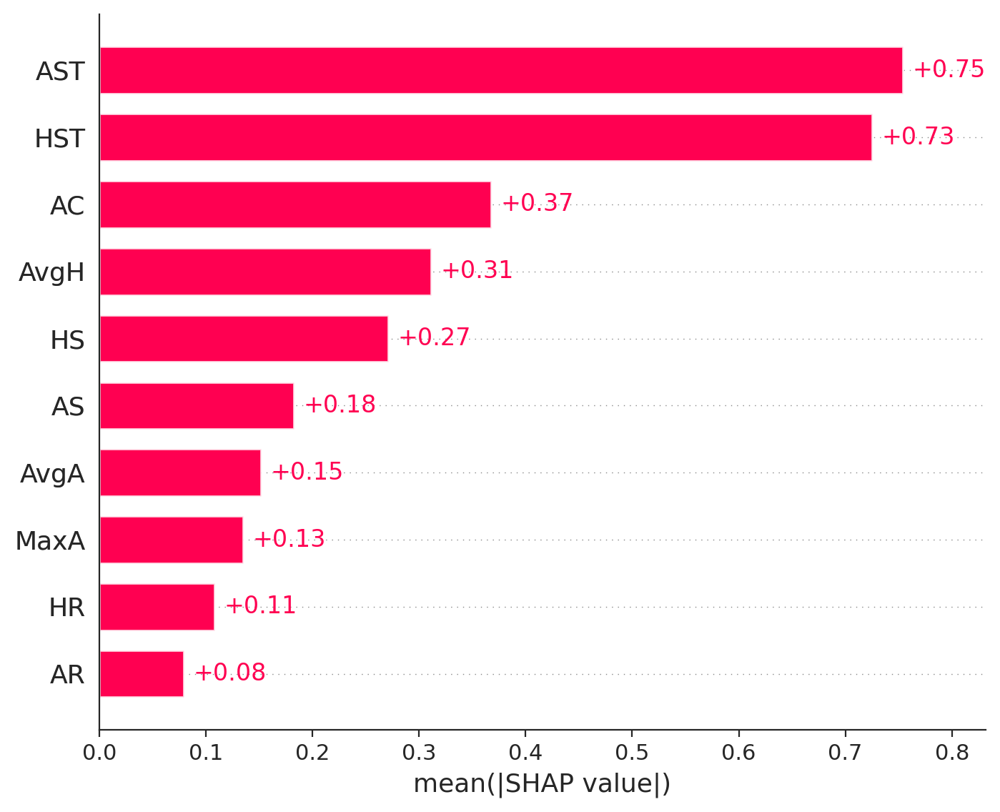

In [ ]:
shap.plots.bar(explanation)

In [ ]:
explanation = shap.Explanation(
    values=shap_values[1],
    base_values=expected_value[1],
    data=X_test_scale,
    feature_names=X_test_scale.columns
)

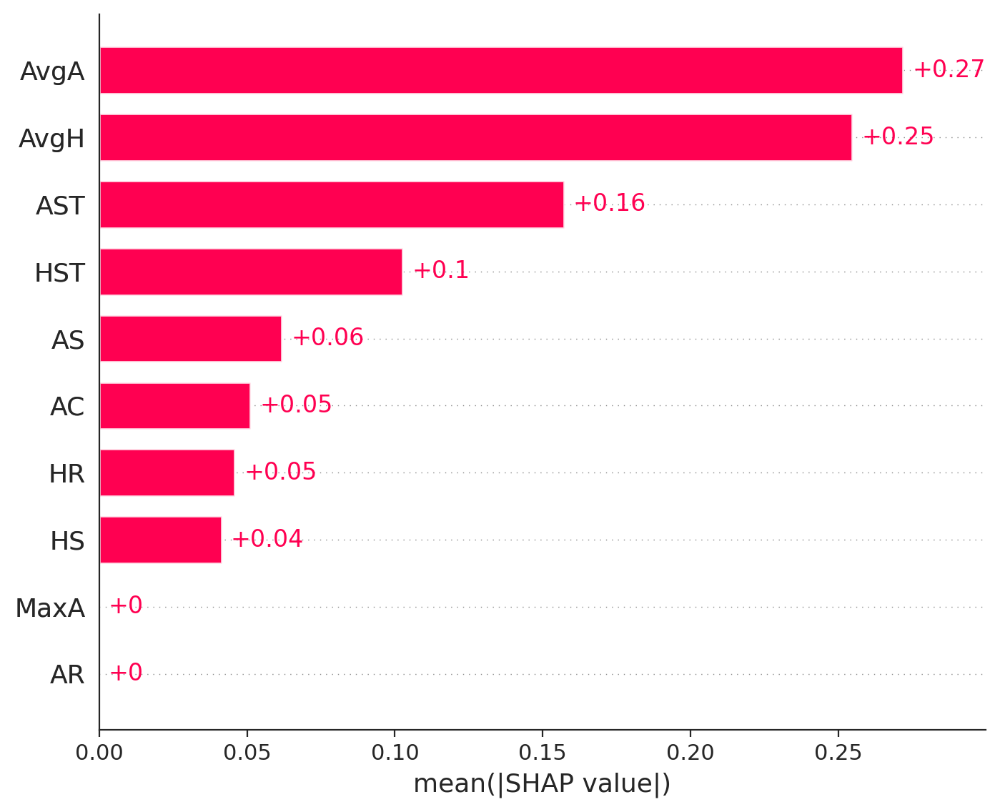

In [ ]:
shap.plots.bar(explanation)

In [ ]:
explanation = shap.Explanation(
    values=shap_values[2],
    base_values=expected_value[2],
    data=X_test_scale,
    feature_names=X_test_scale.columns
)

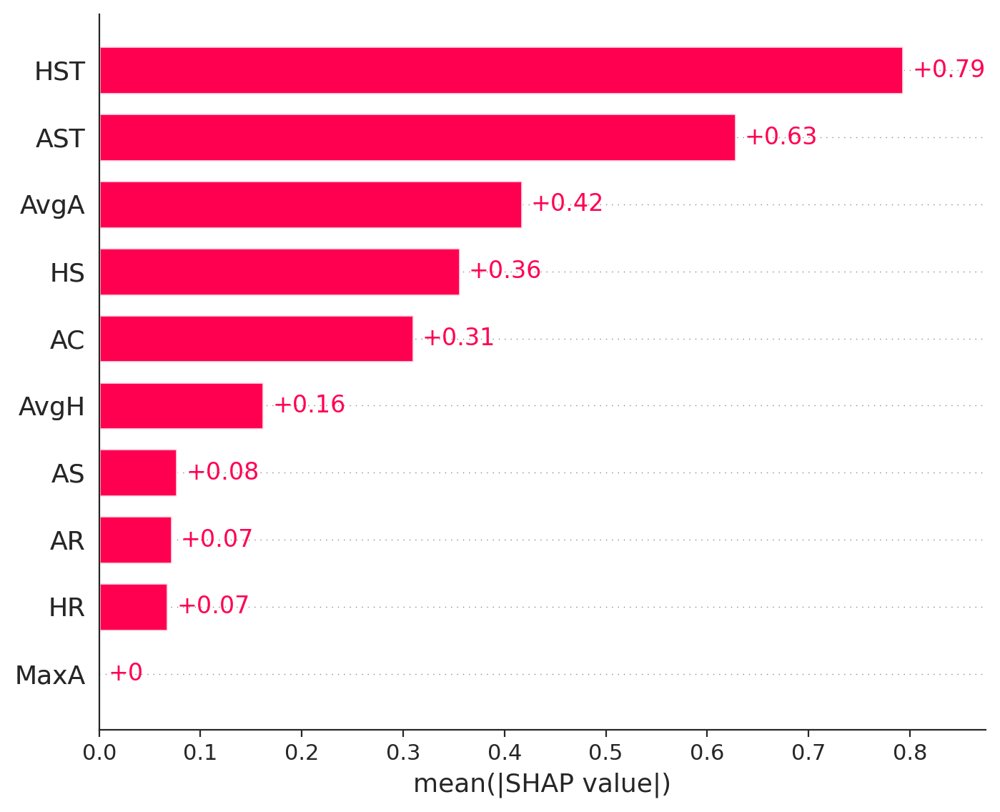

In [ ]:
shap.plots.bar(explanation)

## **Beeswarm**

In [ ]:
explanation = shap.Explanation(
    values=shap_values[0],
    base_values=expected_value[0],
    data=X_test_scale,
    feature_names=X_test_scale.columns
)

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


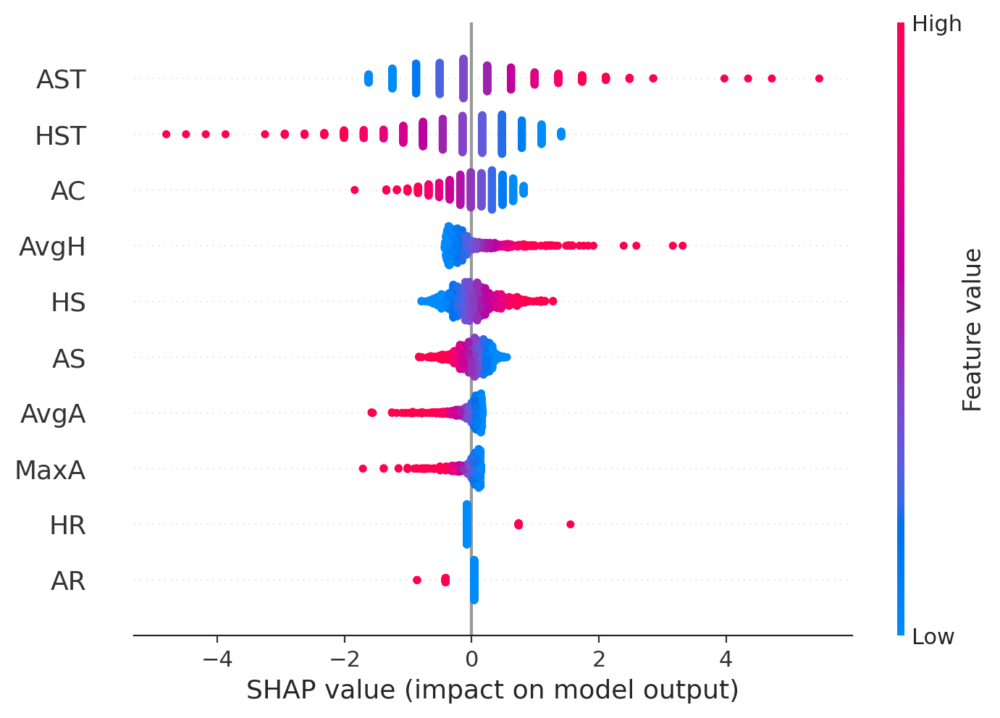

In [ ]:
shap.plots.beeswarm(explanation)

In [ ]:
explanation = shap.Explanation(
    values=shap_values[1],
    base_values=expected_value[1],
    data=X_test_scale,
    feature_names=X_test_scale.columns
)

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


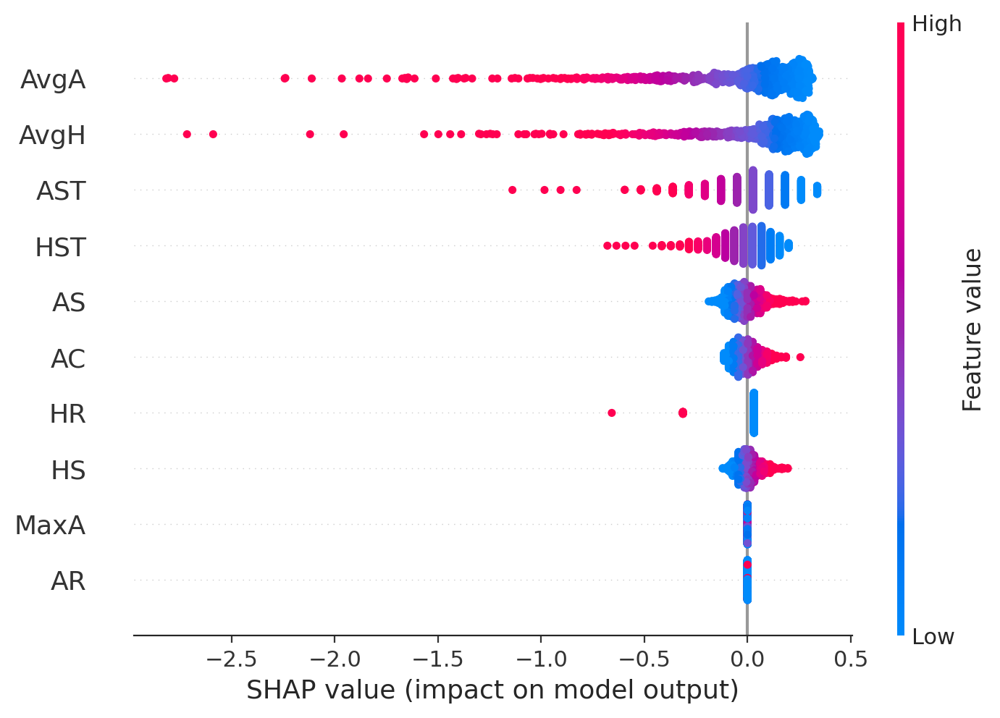

In [ ]:
shap.plots.beeswarm(explanation)

In [ ]:
explanation = shap.Explanation(
    values=shap_values[2],
    base_values=expected_value[2],
    data=X_test_scale,
    feature_names=X_test_scale.columns
)

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


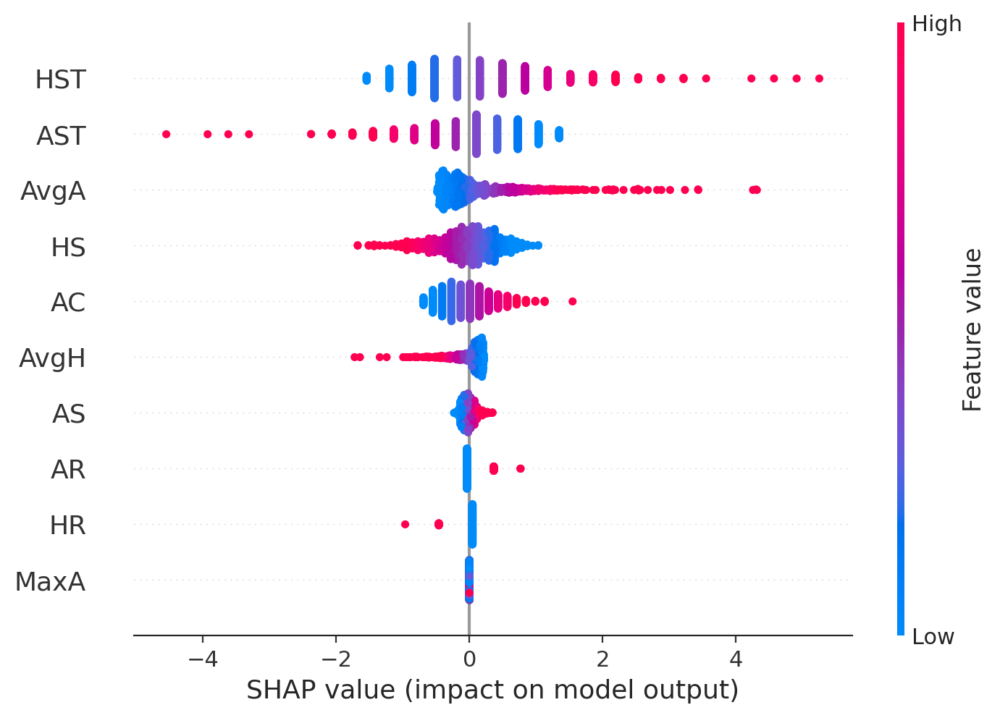

In [ ]:
shap.plots.beeswarm(explanation)

# **RFC**

In [ ]:
from sklearn.ensemble import RandomForestClassifier


In [ ]:
rfc = RandomForestClassifier(max_depth=20, min_samples_leaf=2, n_estimators=50,\
                       n_jobs=-1, random_state=42)

In [ ]:
X_train = X_train[['HS', 'AS', 'HST', 'AST', 'HF', 'AF', 'HC', 'AC', 'HY', 'AY', 'HR',\
       'AR', 'MaxH', 'Max<2.5', 'Overall_diff']]

X_val = X_val[['HS', 'AS', 'HST', 'AST', 'HF', 'AF', 'HC', 'AC', 'HY', 'AY', 'HR',\
       'AR', 'MaxH', 'Max<2.5', 'Overall_diff']]

X_test = X_test[['HS', 'AS', 'HST', 'AST', 'HF', 'AF', 'HC', 'AC', 'HY', 'AY', 'HR',\
       'AR', 'MaxH', 'Max<2.5', 'Overall_diff']]


In [ ]:
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Iterate over the cross-validation folds
for train_idx, val_idx in kfold.split(X_train, y_train):
    # Split the training data into training and validation sets for the fold
    X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]


smote = SMOTE(sampling_strategy='auto', random_state=42)

X_train_fold_resampled, y_train_fold_resampled = smote.fit_resample(X_train_fold, y_train_fold)

rfc.fit(X_train_fold_resampled, y_train_fold_resampled)

RandomForestClassifier(max_depth=20, min_samples_leaf=2, n_estimators=50,
                       n_jobs=-1, random_state=42)

In [ ]:
from sklearn.metrics import classification_report

y_pred_rfc = rfc.predict(X_test)
class_report_rfc = classification_report(y_test, y_pred_rfc)
print("\nClassification Report:")
print(class_report_rfc)


Classification Report:
              precision    recall  f1-score   support

           A       0.59      0.71      0.65       260
           D       0.32      0.23      0.27       190
           H       0.71      0.71      0.71       386

    accuracy                           0.60       836
   macro avg       0.54      0.55      0.54       836
weighted avg       0.58      0.60      0.59       836



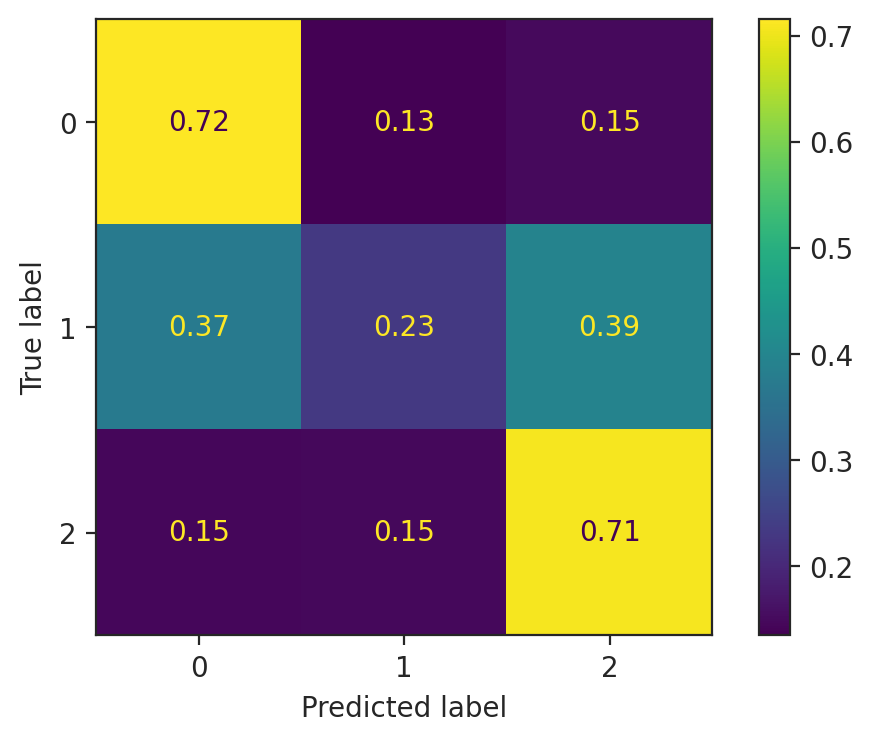

In [ ]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_test,rfc.predict(X_test),normalize='true')
ConfusionMatrixDisplay(confusion_matrix=cm).plot();

# **HGB**

In [ ]:
from sklearn.ensemble import HistGradientBoostingClassifier

In [ ]:
hgc = HistGradientBoostingClassifier(l2_regularization = 0.1,learning_rate = 0.1,\
                                     max_depth = 3, max_leaf_nodes = 200, min_samples_leaf = 20,\
                                     max_iter = 50)

In [ ]:
X_train = X_train[['HS', 'AS', 'HST', 'AST', 'HF', 'HC', 'AC', 'HY', 'AY', 'HR', 'AR',
       'AvgH', 'AvgA', 'MaxH', 'MaxA', 'Year', 'Max>2.5', 'Max<2.5', 'Avg>2.5',
       'TGD', 'Elo_Before_Home', 'Days_D', 'SP_diff', 'Overall_diff',
       'Attack_diff']]

X_val = X_val[['HS', 'AS', 'HST', 'AST', 'HF', 'HC', 'AC', 'HY', 'AY', 'HR', 'AR',
       'AvgH', 'AvgA', 'MaxH', 'MaxA', 'Year', 'Max>2.5', 'Max<2.5', 'Avg>2.5',
       'TGD', 'Elo_Before_Home', 'Days_D', 'SP_diff', 'Overall_diff',
       'Attack_diff']]

X_test = X_test[['HS', 'AS', 'HST', 'AST', 'HF', 'HC', 'AC', 'HY', 'AY', 'HR', 'AR',
       'AvgH', 'AvgA', 'MaxH', 'MaxA', 'Year', 'Max>2.5', 'Max<2.5', 'Avg>2.5',
       'TGD', 'Elo_Before_Home', 'Days_D', 'SP_diff', 'Overall_diff',
       'Attack_diff']]

In [ ]:
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from imblearn.over_sampling import SMOTE
from sklearn.metrics import  make_scorer,f1_score,precision_score,recall_score
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Iterate over the cross-validation folds
for train_idx, val_idx in kfold.split(X_train, y_train):
    # Split the training data into training and validation sets for the fold
    X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]


smote = SMOTE(sampling_strategy='auto', random_state=42)

X_train_fold_resampled, y_train_fold_resampled = smote.fit_resample(X_train_fold, y_train_fold)

hgc.fit(X_train_fold_resampled, y_train_fold_resampled)

HistGradientBoostingClassifier(l2_regularization=0.1, max_depth=3, max_iter=50,
                               max_leaf_nodes=200)

In [ ]:
from sklearn.metrics import classification_report

y_pred_hgb = hgc.predict(X_test)
class_report_hgb = classification_report(y_test, y_pred_hgb)
print("\nClassification Report:")
print(class_report_hgb)


Classification Report:
              precision    recall  f1-score   support

           A       0.61      0.70      0.65       260
           D       0.30      0.24      0.27       190
           H       0.71      0.72      0.71       386

    accuracy                           0.60       836
   macro avg       0.54      0.55      0.54       836
weighted avg       0.59      0.60      0.59       836



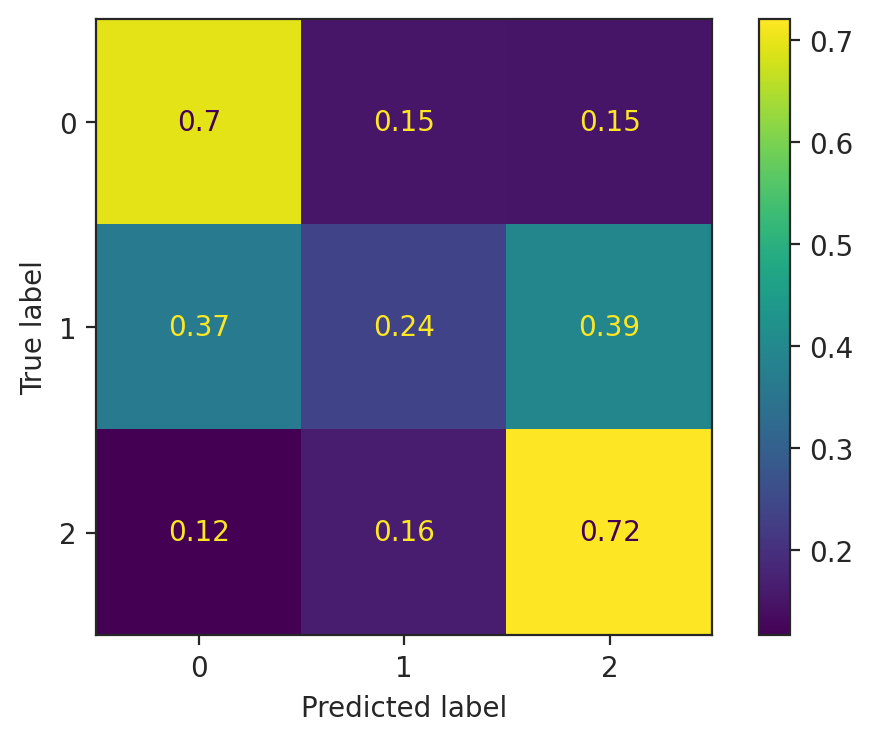

In [ ]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_test,hgc.predict(X_test),normalize='true')
ConfusionMatrixDisplay(confusion_matrix=cm).plot();

## **SHAP**

In [ ]:
!pip install -q shap
import shap
shap.initjs()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.9/547.9 kB 4.6 MB/s eta 0:00:00


Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


In [ ]:
explainer = shap.TreeExplainer(hgc)

In [ ]:
shap_values = explainer.shap_values(X_test)

In [ ]:
row_idx=0

In [ ]:
y_test.iloc[row_idx]

'A'

In [ ]:
# Extract the first instance from your test data (you can replace 0 with the desired row index)
instance = X_test.iloc[0]

# Make a prediction for the instance using the hgc model
prediction = hgc.predict([instance])

# 'prediction' now contains the predicted class label for the instance
print(f"Predicted Class: {prediction[0]}")


Predicted Class: A


X does not have valid feature names, but HistGradientBoostingClassifier was fitted with feature names


In [ ]:
class_mapping = hgc.classes_
class_mapping

array(['A', 'D', 'H'], dtype=object)

In [ ]:
shap.initjs()
# Obtain the expected base value from the explainer
expected_value = explainer.expected_value

# Plot the force plot with the expected base value as the first parameter
# Plot the force plot with the expected base value as the first parameter
shap.force_plot(
    explainer.expected_value[0],  # First parameter is the expected base value
    shap_values[0][row_idx],
    X_test.iloc[row_idx]
)



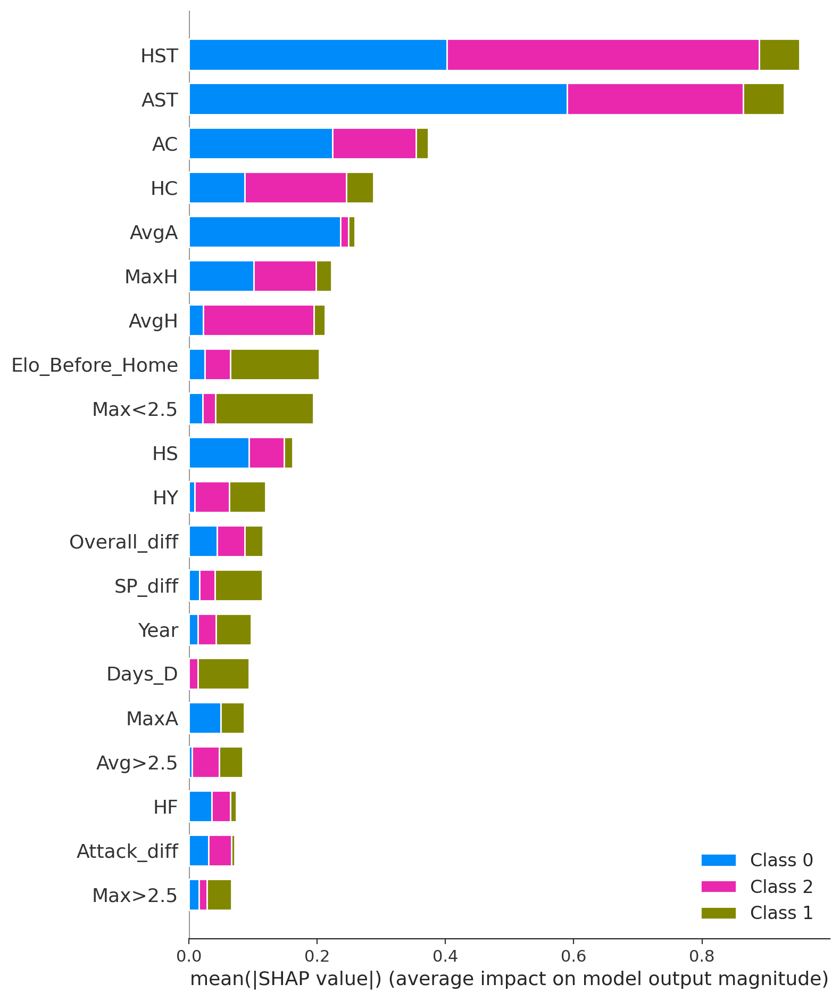

In [ ]:
shap.summary_plot(shap_values, X_test)

In [ ]:
explanation = shap.Explanation(
    values=shap_values[0][row_idx],
    base_values=expected_value[0],
    data=X_test.iloc[row_idx],
    feature_names=X_test.columns
)

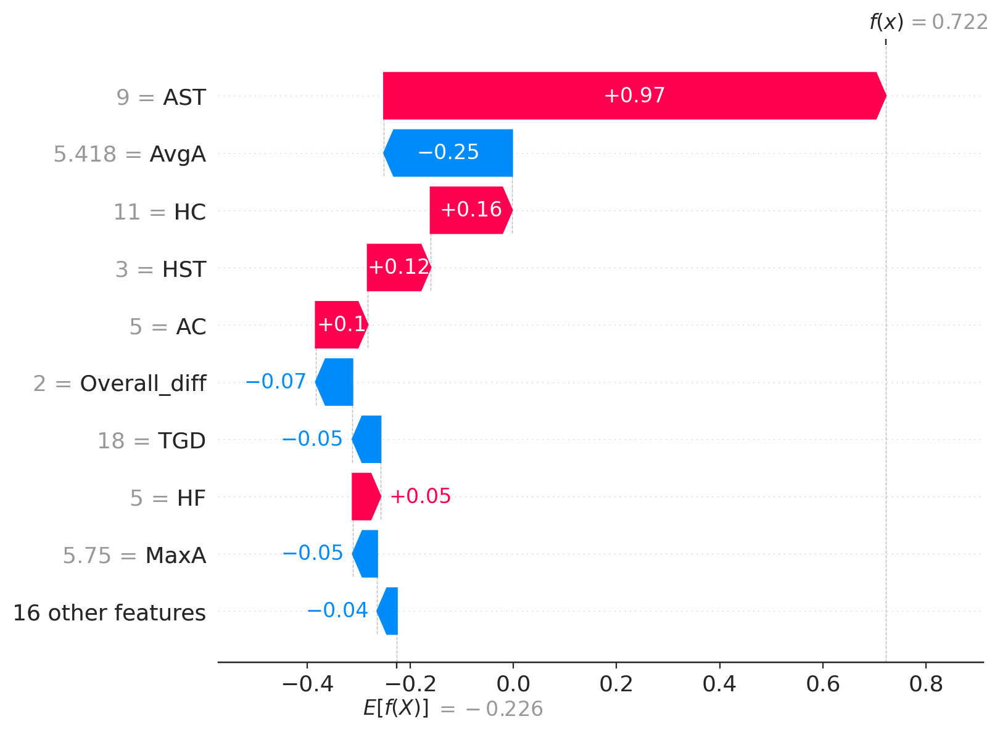

In [ ]:
shap.initjs()
shap.plots.waterfall(explanation)

## **Absolute mean SHAP**

In [ ]:
explanation = shap.Explanation(
    values=shap_values[0],
    base_values=expected_value[0],
    data=X_test,
    feature_names=X_test.columns
)

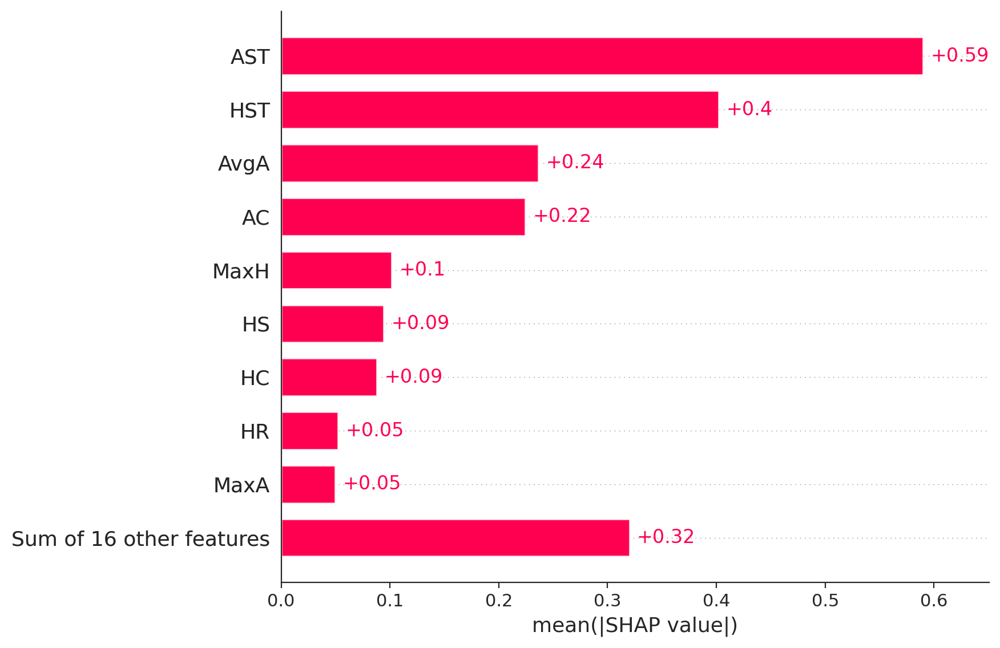

In [ ]:
shap.plots.bar(explanation)

In [ ]:
explanation = shap.Explanation(
    values=shap_values[1],
    base_values=expected_value[1],
    data=X_test,
    feature_names=X_test.columns
)

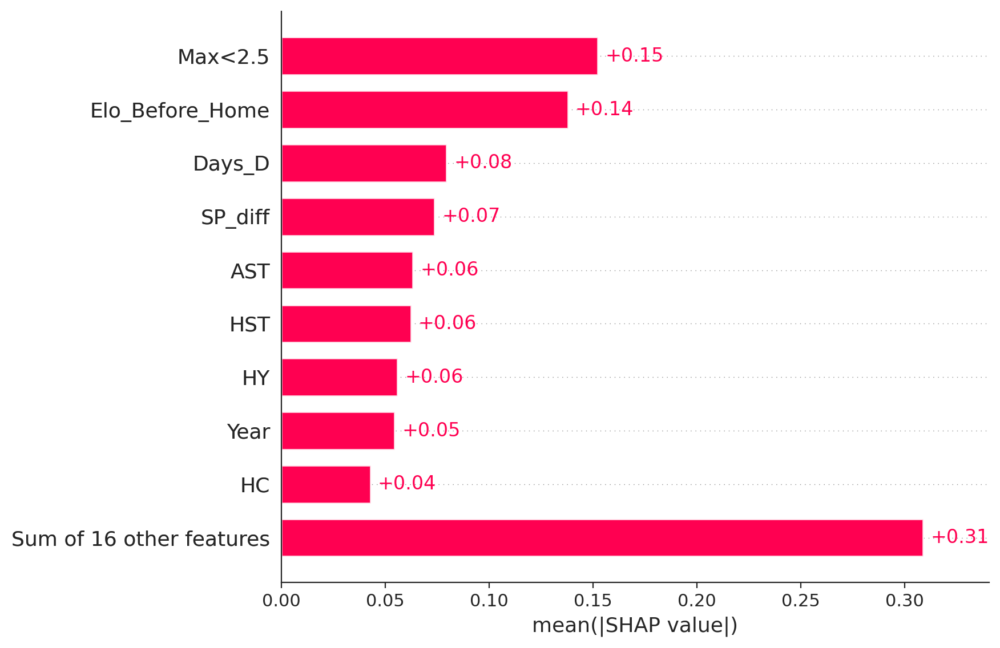

In [ ]:
shap.plots.bar(explanation)

In [ ]:
explanation = shap.Explanation(
    values=shap_values[2],
    base_values=expected_value[2],
    data=X_test,
    feature_names=X_test.columns
)

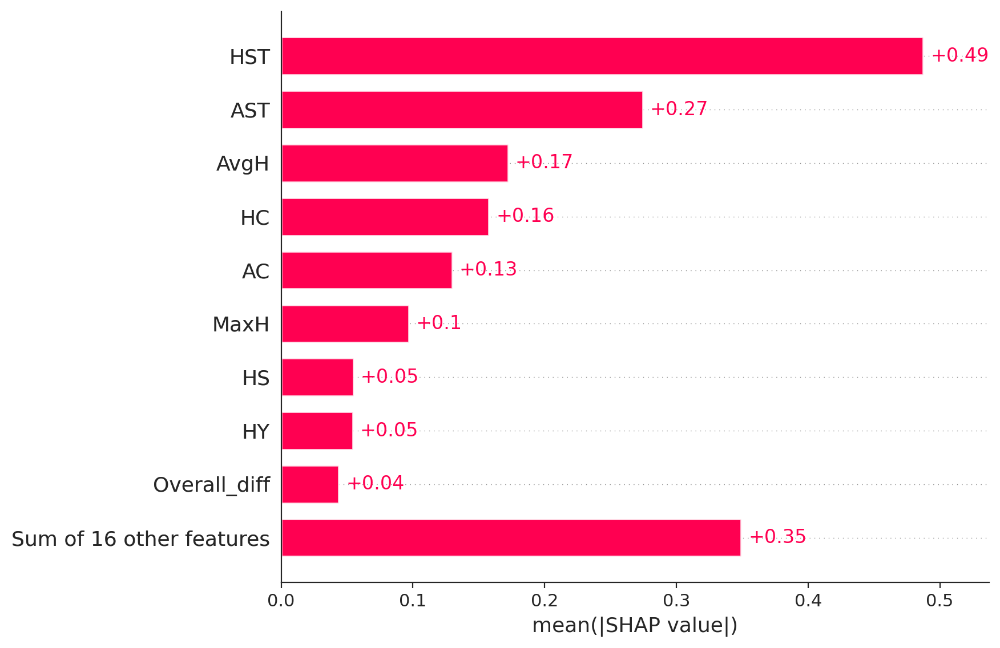

In [ ]:
shap.plots.bar(explanation)

## **Beeswarm**

In [ ]:
explanation = shap.Explanation(
    values=shap_values[0],
    base_values=expected_value[0],
    data=X_test,
    feature_names=X_test.columns
)

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


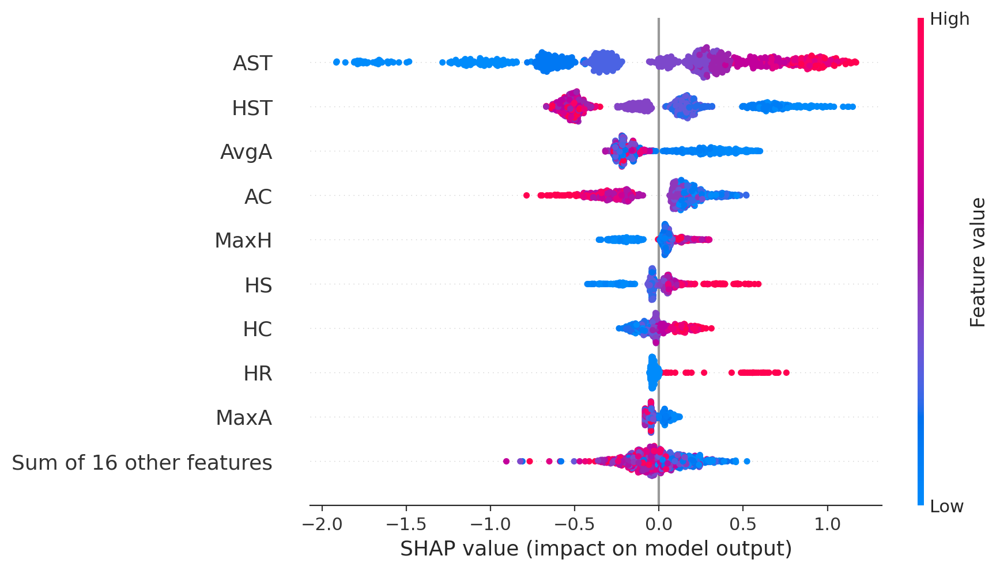

In [ ]:
shap.plots.beeswarm(explanation)

In [ ]:
explanation = shap.Explanation(
    values=shap_values[1],
    base_values=expected_value[1],
    data=X_test,
    feature_names=X_test.columns
)

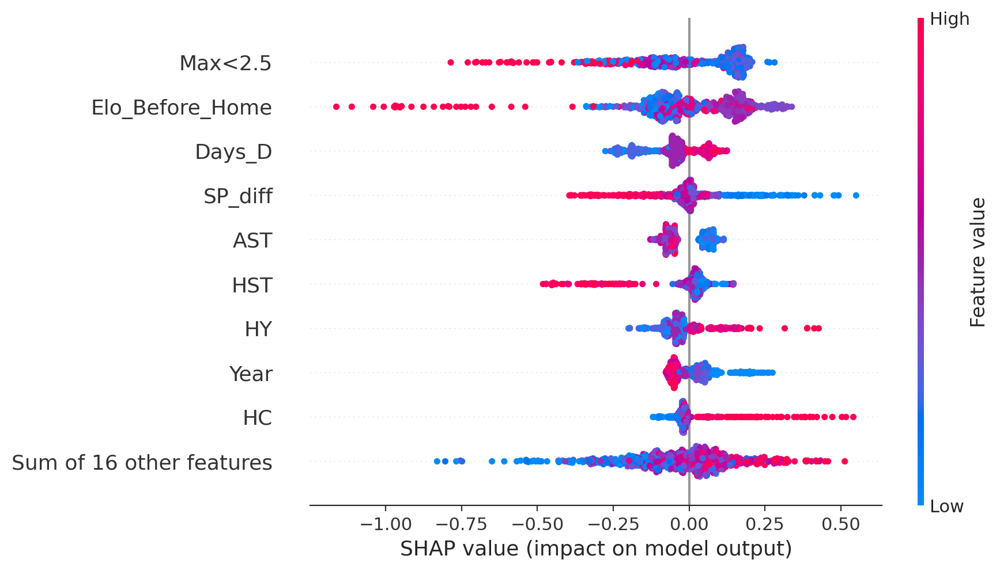

In [ ]:
shap.plots.beeswarm(explanation)

In [ ]:
explanation = shap.Explanation(
    values=shap_values[2],
    base_values=expected_value[2],
    data=X_test,
    feature_names=X_test.columns
)

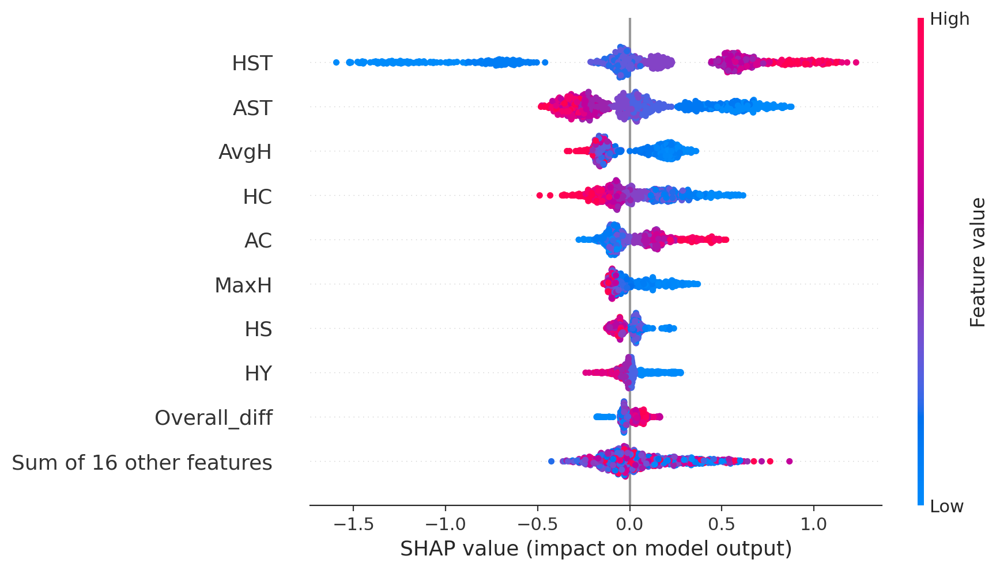

In [ ]:
shap.plots.beeswarm(explanation)

#**KNN**

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
knn = KNeighborsClassifier(n_neighbors=10, weights='uniform')

In [ ]:
X_train_selected = X_train_scale[['HS', 'HST', 'AST', 'AC', 'HR', 'AR', 'MaxH', 'MaxD', 'Overall_diff',\
       'Attack_diff', 'Midfield_diff', 'Defence_diff']]

X_val_selected = X_val_scale[['HS', 'HST', 'AST', 'AC', 'HR', 'AR', 'MaxH', 'MaxD', 'Overall_diff',\
       'Attack_diff', 'Midfield_diff', 'Defence_diff']]

X_test_selected = X_test_scale[['HS', 'HST', 'AST', 'AC', 'HR', 'AR', 'MaxH', 'MaxD', 'Overall_diff',\
       'Attack_diff', 'Midfield_diff', 'Defence_diff']]

In [ ]:
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Iterate over the cross-validation folds
for train_idx, val_idx in kfold.split(X_train_selected, y_train):
    # Split the training data into training and validation sets for the fold
    X_train_fold, X_val_fold = X_train_selected.iloc[train_idx], X_train_selected.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]


smote = SMOTE(sampling_strategy='auto', random_state=42)

X_train_fold_resampled, y_train_fold_resampled = smote.fit_resample(X_train_fold, y_train_fold)

knn.fit(X_train_fold_resampled, y_train_fold_resampled)

KNeighborsClassifier(n_neighbors=10)

In [ ]:
from sklearn.metrics import classification_report

y_pred_knn = knn.predict(X_test_selected)
class_report_knn = classification_report(y_test, y_pred_knn)
print("\nClassification Report:")
print(class_report_knn)


Classification Report:
              precision    recall  f1-score   support

           A       0.59      0.62      0.60       260
           D       0.24      0.33      0.28       190
           H       0.71      0.54      0.61       386

    accuracy                           0.52       836
   macro avg       0.51      0.50      0.50       836
weighted avg       0.56      0.52      0.53       836



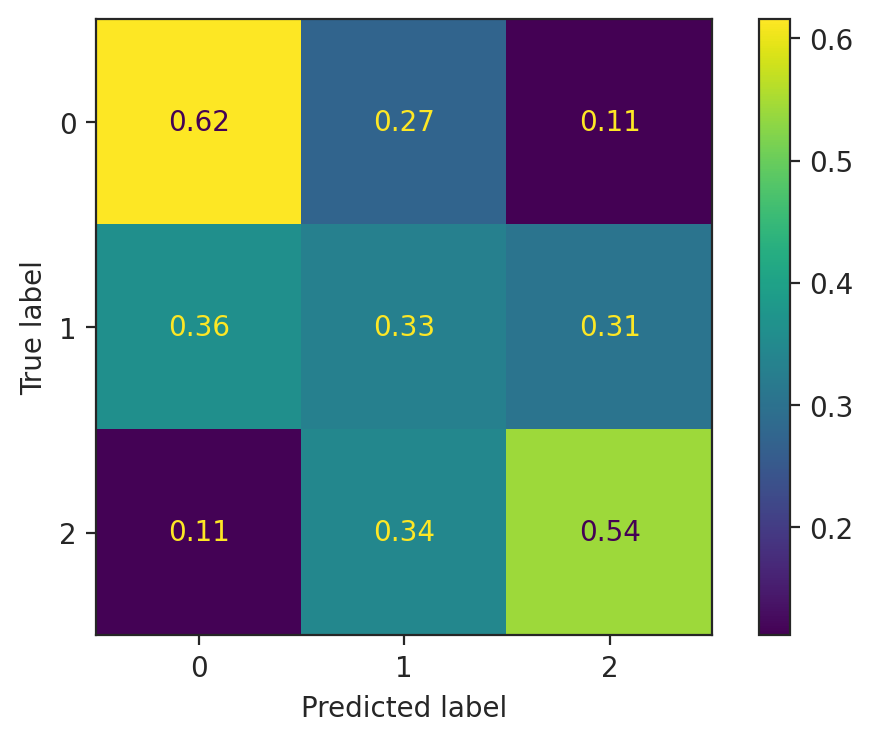

In [ ]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_test,knn.predict(X_test_selected ),normalize='true')
ConfusionMatrixDisplay(confusion_matrix=cm).plot();

# **SVM**

In [ ]:
from sklearn.svm import SVC
svc =SVC(C =0.1, class_weight = None, degree = 2, gamma = 'scale', kernel = 'linear')

In [ ]:
X_train_selected = X_train_scale[['HS', 'AS', 'HST', 'AST', 'AC', 'HR', 'AR', 'AvgA', 'MaxH', 'MaxA',
       'MW', 'Overall_diff', 'Midfield_diff']]

X_val_selected = X_val_scale[['HS', 'AS', 'HST', 'AST', 'AC', 'HR', 'AR', 'AvgA', 'MaxH', 'MaxA',
       'MW', 'Overall_diff', 'Midfield_diff']]

X_test_selected = X_test_scale[['HS', 'AS', 'HST', 'AST', 'AC', 'HR', 'AR', 'AvgA', 'MaxH', 'MaxA',
       'MW', 'Overall_diff', 'Midfield_diff']]

In [ ]:
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Initialize lists to store cross-validation results
cv_scores = []

# Iterate over the cross-validation folds
for train_idx, val_idx in kfold.split(X_train_selected, y_train):
    # Split the training data into training and validation sets for the fold
    X_train_fold, X_val_fold = X_train_selected.iloc[train_idx], X_train_selected.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]


smote = SMOTE(sampling_strategy='auto', random_state=42)

X_train_fold_resampled, y_train_fold_resampled = smote.fit_resample(X_train_fold, y_train_fold)

svc.fit(X_train_fold_resampled, y_train_fold_resampled)

SVC(C=0.1, degree=2, kernel='linear')

In [ ]:
from sklearn.metrics import classification_report

y_pred_svc = svc.predict(X_test_selected)
class_report_svc = classification_report(y_test, y_pred_svc)
print("\nClassification Report:")
print(class_report_svc)


Classification Report:
              precision    recall  f1-score   support

           A       0.64      0.61      0.63       260
           D       0.31      0.46      0.37       190
           H       0.75      0.61      0.67       386

    accuracy                           0.57       836
   macro avg       0.57      0.56      0.56       836
weighted avg       0.62      0.57      0.59       836



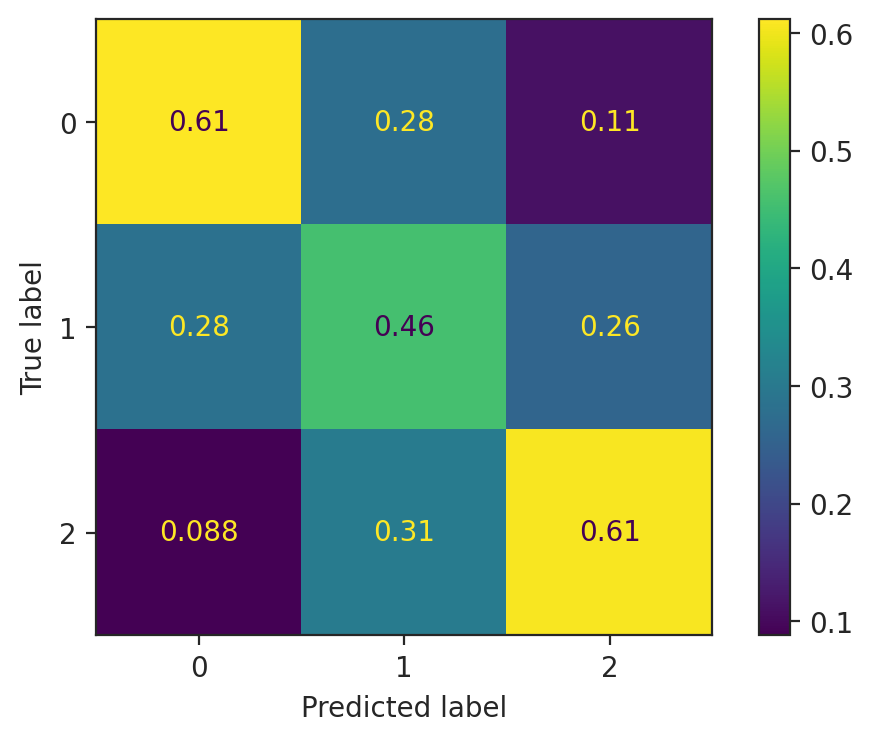

In [ ]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_test,svc.predict(X_test_selected),normalize='true')
ConfusionMatrixDisplay(confusion_matrix=cm).plot();

## **SHAP**

In [ ]:
row_idx=0

In [ ]:
y_test.iloc[row_idx]

'A'

In [ ]:
# Extract the first instance from your test data (you can replace 0 with the desired row index)
instance = X_test_selected.iloc[0]

# Make a prediction for the instance using the hgc model
prediction = svc.predict([instance])

# 'prediction' now contains the predicted class label for the instance
print(f"Predicted Class: {prediction[0]}")

Predicted Class: A


X does not have valid feature names, but SVC was fitted with feature names


In [ ]:
# explainer = shap.Explainer(logistic_model, X_train)

In [ ]:
explainer = shap.Explainer(svc,X_train_fold_resampled)

In [ ]:
shap_values = explainer.shap_values( X_test_selected)

In [ ]:
shap.initjs()
# Obtain the expected base value from the explainer
expected_value = explainer.expected_value

# Plot the force plot with the expected base value as the first parameter
# Plot the force plot with the expected base value as the first parameter
shap.force_plot(
    explainer.expected_value[0],  # First parameter is the expected base value
    shap_values[0][row_idx],
     X_test_selected.iloc[row_idx]
)

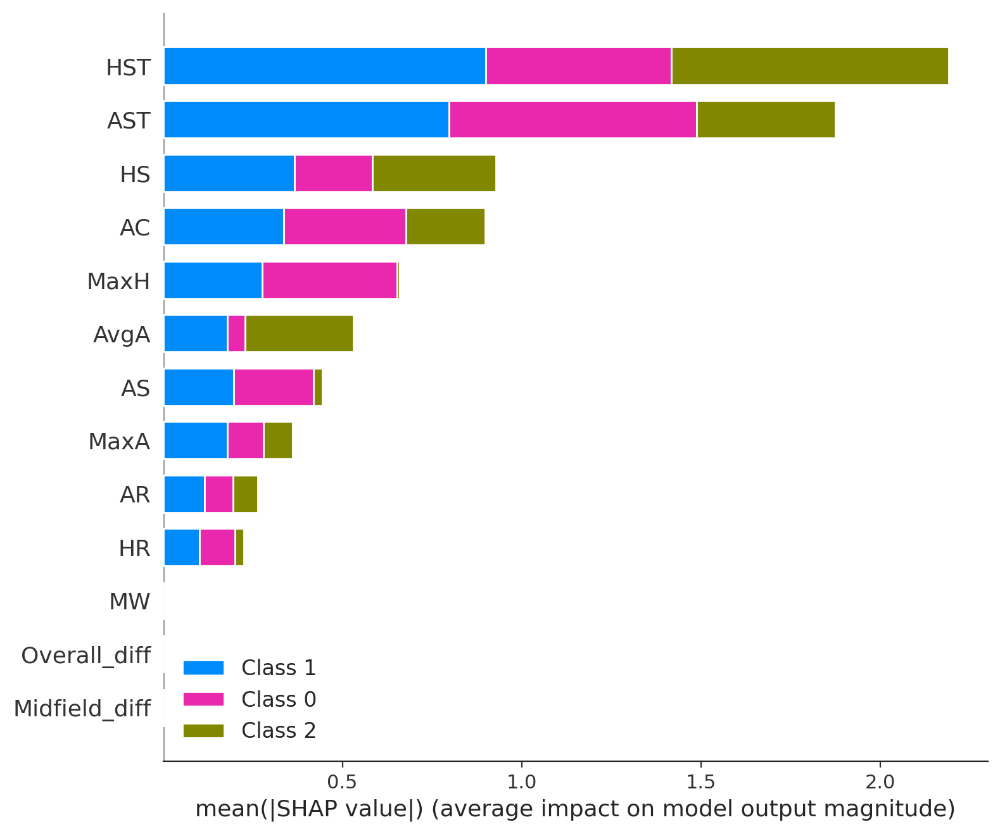

In [ ]:
shap.summary_plot(shap_values,  X_test_selected)

In [ ]:
explanation = shap.Explanation(
    values=shap_values[0][row_idx],
    base_values=expected_value[0],
    data=X_test_selected.iloc[row_idx],
    feature_names=X_test_selected.columns
)

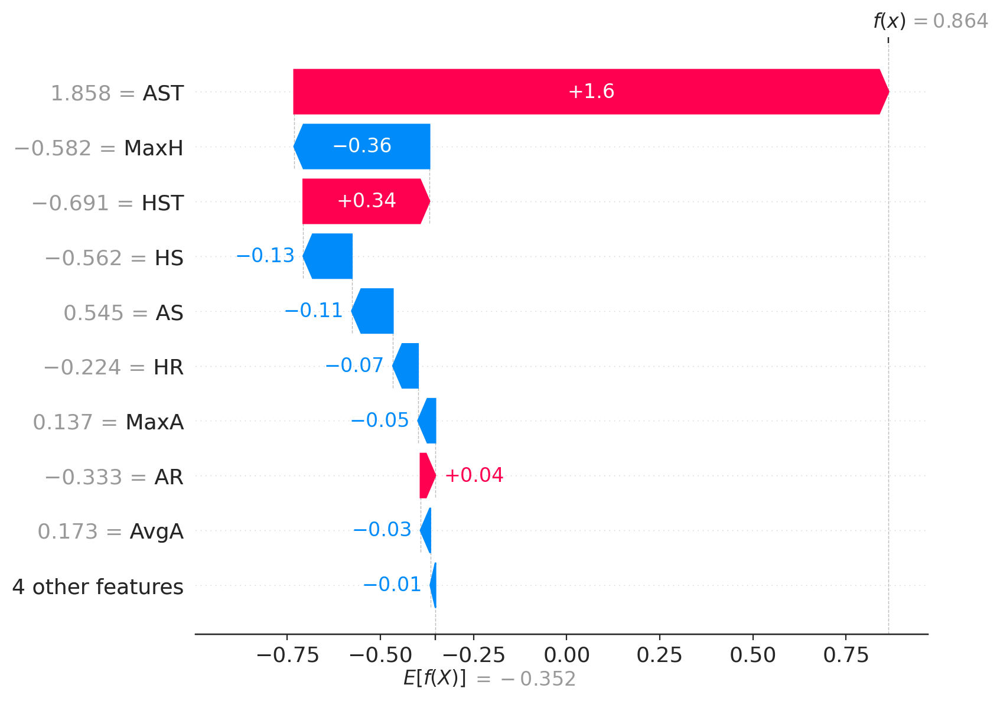

In [ ]:
shap.initjs()
shap.plots.waterfall(explanation)

## **Absolute mean SHAP**

In [ ]:
explanation = shap.Explanation(
    values=shap_values[0],
    base_values=expected_value[0],
    data=X_test_selected,
    feature_names=X_test_selected.columns
)

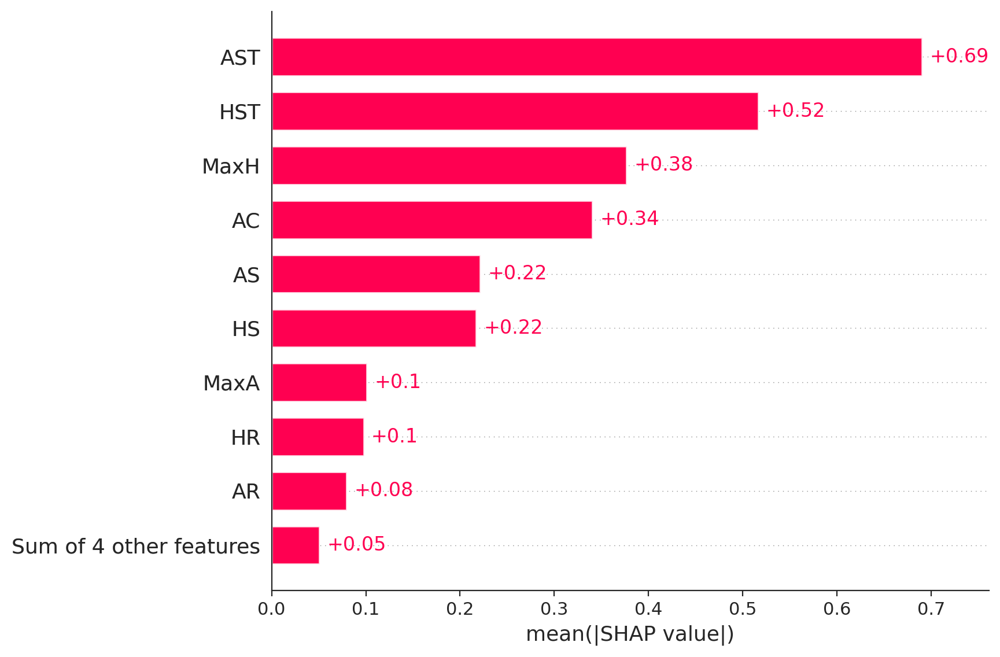

In [ ]:
shap.plots.bar(explanation)

In [ ]:
explanation = shap.Explanation(
    values=shap_values[1],
    base_values=expected_value[1],
    data=X_test_selected,
    feature_names=X_test_selected.columns
)

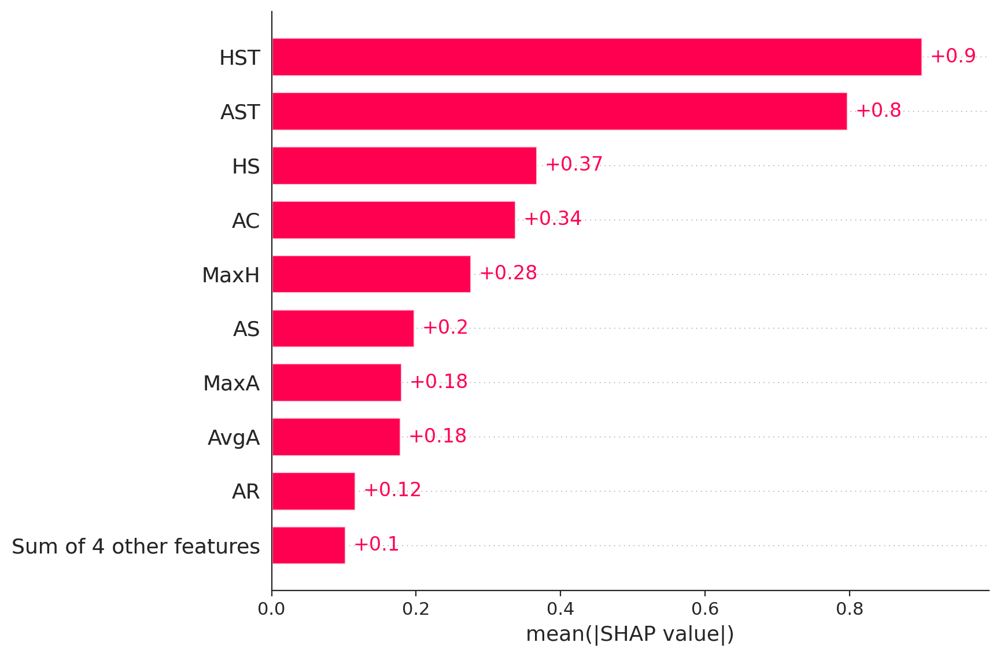

In [ ]:
shap.plots.bar(explanation)

In [ ]:
explanation = shap.Explanation(
    values=shap_values[2],
    base_values=expected_value[2],
    data=X_test_selected,
    feature_names=X_test_selected.columns
)

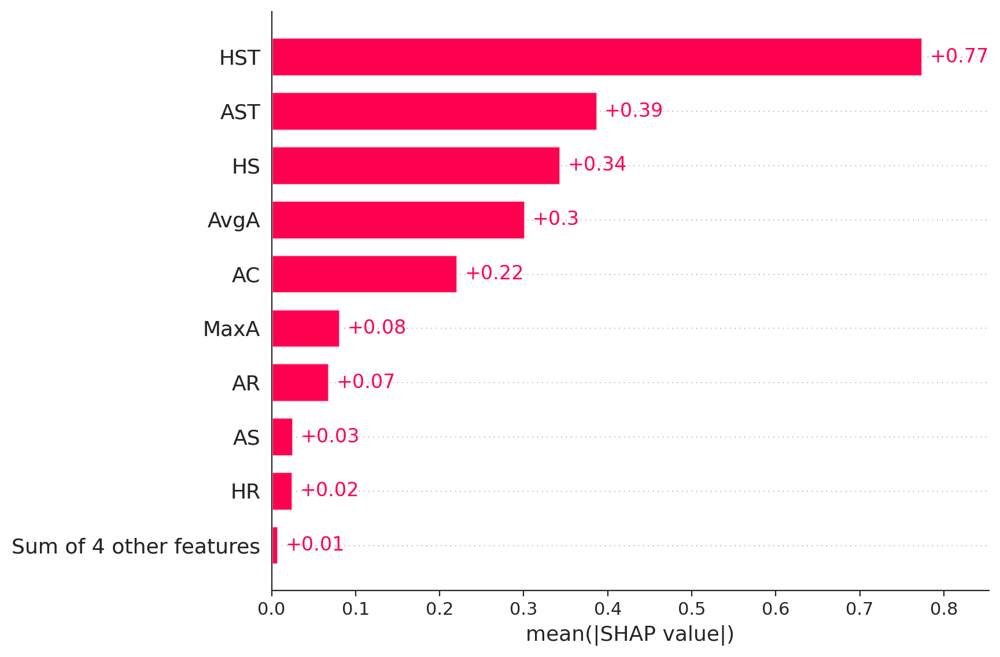

In [ ]:
shap.plots.bar(explanation)

## **Beeswarm**

In [ ]:
explanation = shap.Explanation(
    values=shap_values[0],
    base_values=expected_value[0],
    data=X_test_selected,
    feature_names=X_test_selected.columns
)

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


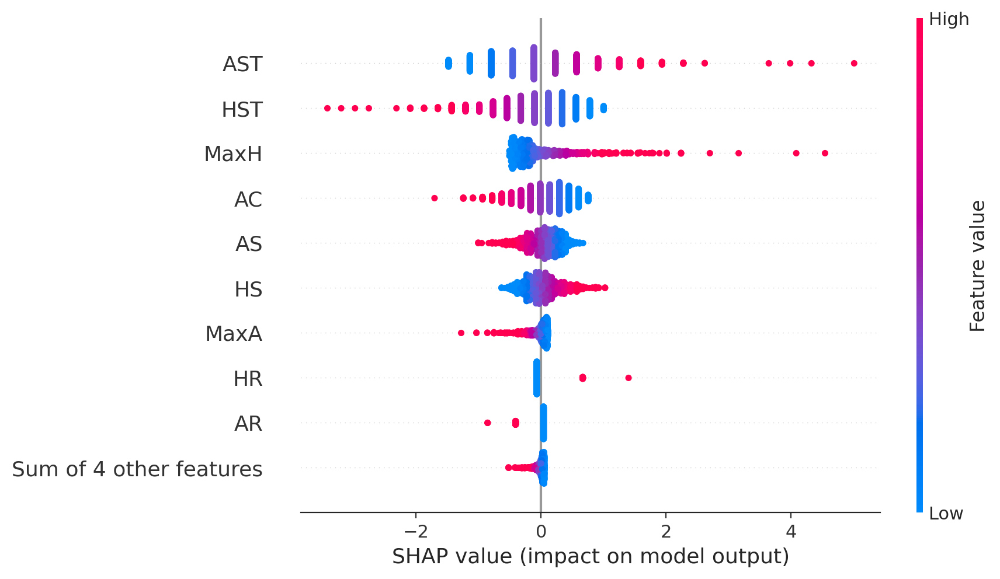

In [ ]:
shap.plots.beeswarm(explanation)

In [ ]:
explanation = shap.Explanation(
    values=shap_values[1],
    base_values=expected_value[1],
    data=X_test_selected,
    feature_names=X_test_selected.columns
)

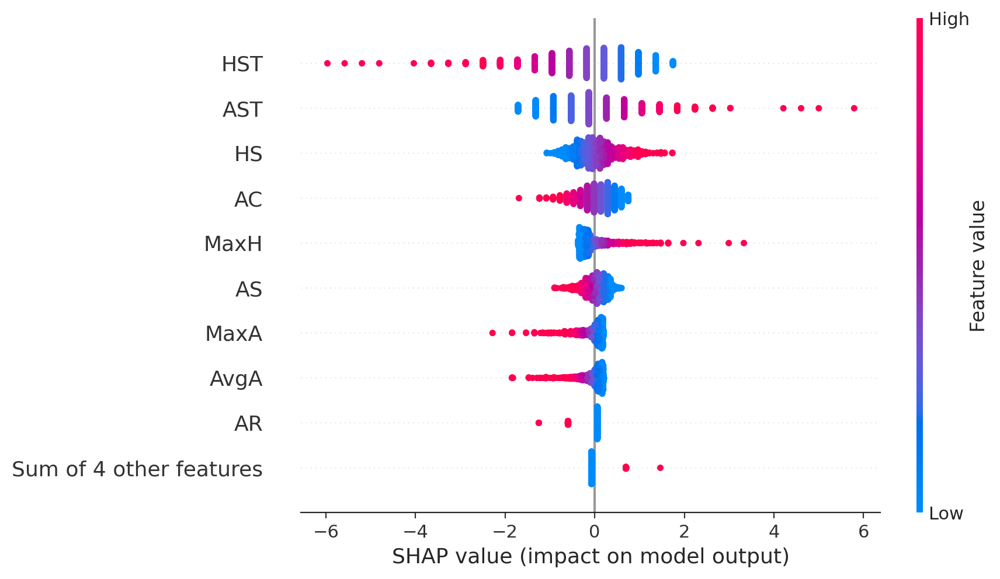

In [ ]:
shap.plots.beeswarm(explanation)

In [ ]:
explanation = shap.Explanation(
    values=shap_values[2],
    base_values=expected_value[2],
    data=X_test_selected,
    feature_names=X_test_selected.columns
)

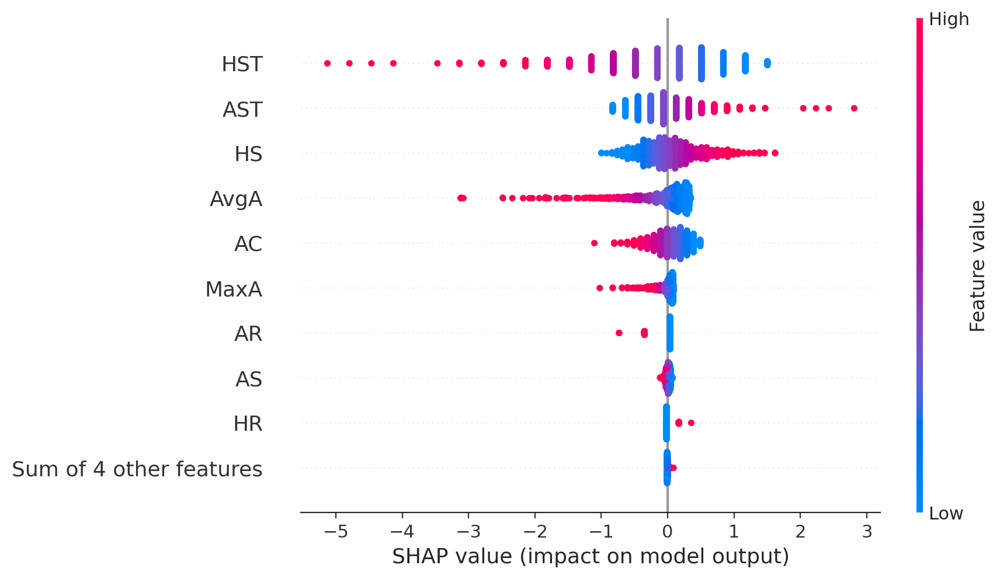

In [ ]:
shap.plots.beeswarm(explanation)

# **GNB**

In [ ]:
from sklearn.naive_bayes import GaussianNB
nb = GaussianNB(priors = None, var_smoothing = 1e-09)

In [ ]:
X_train_selected = X_train[['HST', 'AST', 'Defence_diff']]
X_val_selected = X_val[['HST', 'AST', 'Defence_diff']]
X_test_selected = X_test[['HST', 'AST', 'Defence_diff']]

In [ ]:
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Initialize lists to store cross-validation results
cv_scores = []

# Iterate over the cross-validation folds
for train_idx, val_idx in kfold.split(X_train_selected, y_train):
    # Split the training data into training and validation sets for the fold
    X_train_fold, X_val_fold = X_train_selected.iloc[train_idx], X_train_selected.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]


smote = SMOTE(sampling_strategy='auto', random_state=42)

X_train_fold_resampled, y_train_fold_resampled = smote.fit_resample(X_train_fold, y_train_fold)

nb.fit(X_train_fold_resampled, y_train_fold_resampled)

GaussianNB()

In [ ]:
from sklearn.metrics import classification_report

y_pred_nb = nb.predict(X_test_selected)
class_report_nb = classification_report(y_test, y_pred_nb)
print("\nClassification Report:")
print(class_report_nb)


Classification Report:
              precision    recall  f1-score   support

           A       0.59      0.62      0.61       260
           D       0.30      0.39      0.34       190
           H       0.73      0.60      0.66       386

    accuracy                           0.56       836
   macro avg       0.54      0.54      0.54       836
weighted avg       0.59      0.56      0.57       836



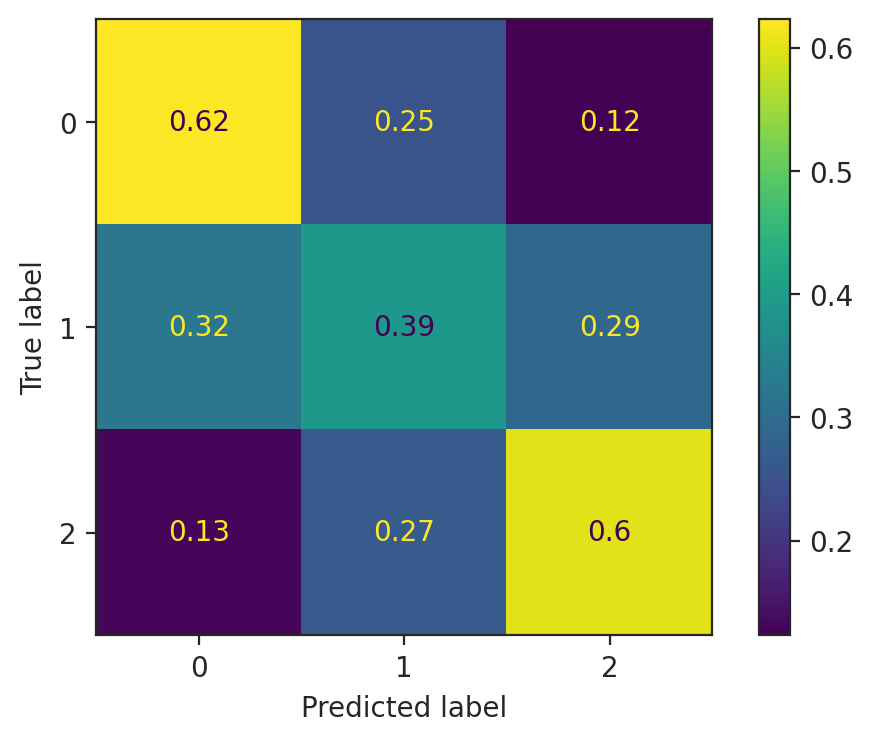

In [ ]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_test,nb.predict(X_test_selected),normalize='true')
ConfusionMatrixDisplay(confusion_matrix=cm).plot();

# **MLP**

In [ ]:
from sklearn.neural_network import MLPClassifier
mlp = MLPClassifier(alpha=0.001, early_stopping=True, hidden_layer_sizes=(150,),\
              learning_rate='invscaling', max_iter=3000)

In [ ]:
len(X_train_scale.columns)

35

In [ ]:
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Initialize lists to store cross-validation results
cv_scores = []

# Iterate over the cross-validation folds
for train_idx, val_idx in kfold.split(X_train_scale, y_train):
    # Split the training data into training and validation sets for the fold
    X_train_fold, X_val_fold = X_train_scale.iloc[train_idx], X_train_scale.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]


smote = SMOTE(sampling_strategy='auto', random_state=42)

X_train_fold_resampled, y_train_fold_resampled = smote.fit_resample(X_train_fold, y_train_fold)

mlp.fit(X_train_fold_resampled, y_train_fold_resampled)

MLPClassifier(alpha=0.001, early_stopping=True, hidden_layer_sizes=(150,),
              learning_rate='invscaling', max_iter=3000)

In [ ]:
from sklearn.metrics import classification_report

y_pred_mlp = mlp.predict(X_test_scale)
class_report_mlp = classification_report(y_test, y_pred_mlp)
print("\nClassification Report:")
print(class_report_mlp)


Classification Report:
              precision    recall  f1-score   support

           A       0.64      0.63      0.63       260
           D       0.32      0.40      0.35       190
           H       0.75      0.66      0.70       386

    accuracy                           0.59       836
   macro avg       0.57      0.56      0.56       836
weighted avg       0.62      0.59      0.60       836



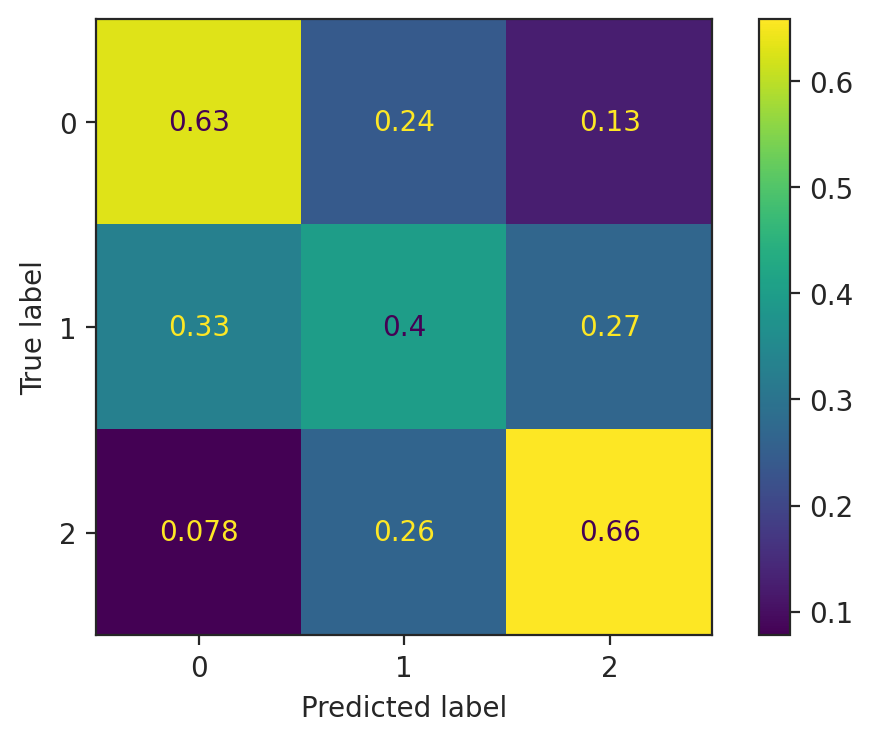

In [ ]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_test,mlp.predict(X_test_scale),normalize='true')
ConfusionMatrixDisplay(confusion_matrix=cm).plot();

In [ ]:
! pip install eli5

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 kB 2.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107719 sha256=b351163b3ef3bf37af117f9ef9ae0c3f1de64649dc1a6575903d37c9ac9c0f4c
  Stored in directory: /root/.cache/pip/wheels/b8/58/ef/2cf4c306898c2338d51540e0922c8e0d6028e07007085c0004
Successfully built eli5


In [ ]:
from eli5.sklearn import PermutationImportance
import eli5

In [ ]:
perm=PermutationImportance(mlp).fit(X_train_fold_resampled, y_train_fold_resampled)

In [ ]:
eli5.show_weights(perm,feature_names=X_train_fold_resampled.columns.tolist())

Weight,Feature
0.1074 ± 0.0138,HST
0.0951 ± 0.0079,AST
0.0399 ± 0.0124,AC
0.0322 ± 0.0011,HC
0.0231 ± 0.0055,SP_diff
0.0220 ± 0.0040,HS
0.0194 ± 0.0085,HY
0.0175 ± 0.0039,Max>2.5
0.0158 ± 0.0068,AvgH
0.0156 ± 0.0066,AF


In [ ]:
def predict_func(X):
    return mlp.predict_proba(X)


In [ ]:
explainer = shap.Explainer(predict_func, X_train_fold_resampled)

In [ ]:
shap_values = explainer.shap_values(X_test_scale)

Permutation explainer: 837it [01:44,  7.43it/s]                         


X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names


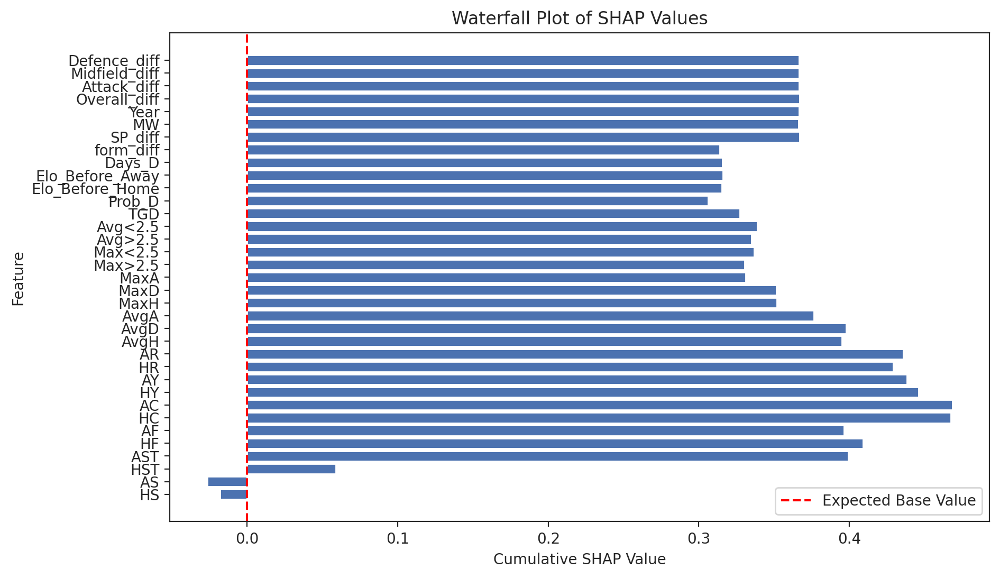

In [ ]:
import shap
import matplotlib.pyplot as plt
import numpy as np

# Initialize SHAP and explain the model predictions
shap.initjs()
explainer = shap.KernelExplainer(predict_func, X_train_fold_resampled)
shap_values = explainer.shap_values(X_test_scale.iloc[0])

# Calculate cumulative SHAP values
cumulative_shap_values = np.cumsum(shap_values[0])

# Create a bar chart (waterfall plot)
feature_names = X_test_scale.columns
plt.figure(figsize=(10, 6))
plt.barh(feature_names, cumulative_shap_values)
plt.xlabel("Cumulative SHAP Value")
plt.ylabel("Feature")
plt.title("Waterfall Plot of SHAP Values")
plt.axvline(0, color='red', linestyle='--', label='Expected Base Value')
plt.legend()
plt.show()


In [ ]:
import shap
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Create a DataFrame with feature names
feature_names = X_test_scale.columns
X_test_df = pd.DataFrame(X_test_scale, columns=feature_names);

# Initialize SHAP and explain the model predictions
shap.initjs()

# Step 1: Summarize the background data using shap.sample or shap.kmeans
background_data = shap.sample(X_train_fold_resampled, 10)  ;# Adjust the number of samples (K) as needed

explainer = shap.KernelExplainer(predict_func, background_data);

# Step 2: Pass the summarized background data to the Explanation object
shap_values = explainer.shap_values(X_test_scale);

# Choose a specific instance to explain (you can change row_idx as needed)
row_idx = 0

# Calculate expected base value for this instance
expected_value = np.mean(shap_values[0], axis=0);

# Create an Explanation object with feature names
explanation = shap.Explanation(
    values=shap_values[0][row_idx],
    base_values=expected_value,
    data=X_test_df.iloc[row_idx],
    feature_names=feature_names
);




X does not have valid feature names, but MLPClassifier was fitted with feature names


  0%|          | 0/836 [00:00<?, ?it/s]

X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted

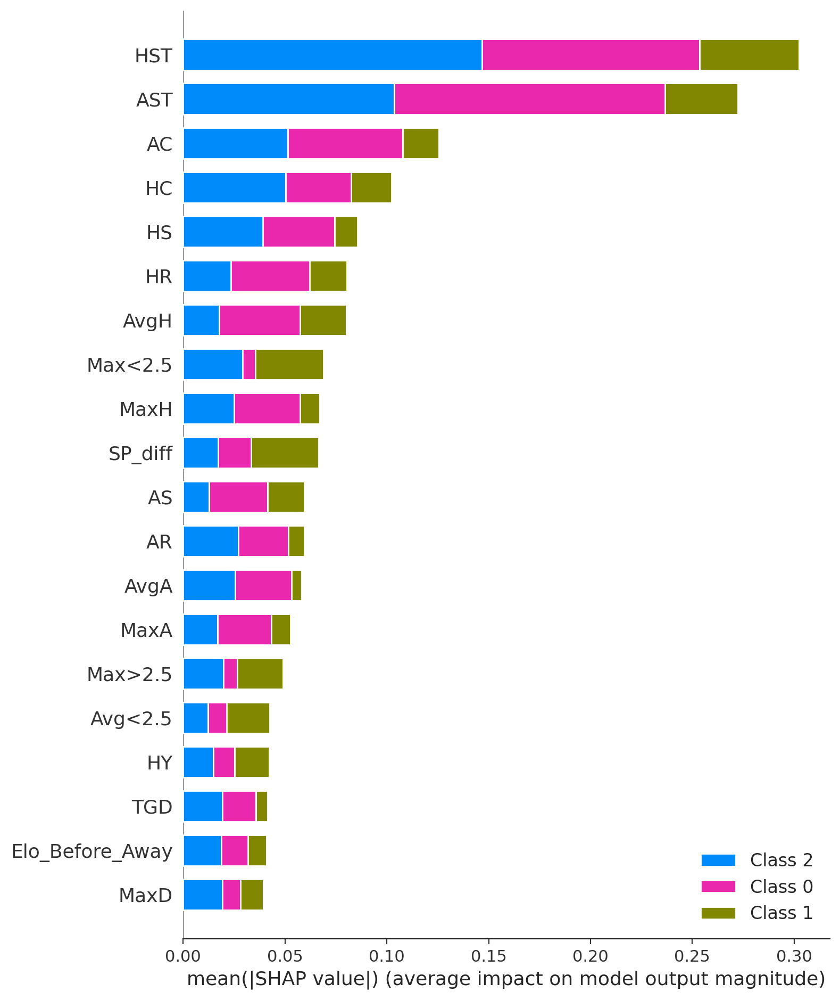

In [ ]:
# Summary Plot
shap.summary_plot(shap_values, X_test_df)
plt.show()

In [ ]:
len(X_test_df)

836

In [ ]:
len(shap_values)

3

In [ ]:
# Calculate expected base value for this instance
expected_value = np.mean(shap_values[0], axis=0);

# Create an Explanation object with feature names
explanation = shap.Explanation(
    values=shap_values[0][row_idx],
    base_values=expected_value,
    data=X_test_df.iloc[row_idx],
    feature_names=feature_names
);

In [ ]:
expected_value

array([ 1.77794386e-03,  1.20406461e-02,  1.63347557e-02, -2.77067283e-02,
        1.26381514e-03, -1.73065441e-03,  1.46340372e-03,  1.92186591e-02,
       -3.09787908e-03,  1.42712323e-03, -2.27170079e-02,  1.04096219e-02,
       -8.11541882e-03,  7.51215920e-03, -1.37068491e-02, -3.96797270e-03,
       -3.24683627e-04, -1.33743211e-02, -3.16676923e-03,  1.65143860e-03,
       -3.58858580e-03,  3.37540072e-03, -6.54988868e-03, -6.47449433e-04,
        3.52932566e-03, -1.32511718e-03,  7.32508920e-04, -3.59390764e-04,
        6.27627594e-04, -3.42771258e-05, -8.74265429e-05, -8.46398453e-05,
       -2.67948710e-05, -3.57290884e-05, -2.45382281e-05])

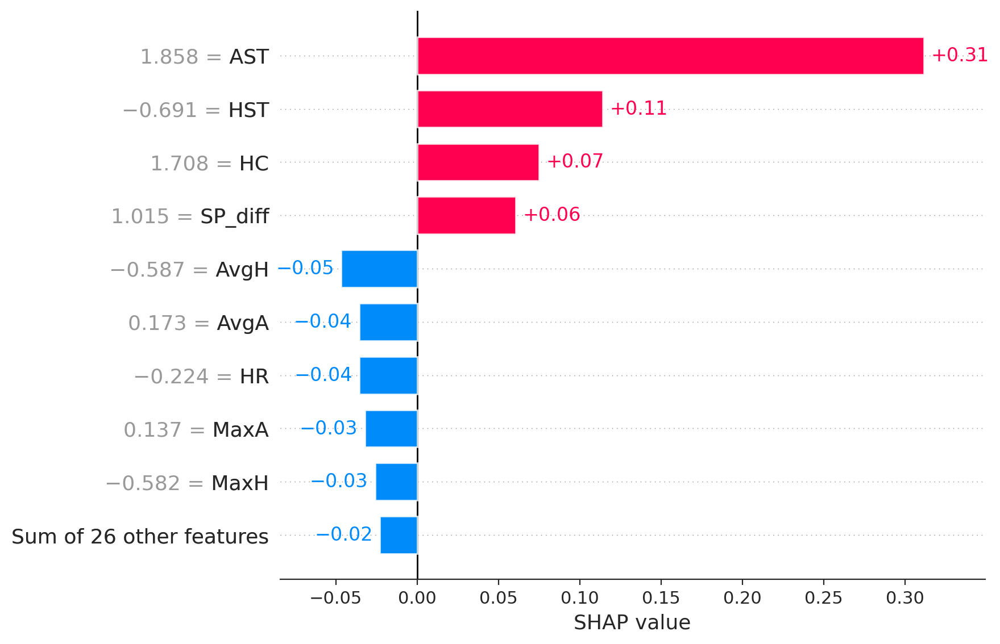

In [ ]:
# Bar Plot (Force Plot)
shap.plots.bar(explanation)
plt.show()

In [ ]:
len(explanation)

35

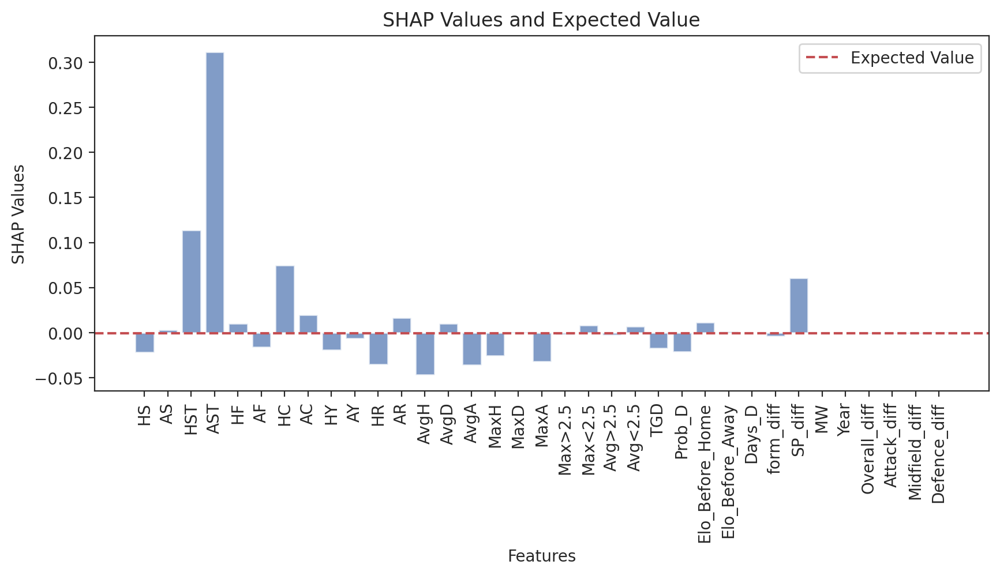

In [ ]:
import shap
import matplotlib.pyplot as plt
import numpy as np

# Initialize SHAP and explain the model predictions
shap.initjs()

# Calculate expected base value for this instance
expected_value = np.mean(np.mean(shap_values[0], axis=0))

# Create an Explanation object with feature names
explanation = shap.Explanation(
    values=shap_values[0][row_idx],
    base_values=expected_value,
    data=X_test_df.iloc[row_idx],
    feature_names=feature_names
)

# Display expected value and SHAP values in a custom bar plot
plt.figure(figsize=(10, 4))
plt.bar(range(len(explanation.values)), explanation.values, color='b', alpha=0.7)
plt.axhline(expected_value, color='r', linestyle='--', label='Expected Value')
plt.xticks(range(len(explanation.values)), feature_names, rotation=90)
plt.xlabel('Features')
plt.ylabel('SHAP Values')
plt.legend(loc='upper right')
plt.title('SHAP Values and Expected Value')
plt.show()


In [ ]:
print(X_test_df.shape)
print(shap_values.shape)


(836, 35)
(836, 3, 35)


In [ ]:
len(shap_values)

836

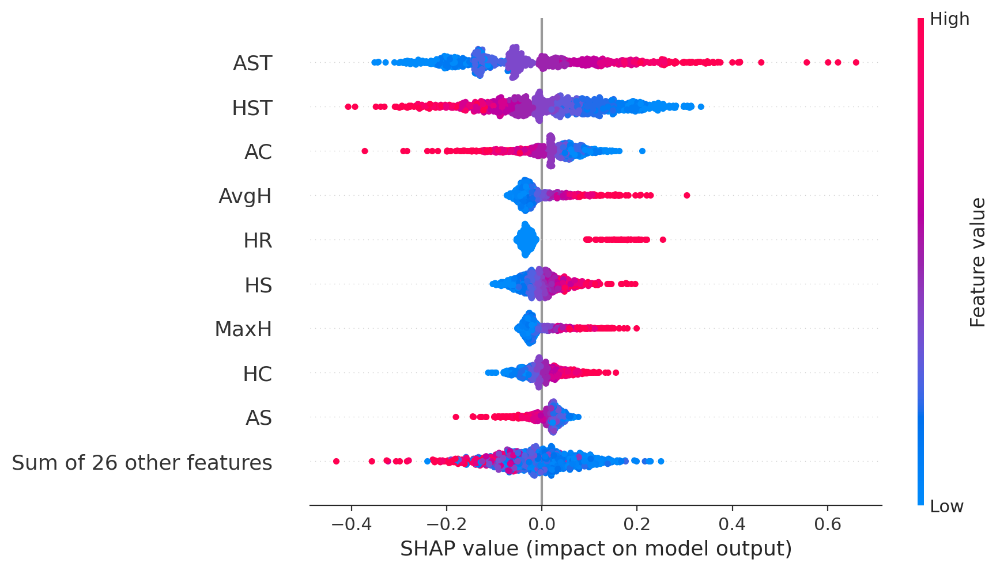

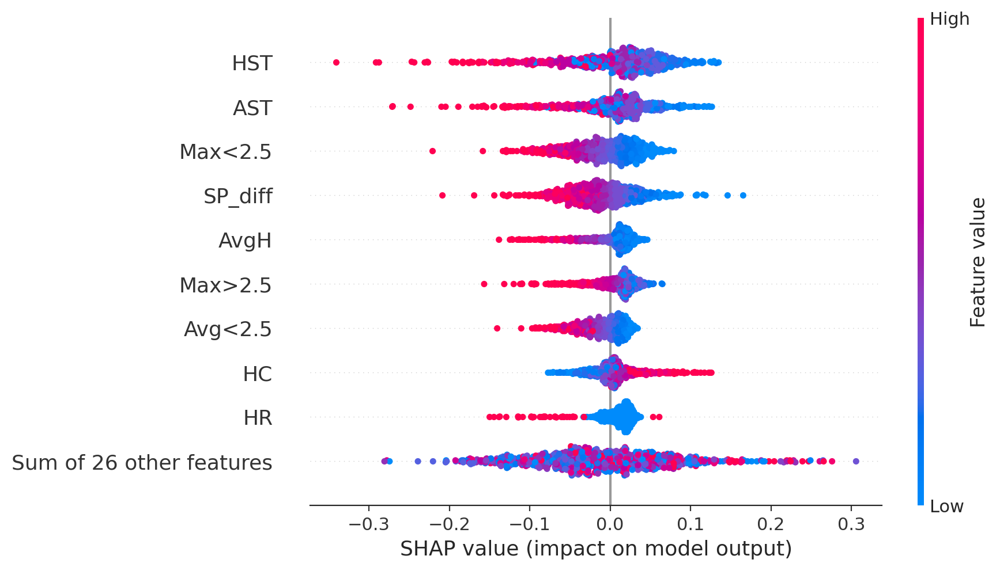

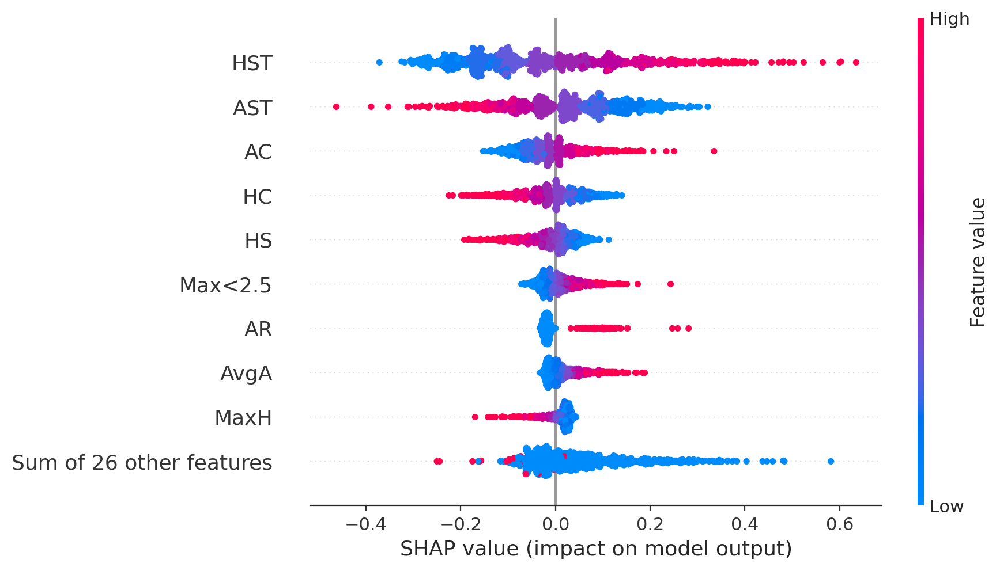

In [ ]:
num_classes =3 # Get the number of classes

for class_idx in range(num_classes):
    # Extract SHAP values for a specific class
    class_shap_values = shap_values[:, class_idx, :]

    # Create an Explanation object for the class
    class_explanation = shap.Explanation(
        values=class_shap_values,
        base_values=expected_value[class_idx],  # You may need to adjust this based on your expected values
        data=X_test_df,
        feature_names=feature_names
    )

    # Beeswarm Plot for a specific class
    shap.plots.beeswarm(class_explanation, max_display=10)  # Adjust max_display as needed
    # plt.title(f'Class {class_idx} Beeswarm Plot')
    # plt.show()

In [ ]:
# Calculate expected base value for this instance
expected_value = np.mean(np.mean(shap_values[1], axis=0));

# Create an Explanation object with feature names
explanation = shap.Explanation(
    values=shap_values[1][row_idx],
    base_values=expected_value,
    data=X_test_df.iloc[row_idx],
    feature_names=feature_names
);

In [ ]:
expected_value

-0.0003554998358420945

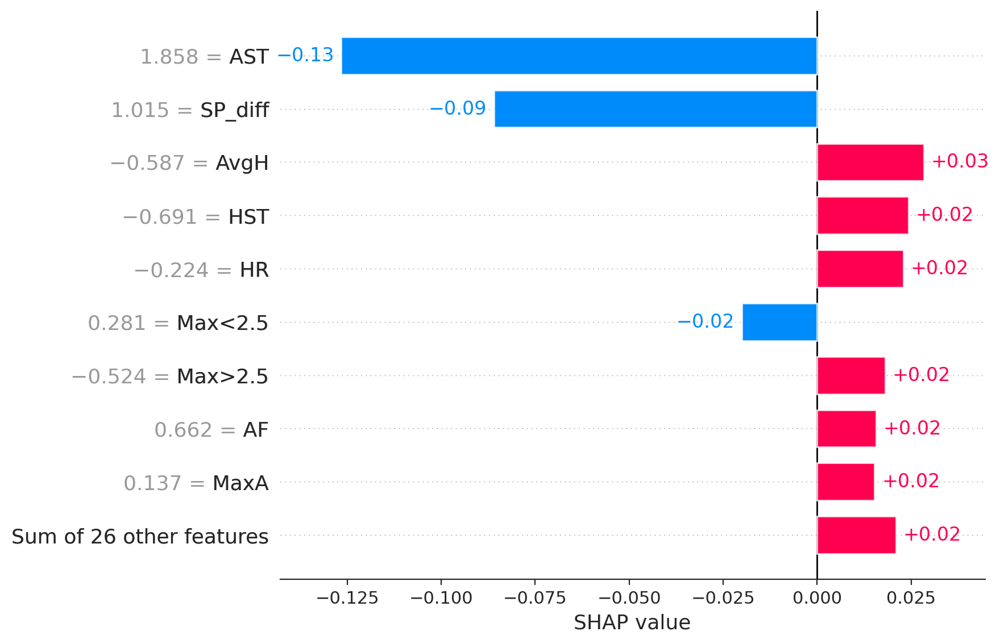

In [ ]:
# Bar Plot (Force Plot)
shap.plots.bar(explanation)
plt.show()

In [ ]:
# Calculate expected base value for this instance
expected_value = np.mean(shap_values[2], axis=0);

# Create an Explanation object with feature names
explanation = shap.Explanation(
    values=shap_values[2][row_idx],
    base_values=expected_value,
    data=X_test_df.iloc[row_idx],
    feature_names=feature_names
);

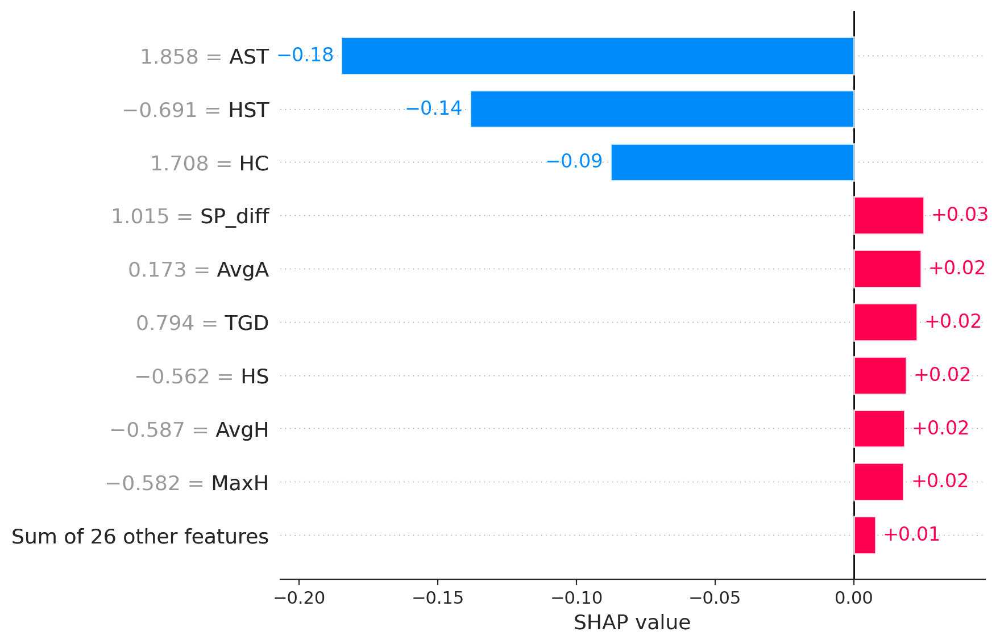

In [ ]:
# Bar Plot (Force Plot)
shap.plots.bar(explanation)
plt.show()

# **CNN**

In [ ]:
from sklearn.model_selection import train_test_split


X = pl.drop(columns=['FTR'])
y = pl['FTR']

# Split the data into training, validation, and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, stratify=y_train, test_size=0.2, random_state=42)

## scaling the data

In [ ]:
norm_cols=['MW', 'Year','Overall_diff', 'Attack_diff',\
       'Midfield_diff', 'Defence_diff']

In [ ]:
std_cols = [col for col in X_train.columns if col not in norm_cols]

In [ ]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler,Normalizer

In [ ]:
# Create transformers
stdscaling_transformer = StandardScaler()
normscaling_transformer = Normalizer()

# Create a ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ("std", stdscaling_transformer, std_cols),
        ("norm", normscaling_transformer, norm_cols)
    ],
    remainder='passthrough'
)

# Apply the transformations and convert back to a pandas DataFrame
X_train_scale = preprocessor.fit_transform(X_train)
X_train_scale = pd.DataFrame(X_train_scale, columns=std_cols + norm_cols)

In [ ]:
X_train_scale.head(5)

,HS,AS,HST,AST,HF,AF,HC,AC,HY,AY,...,Elo_Before_Away,Days_D,form_diff,SP_diff,MW,Year,Overall_diff,Attack_diff,Midfield_diff,Defence_diff
0,1.248926,-0.890176,2.436036,-0.042612,-1.049219,-1.103343,0.694070,-1.005056,-1.258602,0.194012,...,-0.663156,-0.084548,0.906443,0.433212,0.013874,0.999900,0.001486,0.001486,0.001486,0.000991
1,0.895203,-0.276835,1.390368,-0.849952,0.437093,0.019304,0.048280,-0.635969,0.385447,-0.583896,...,-0.628939,0.006743,0.136971,1.231089,0.002978,0.999995,0.000000,-0.000496,0.000993,-0.000496
2,-0.165966,0.540953,-0.352413,0.361057,0.734355,-1.103343,-0.274615,-0.635969,-0.436578,-1.361803,...,-1.561721,0.006743,-1.033718,0.433212,0.016351,0.999866,0.000495,0.000495,0.000495,0.000495
3,-0.342828,-0.890176,-0.352413,-0.849952,-0.157432,0.019304,-0.597511,-0.266882,0.385447,0.971919,...,-0.116855,-0.084548,0.038209,0.034274,0.002480,0.999996,0.000496,-0.000992,0.000496,-0.000496
4,-1.050274,-0.685729,-1.049525,-0.849952,1.031618,1.141951,-1.566197,0.102205,-0.436578,0.194012,...,-0.005477,-0.084548,-0.037837,-0.963073,0.000993,0.999998,0.000000,0.000993,0.001489,0.000496


In [ ]:
X_test_scale = preprocessor.fit_transform(X_test)
X_test_scale = pd.DataFrame(X_test_scale, columns=std_cols + norm_cols)

X_test_scale.head(5)

,HS,AS,HST,AST,HF,AF,HC,AC,HY,AY,...,Elo_Before_Away,Days_D,form_diff,SP_diff,MW,Year,Overall_diff,Attack_diff,Midfield_diff,Defence_diff
0,-0.561743,0.544859,-0.690512,1.858131,-1.599067,0.662203,1.707644,0.137403,-1.295508,1.093057,...,-0.059681,0.033114,0.137591,1.014738,0.006448,0.999973,0.000992,0.000992,0.002480,0.001984
1,-0.201469,1.573545,-1.023808,0.693956,-1.021482,0.947713,-1.209775,0.873739,-0.474398,1.936043,...,-0.174328,0.033114,0.174896,2.477192,0.001488,0.999987,-0.002480,-0.001984,-0.001984,-0.002976
2,-0.922016,1.779283,-1.023808,2.246189,0.133687,1.233222,0.411013,-0.598934,-0.474398,-0.592913,...,0.395013,0.142535,-0.380491,-1.520183,0.010885,0.999937,-0.001484,-0.001484,-0.001484,-0.000990
3,0.338942,-1.101039,0.309375,-0.082161,-1.021482,1.518731,3.004274,0.137403,1.167824,3.622013,...,-0.043499,0.142535,0.107122,0.429756,0.002978,0.999993,0.000496,0.000496,0.001489,0.001489
4,-0.741879,-0.483827,-0.690512,-0.470219,-0.732690,0.091185,-0.561460,-0.967103,-0.474398,-0.592913,...,0.854950,0.033114,0.844239,1.014738,0.012864,0.999891,0.003463,0.003463,0.003463,0.003958


In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from keras.regularizers import l2
from keras.optimizers import Adam
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import SMOTE
from sklearn.metrics import  make_scorer,f1_score,precision_score,recall_score

In [ ]:
num_classes = 3

In [ ]:
from sklearn.preprocessing import LabelEncoder
# Convert categorical target variables to integer labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# Get the number of classes in the target variable
num_classes = len(label_encoder.classes_)

In [ ]:
from keras.callbacks import Callback

class LossCallback(Callback):
    def on_epoch_end(self, epoch, logs=None):
        print(f"\nEpoch {epoch+1}/{self.params['epochs']} - ")

In [ ]:
X_train_cnn = np.expand_dims(X_train_scale, axis=-1)
X_test_cnn = np.expand_dims(X_test_scale, axis=-1)

In [ ]:
from keras.regularizers import l2
from keras.optimizers import Adam
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import SMOTE
from sklearn.metrics import  make_scorer,f1_score,precision_score,recall_score

#  learning rate
custom_learning_rate = 0.001

# Initialize lists to store cross-validation results
cv_scores = []

# Define the number of splits for StratifiedKFold
n_splits = 5

# Create an instance of the custom callback
loss_callback = LossCallback()

# Initialize StratifiedKFold with SMOTE
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Initialize SMOTE
smote = SMOTE(sampling_strategy='auto', random_state=42)

# Iterate over the cross-validation folds
for train_idx, val_idx in skf.split(X_train_cnn, y_train_encoded):
    X_train_fold, X_val_fold = X_train_cnn[train_idx], X_train_cnn[val_idx]
    y_train_fold, y_val_fold = y_train_encoded[train_idx], y_train_encoded[val_idx]

    # Apply SMOTE to the training fold
    X_train_fold_reshaped = X_train_fold.reshape(X_train_fold.shape[0], -1)  # Flatten the 3D input data
    X_train_fold_resampled, y_train_fold_resampled = smote.fit_resample(X_train_fold_reshaped, y_train_fold)
    X_train_fold_resampled = X_train_fold_resampled.reshape(X_train_fold_resampled.shape[0], X_train_fold.shape[1], 1)  # Reshape back to 3D

    # Create and compile the model inside the loop (if you want to start fresh for each fold)
    model = keras.Sequential([
    # 1D convolutional layer with 32 filters and kernel size of 3
        layers.Conv1D(64, kernel_size=3, strides=2, activation='relu', input_shape=(X_train.shape[1], 1)),
    # MaxPooling layer to downsample the data
        # layers.MaxPooling1D(pool_size=2),
        layers.AveragePooling1D(pool_size=2),
    # Dropout layer with a specified dropout rate
        layers.Dropout(0.1),
    # Flatten the data to prepare for the fully connected layers
        layers.Flatten(),
    # fully connected (dense) layer with 64 neurons, ReLU activation, and L2 regularization
        layers.Dense(64, activation='relu', kernel_regularizer=l2(0.01)),  # Adjust the L2 regularization strength as needed
    # Dropout layer
        layers.Dropout(0.5),
    # output layer with the number of classes and softmax activation
        layers.Dense(num_classes, activation='softmax')

    ])

    # Use the Adam optimizer with the custom learning rate
    custom_optimizer = Adam(learning_rate=custom_learning_rate)

    model.compile(optimizer = custom_optimizer,
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

    # Train the model for a fixed number of epochs
    history = model.fit(X_train_fold_resampled, y_train_fold_resampled, epochs=50, batch_size=64,
                        validation_data=(X_val_fold, y_val_fold),
                        callbacks=[loss_callback])

    # Training the model in the training set
    train_loss, train_acc = model.evaluate(X_val_fold, y_val_fold)



Epoch 1/50
52/56 [==========================>...] - ETA: 0s - loss: 1.7159 - accuracy: 0.4826
Epoch 1/50 - 
56/56 [==============================] - 2s 11ms/step - loss: 1.6889 - accuracy: 0.4853 - val_loss: 1.2792 - val_accuracy: 0.5650
Epoch 2/50
49/56 [=========================>....] - ETA: 0s - loss: 1.1863 - accuracy: 0.5300
Epoch 2/50 - 
56/56 [==============================] - 0s 7ms/step - loss: 1.1691 - accuracy: 0.5365 - val_loss: 1.0398 - val_accuracy: 0.5740
Epoch 3/50
51/56 [==========================>...] - ETA: 0s - loss: 1.0323 - accuracy: 0.5487
Epoch 3/50 - 
56/56 [==============================] - 0s 7ms/step - loss: 1.0317 - accuracy: 0.5488 - val_loss: 0.9867 - val_accuracy: 0.5740
Epoch 4/50
56/56 [==============================] - ETA: 0s - loss: 0.9933 - accuracy: 0.5563
Epoch 4/50 - 
56/56 [==============================] - 0s 6ms/step - loss: 0.9933 - accuracy: 0.5563 - val_loss: 0.9396 - val_accuracy: 0.5904
Epoch 5/50
47/56 [========================>.....] -

In [ ]:
import numpy as np

# Convert the Pandas DataFrame to a NumPy array
X_test_scale_array = X_test_scale.values

# Reshape the NumPy array to add the channel dimension
X_test_scale_reshaped = X_test_scale_array.reshape(X_test_scale_array.shape[0], X_test_scale_array.shape[1], 1)

In [ ]:
from sklearn.metrics import classification_report
# Convert probabilities to class labels
y_pred_cnn = model.predict(X_test_scale_reshaped);
y_pred_cnn_labels = np.argmax(y_pred_cnn, axis=1)

# Now, you can use classification_report with discrete class labels
class_report_cnn = classification_report(y_test_encoded, y_pred_cnn_labels)
print("\nClassification Report:")
print(class_report_cnn)


27/27 [==============================] - 0s 2ms/step

Classification Report:
              precision    recall  f1-score   support

           0       0.65      0.60      0.62       260
           1       0.33      0.46      0.38       190
           2       0.75      0.65      0.69       386

    accuracy                           0.59       836
   macro avg       0.57      0.57      0.57       836
weighted avg       0.62      0.59      0.60       836



27/27 [==============================] - 0s 3ms/step


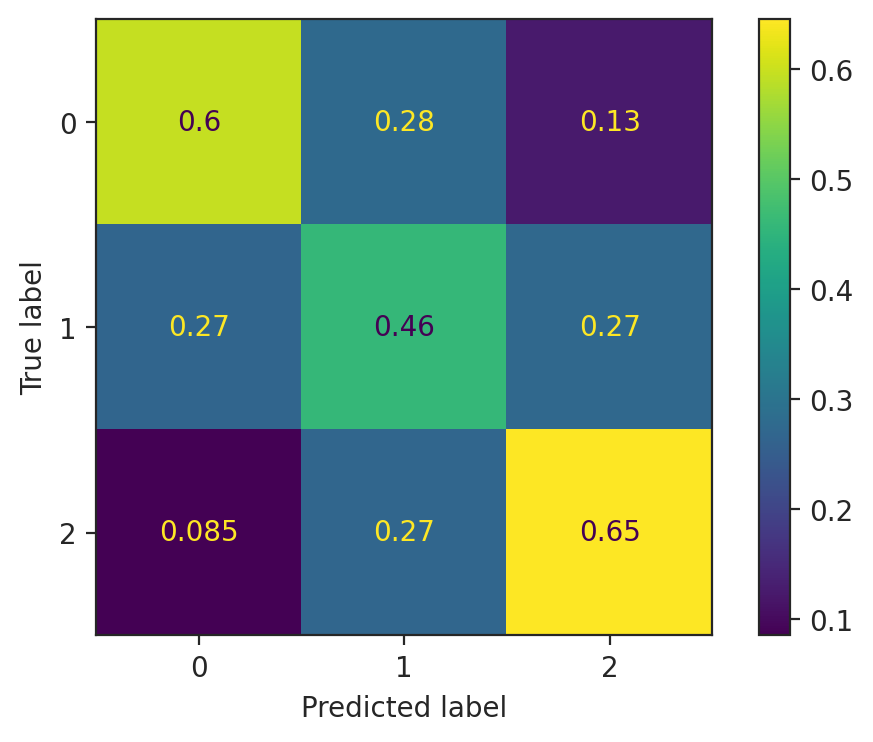

In [ ]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_test_encoded,np.argmax(model.predict(X_test_scale_reshaped), axis=1),normalize='true')
ConfusionMatrixDisplay(confusion_matrix=cm).plot();

# **Voting Ensemble**

In [ ]:
from sklearn.ensemble import VotingClassifier

# **Voting with MLP**

In [ ]:
from sklearn.svm import SVC
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from imblearn.over_sampling import SMOTE

In [ ]:
from sklearn.preprocessing import LabelEncoder
# Convert categorical target variables to integer labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.fit_transform(y_test)
y_val_encoded = label_encoder.fit_transform(y_val)

# Get the number of classes in the target variable
num_classes = len(label_encoder.classes_)

In [ ]:
selected_features_svm = ['HS', 'AS', 'HST', 'AST', 'AC', 'HR', 'AR', 'AvgA', 'MaxH', 'MaxA',
       'MW', 'Overall_diff', 'Midfield_diff']
selected_features_histgradboost = ['HS', 'AS', 'HST', 'AST', 'HF', 'HC', 'AC', 'HY', 'AY', 'HR', 'AR',
       'AvgH', 'AvgA', 'MaxH', 'MaxA', 'Year', 'Max>2.5', 'Max<2.5', 'Avg>2.5',
       'TGD', 'Elo_Before_Home', 'Days_D', 'SP_diff', 'Overall_diff',
       'Attack_diff']
selected_features_logistic = ['HS', 'AS', 'HST', 'AST', 'AC', 'HR', 'AR', 'AvgH', 'AvgA', 'MaxA']
selected_features_mlp = X_train_scale.columns

In [ ]:
selected_features_mlp

Index(['HS', 'AS', 'HST', 'AST', 'HF', 'AF', 'HC', 'AC', 'HY', 'AY', 'HR',
       'AR', 'AvgH', 'AvgD', 'AvgA', 'MaxH', 'MaxD', 'MaxA', 'Max>2.5',
       'Max<2.5', 'Avg>2.5', 'Avg<2.5', 'TGD', 'Prob_D', 'Elo_Before_Home',
       'Elo_Before_Away', 'Days_D', 'form_diff', 'SP_diff', 'MW', 'Year',
       'Overall_diff', 'Attack_diff', 'Midfield_diff', 'Defence_diff'],
      dtype='object')

In [ ]:
from sklearn.base import BaseEstimator, TransformerMixin

class FeatureSelector(BaseEstimator, TransformerMixin):
    def __init__(self, selected_features):
        self.selected_features = selected_features

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        return X[self.selected_features]


In [ ]:
# Create custom transformers for each model's selected features
feature_selector_svm = FeatureSelector(selected_features_svm)
feature_selector_histgradboost = FeatureSelector(selected_features_histgradboost)
feature_selector_logistic = FeatureSelector(selected_features_logistic)
feature_selector_mlp = FeatureSelector(selected_features_mlp)


# Fit the transformers on your training data
X_train_svm = feature_selector_svm.fit_transform(X_train_scale)
X_train_histgradboost = feature_selector_histgradboost.fit_transform(X_train_scale)
X_train_logistic = feature_selector_logistic.fit_transform(X_train_scale)
X_train_mlp = feature_selector_mlp.fit_transform(X_train_scale)



In [ ]:
from sklearn.ensemble import VotingClassifier
from sklearn.svm import SVC
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier

# Create individual models (SVM, HistGradientBoost, Logistic Regression)
svm_model = SVC(C=0.1, class_weight=None, degree=2, gamma='scale', kernel='linear')  # Replace with your actual SVM model
histgradboost_model = HistGradientBoostingClassifier(l2_regularization=0.1, learning_rate=0.1,\
        max_depth=3, max_leaf_nodes=200, min_samples_leaf=20,\
        max_iter=50)  # Replace with your actual HistGradientBoost model
logistic_model = LogisticRegression(multi_class='ovr', solver='liblinear', C=0.1, class_weight='balanced', penalty='l1')  # Replace with your actual Logistic Regression model
mlp_model = MLPClassifier(alpha=0.001, early_stopping=True, hidden_layer_sizes=(150,),\
              learning_rate='invscaling', max_iter=3000)


In [ ]:
X_train_scale

,HS,AS,HST,AST,HF,AF,HC,AC,HY,AY,...,Elo_Before_Away,Days_D,form_diff,SP_diff,MW,Year,Overall_diff,Attack_diff,Midfield_diff,Defence_diff
0,-1.396419,0.555852,-0.342593,1.196182,0.439857,-0.258782,-0.921011,-0.630620,1.220044,-0.585084,...,1.341247,0.093985,-2.073264,-0.171657,0.017384,0.999826,-0.002980,-0.003973,-0.002980,-0.003477
1,2.468657,-0.466638,1.760932,-0.838788,-1.043524,-1.097526,0.692840,-0.630620,-0.421615,-1.357973,...,0.841969,-0.093076,-0.088650,-0.567289,0.005932,0.999979,0.000494,-0.001483,0.001977,0.000989
2,1.238860,0.146856,0.709170,-0.431794,-0.450171,-2.495432,0.370070,-0.630620,-0.421615,-1.357973,...,-0.407460,-0.093076,0.087822,2.004324,0.001978,0.999969,0.003462,0.002473,0.004451,0.004451
3,-1.396419,1.373844,-1.394355,-0.024800,0.736533,1.139124,-1.243782,2.332769,1.220044,0.960694,...,2.074483,0.093985,-0.902241,-0.171657,0.013881,0.999896,-0.001983,-0.001487,-0.001983,-0.002479
4,-0.517992,0.351354,-0.693180,-0.024800,0.143181,-0.258782,-0.598241,0.480651,-0.421615,-0.585084,...,0.171091,0.187516,-0.005569,-1.160738,0.008436,0.999957,-0.001489,-0.001489,-0.000993,-0.002978
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2670,1.590231,0.146856,0.358582,0.382194,-0.153495,0.859542,1.661151,-1.741892,0.399215,-0.585084,...,-2.084115,0.093985,-0.098232,0.223976,0.009401,0.999928,0.003463,0.004453,0.003958,0.002969
2671,0.184749,0.351354,0.709170,-0.024800,-0.746848,0.579961,0.047299,-1.001044,-1.242444,-1.357973,...,-1.608261,0.000455,0.949199,1.015242,0.016359,0.999866,0.000000,-0.000991,0.000000,-0.000496
2672,-0.869363,0.146856,-1.043768,-0.024800,0.143181,-0.258782,0.047299,-0.260197,2.040873,-0.585084,...,-0.303647,0.093985,0.051921,-0.765106,0.005454,0.999985,0.000000,0.000496,0.000000,0.000000
2673,-0.166622,-0.262140,-0.342593,-0.024800,0.439857,-0.817945,-0.598241,-0.630620,-1.242444,-1.357973,...,0.848986,-0.186607,-0.280768,-2.545453,0.004468,0.999940,-0.004965,-0.004965,-0.004468,-0.005461


In [ ]:
# Initialize StratifiedKFold with SMOTE
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Iterate over the cross-validation folds
for train_idx, val_idx in skf.split(X_train_scale, y_train_encoded):
    X_train_fold, X_val_fold = X_train_scale.iloc[train_idx], X_train_scale.iloc[val_idx]  # Use iloc to access data by index
    y_train_fold, y_val_fold = y_train_encoded[train_idx], y_train_encoded[val_idx]

    # Apply SMOTE to the training fold
    smote = SMOTE(sampling_strategy='auto', random_state=42)
    X_train_fold_resampled, y_train_fold_resampled = smote.fit_resample(X_train_fold, y_train_fold)

    # Transform the features for each model using the respective selectors
    X_train_svm = feature_selector_svm.fit_transform(X_train_fold_resampled)
    X_train_histgradboost = feature_selector_histgradboost.fit_transform(X_train_fold_resampled)
    X_train_logistic = feature_selector_logistic.fit_transform(X_train_fold_resampled)
    X_train_mlp = feature_selector_mlp.fit_transform(X_train_fold_resampled)


In [ ]:
from itertools import product
from sklearn.metrics import accuracy_score
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import StratifiedKFold

# Define the range of weights to consider for each model
weight_ranges = [0.1, 0.2, 0.3, 0.4]
num_models = 4  # The number of models in the ensemble

# Initialize variables to store the best weight combination and accuracy
best_weight_combination = None
best_accuracy = 0.0

# Generate all possible weight combinations
weight_combinations = list(product(weight_ranges, repeat=num_models))

# Create StratifiedKFold for cross-validation
num_folds = 5  # You can adjust this as needed
kf = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

# Iterate over weight combinations
for weights in weight_combinations:
    # Ensure that the weights sum up to 1 (if needed)
    if sum(weights) != 1.0:
        continue

    # Initialize a list to store fold accuracies
    fold_accuracies = []

    # Iterate over the folds
    for train_index, val_index in kf.split(X_train_scale, y_train):
        # Split the data into training and validation sets for this fold
        X_train_fold, X_val_fold = X_train_scale.iloc[train_index], X_train_scale.iloc[val_index]
        y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

        # Apply SMOTE to the training data for this fold
        smote = SMOTE(random_state=42,sampling_strategy='auto')
        X_train_resampled, y_train_resampled = smote.fit_resample(X_train_fold, y_train_fold)

        # Create a VotingClassifier with the specified weights
        ensemble_model = VotingClassifier(estimators=[
            ('svm', svm_model),
            ('histgradboost', histgradboost_model),
            ('logistic', logistic_model),
            ('mlp', mlp_model)
        ], voting='hard', weights=weights)

        # Fit the VotingClassifier on the resampled training data
        ensemble_model.fit(X_train_resampled, y_train_resampled)

        # Make predictions on the validation set for this fold
        y_val_pred = ensemble_model.predict(X_val_fold)

        # Calculate accuracy (you can use other metrics as well)
        fold_accuracy = accuracy_score(y_val_fold, y_val_pred)
        fold_accuracies.append(fold_accuracy)

    # Calculate the mean accuracy across folds for this weight combination
    mean_accuracy = sum(fold_accuracies) / len(fold_accuracies)

    # Check if this combination of weights is the best so far
    if mean_accuracy > best_accuracy:
        best_accuracy = mean_accuracy
        best_weight_combination = weights

# Print the best weight combination and its corresponding accuracy
print("Best Weight Combination:", best_weight_combination)
print("Best Accuracy:", best_accuracy)


Best Weight Combination: (0.1, 0.3, 0.2, 0.4)
Best Accuracy: 0.5902803738317758


In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import VotingClassifier

# Define the best weight combination you found
best_weights = (0.1, 0.3, 0.2, 0.4)

# Apply SMOTE to the entire training dataset
smote = SMOTE(random_state=42, sampling_strategy='auto')
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_scale, y_train)

# Create a VotingClassifier with the best weights
ensemble_model = VotingClassifier(estimators=[
    ('svm', svm_model),
    ('histgradboost', histgradboost_model),
    ('logistic', logistic_model),
    ('mlp', mlp_model)
], voting='hard', weights=best_weights)

# Fit the VotingClassifier on the resampled training data
ensemble_model.fit(X_train_resampled, y_train_resampled)




VotingClassifier(estimators=[('svm', SVC(C=0.1, degree=2, kernel='linear')),
                             ('histgradboost',
                              HistGradientBoostingClassifier(l2_regularization=0.1,
                                                             max_depth=3,
                                                             max_iter=50,
                                                             max_leaf_nodes=200)),
                             ('logistic',
                              LogisticRegression(C=0.1, class_weight='balanced',
                                                 multi_class='ovr',
                                                 penalty='l1',
                                                 solver='liblinear')),
                             ('mlp',
                              MLPClassifier(alpha=0.001, early_stopping=True,
                                            hidden_layer_sizes=(150,),
                                            learning_rate='invscaling',
                                            max_iter=3000))],
                 weights=(0.1, 0.3, 0.2, 0.4))

In [ ]:
X_val_scale.columns

Index(['HS', 'AS', 'HST', 'AST', 'HF', 'AF', 'HC', 'AC', 'HY', 'AY', 'HR',
       'AR', 'AvgH', 'AvgD', 'AvgA', 'MaxH', 'MaxD', 'MaxA', 'Max>2.5',
       'Max<2.5', 'Avg>2.5', 'Avg<2.5', 'TGD', 'Prob_D', 'Elo_Before_Home',
       'Elo_Before_Away', 'Days_D', 'form_diff', 'SP_diff', 'MW', 'Year',
       'Overall_diff', 'Attack_diff', 'Midfield_diff', 'Defence_diff'],
      dtype='object')

In [ ]:
len(X_val_scale.columns)

35

In [ ]:
from sklearn.metrics import classification_report
y_pred_ensemble_model = ensemble_model.predict(X_val_scale)
class_report_ensemble_model = classification_report(y_val, y_pred_ensemble_model )
print("\nClassification Report:")
print(class_report_ensemble_model)


Classification Report:
              precision    recall  f1-score   support

           A       0.62      0.67      0.64       210
           D       0.34      0.43      0.38       160
           H       0.78      0.62      0.69       299

    accuracy                           0.59       669
   macro avg       0.58      0.57      0.57       669
weighted avg       0.62      0.59      0.60       669



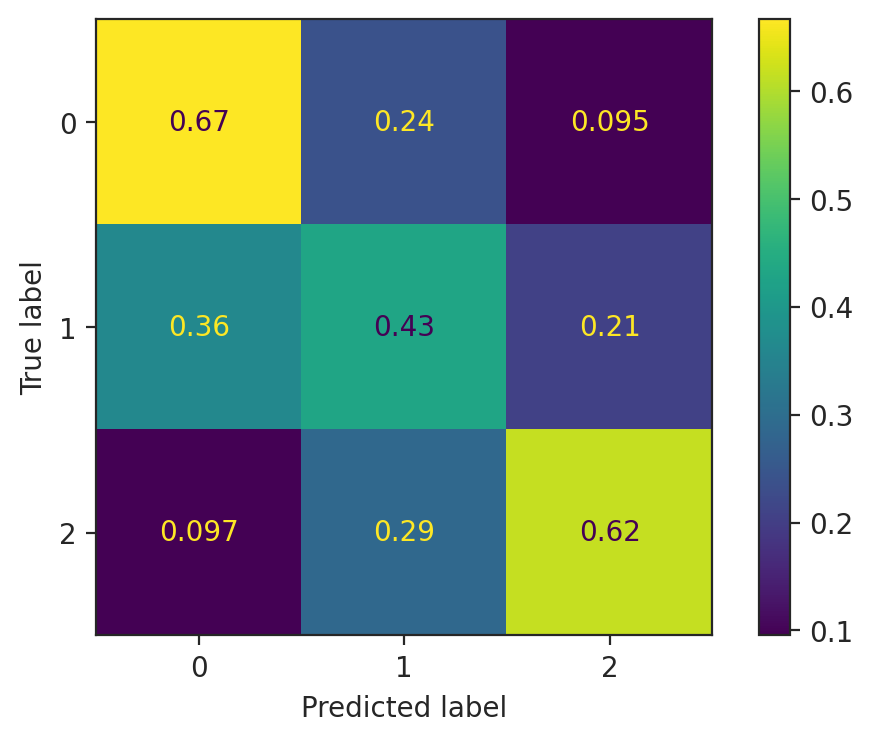

In [ ]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_val, ensemble_model.predict(X_val_scale), normalize='true')
ConfusionMatrixDisplay(confusion_matrix=cm).plot();

In [ ]:
from sklearn.metrics import classification_report
y_pred_ensemble_model = ensemble_model.predict(X_test_scale)
class_report_ensemble_model = classification_report(y_test, y_pred_ensemble_model )
print("\nClassification Report:")
print(class_report_ensemble_model)


Classification Report:
              precision    recall  f1-score   support

           A       0.62      0.65      0.64       260
           D       0.31      0.39      0.34       190
           H       0.76      0.63      0.69       386

    accuracy                           0.58       836
   macro avg       0.56      0.56      0.56       836
weighted avg       0.61      0.58      0.59       836



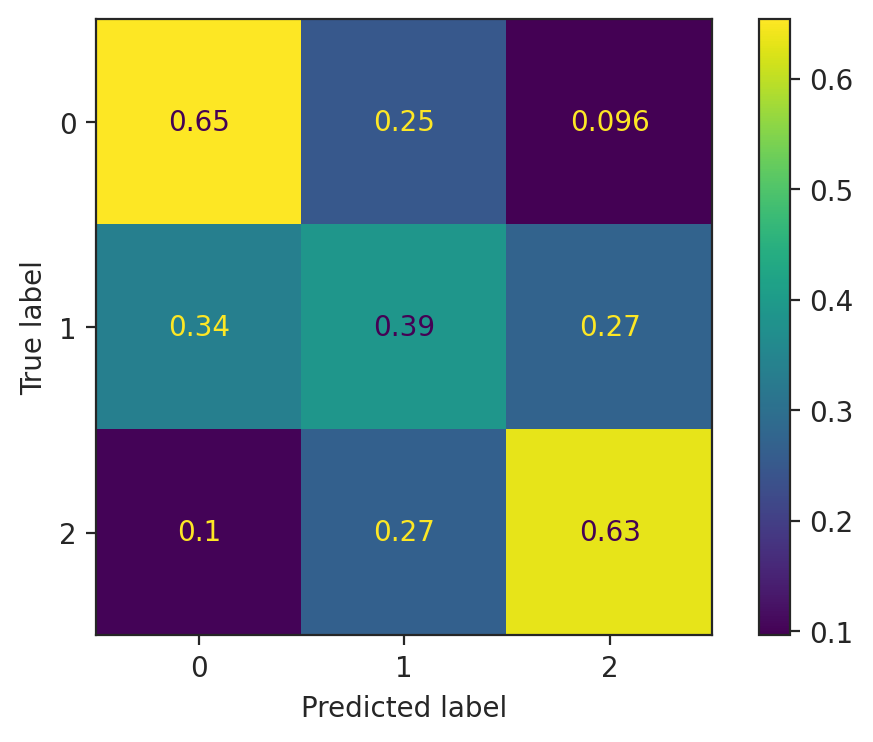

In [ ]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_test, ensemble_model.predict(X_test_scale), normalize='true')
ConfusionMatrixDisplay(confusion_matrix=cm).plot();

In [ ]:
import pickle

# Save the ensemble_model to a file
with open('ensemble_model.pkl', 'wb') as model_file:
    pickle.dump(ensemble_model, model_file)


In [ ]:
# Assuming X_test_scale and y_test are DataFrames

# Save X_test_scale to a CSV file
X_test_scale.to_csv('X_test_scale.csv', index=False)

# Save y_test to a CSV file
y_test.to_csv('y_test.csv', index=False)


## **SHAP**

In [ ]:
!pip install -q shap
import shap
shap.initjs()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.9/547.9 kB 8.8 MB/s eta 0:00:00


Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


In [ ]:
import shap
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
pred = ensemble_model.predict(X_test_scale)

In [ ]:
pred[0]

'A'

In [ ]:
import shap

# Step 1: Choose an instance (e.g., the first instance in your test data)
instance_idx = 0
instance = X_test_scale.iloc[instance_idx]  # Replace with the instance you want to explain

# Step 2: Extract one of the base models (e.g., SVM)
base_model = ensemble_model.estimators_[0]  # Select the SVM model (index 0)

# Step 3: Initialize the SHAP explainer for the base model
explainer = shap.Explainer(base_model, X_train_scale)  # X_train is your training data

# Step 4: Compute SHAP values for the chosen instance
shap_values = explainer.shap_values(instance)

# Visualize the SHAP values (replace '0' with the class index if it's a multi-class model)
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[0], instance)

In [ ]:
# Initialize a list to store SHAP explanations for each model
shap_explanations = []

# Iterate over the models in your ensemble
for model in ensemble_model.estimators_:
    # Initialize the SHAP explainer for the current model
    explainer = shap.Explainer(base_model, X_train_scale)  # X_train is your training data

    # Compute SHAP values for the chosen instance
    shap_values = explainer.shap_values(instance)

    # Create a SHAP explanation for the current model
    explanation = shap.Explanation(
        values=shap_values[0],  # Use the SHAP values for the first class (replace with class index if needed)
        base_values=explainer.expected_value[0],  # Use the expected value for the first class
        data=instance,
        feature_names=X_train_scale.columns
    )

    # Append the explanation to the list
    shap_explanations.append(explanation)

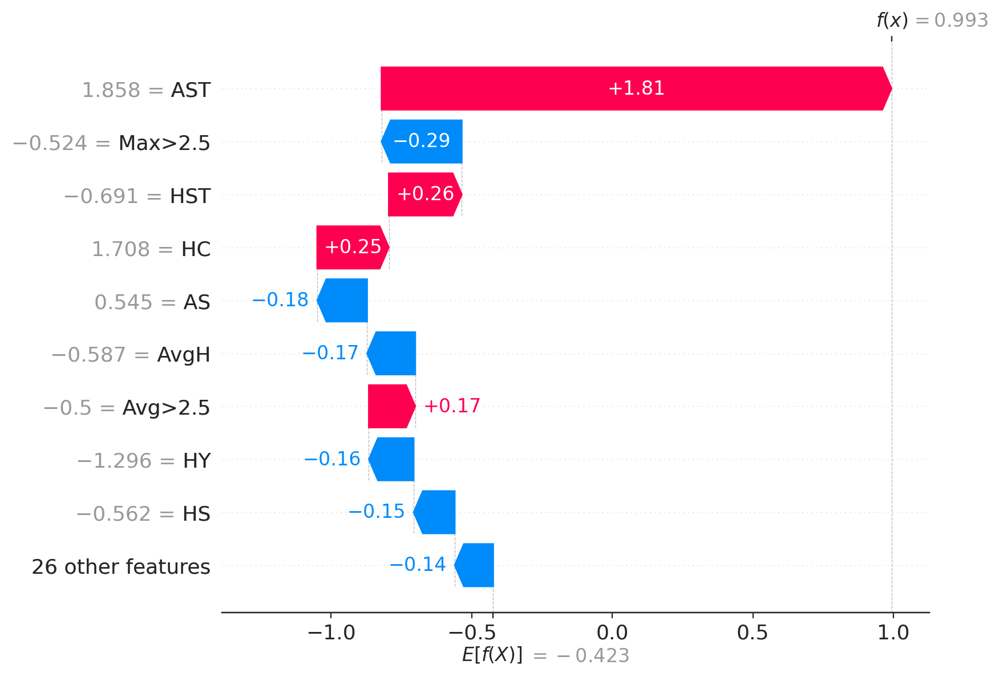

In [ ]:
shap.initjs()
shap.plots.waterfall(explanation)

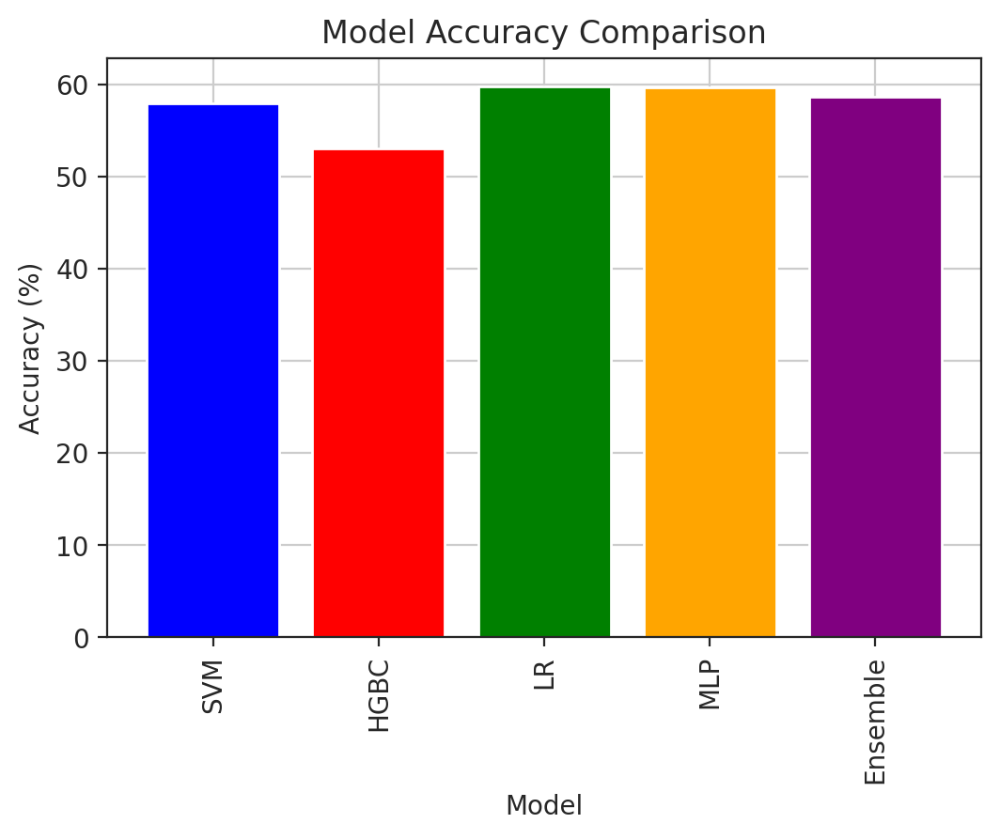

In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import numpy as np

# Define the best weight combination you found
best_weights = (0.1, 0.3, 0.2, 0.4)

# Create a VotingClassifier with the best weights
ensemble_model = VotingClassifier(estimators=[
    ('svm', svm_model),
    ('histgradboost', histgradboost_model),
    ('logistic', logistic_model),
    ('mlp', mlp_model)
], voting='hard', weights=best_weights)

# Apply SMOTE to the entire training dataset
smote = SMOTE(random_state=42, sampling_strategy='auto')
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_scale, y_train)

# Fit the ensemble model on the resampled training data
ensemble_model.fit(X_train_resampled, y_train_resampled)

# Calculate the accuracy of the ensemble model on the test data
ensemble_accuracy = accuracy_score(y_test, ensemble_model.predict(X_test_scale)) * 100

# Define the names of all models (including the ensemble)
modelnames = ["SVM", "HGBC", "LR", "MLP", "Ensemble"]

# Create a list to store the accuracy scores of all models
scores = []

# Iterate over all models and calculate their accuracy scores
for model in [svm_model, histgradboost_model, logistic_model, mlp_model, ensemble_model]:
    try:
        # Use the resampled data for all models
        model.fit(X_train_resampled, y_train_resampled)
        accuracy = accuracy_score(y_test, model.predict(X_test_scale)) * 100
        scores.append(accuracy)
    except:
        scores.append(None)

# Filter out None values and corresponding model names
valid_scores = [score for score in scores if score is not None]
valid_modelnames = [modelname for modelname, score in zip(modelnames, scores) if score is not None]

# Plot the accuracy scores of valid models
plt.bar(range(len(valid_modelnames)), valid_scores, color=['blue', 'red', 'green', 'orange', 'purple'])
plt.xticks(range(len(valid_modelnames)), labels=valid_modelnames, rotation=90)
plt.grid(visible=True)
plt.xlabel("Model")
plt.ylabel("Accuracy (%)")
plt.title("Model Accuracy Comparison")
plt.show()


In [ ]:
y_test.iloc[20]

'H'

X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but HistGradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but HistGradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names


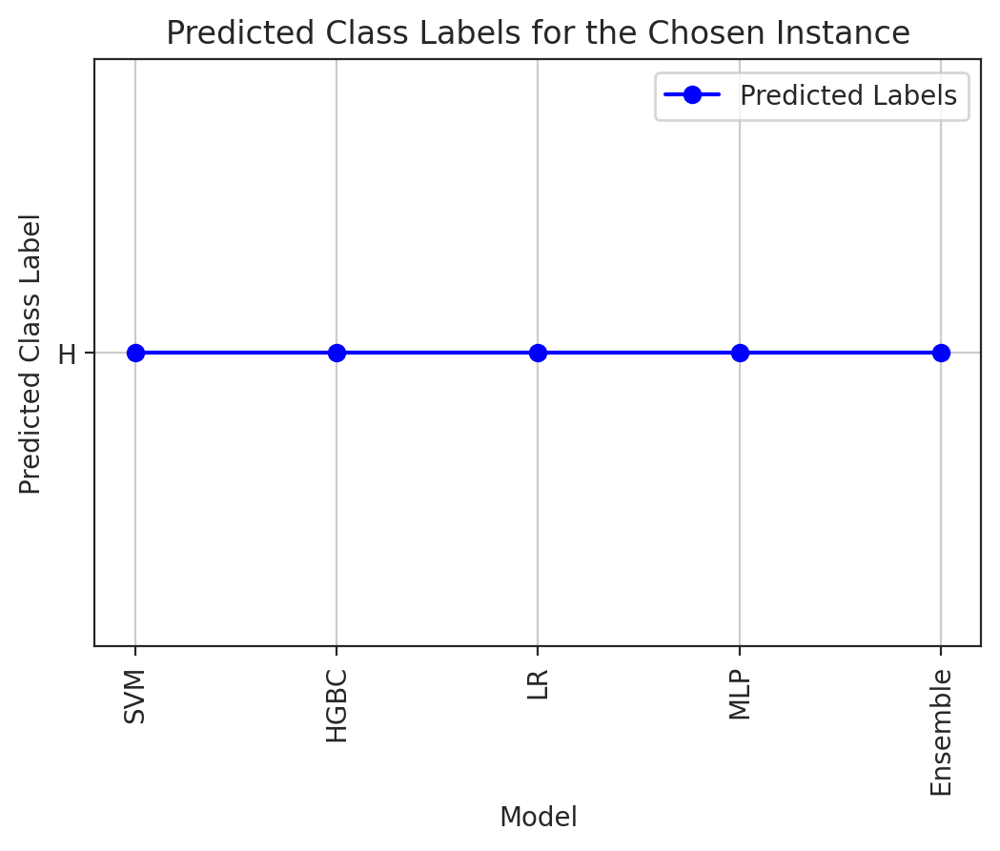

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Choose an instance index (e.g., 0 for the first instance)
instance_idx = 5

# Get the instance from the test data
instance = X_test_scale.iloc[instance_idx]

# Define the names of all models (including the ensemble)
modelnames = ["SVM", "HGBC", "LR", "MLP", "Ensemble"]

# Create lists to store the predicted class labels for each model
predicted_labels = []

# Iterate over all models and predict the class labels for the chosen instance
for model in [svm_model, histgradboost_model, logistic_model, mlp_model, ensemble_model]:
    try:
        # Use the resampled data for all models
        model.fit(X_train_resampled, y_train_resampled)
        predicted_label = model.predict(instance.values.reshape(1, -1))[0]
        predicted_labels.append(predicted_label)
    except:
        predicted_labels.append(None)

# Filter out None values and corresponding model names
valid_predicted_labels = [label for label in predicted_labels if label is not None]
valid_modelnames = [modelname for modelname, label in zip(modelnames, predicted_labels) if label is not None]

# Create a line plot for predicted class labels
x = range(len(valid_modelnames))
plt.plot(x, valid_predicted_labels, marker='o', linestyle='-', color='blue', label='Predicted Labels')
plt.xticks(x, valid_modelnames, rotation=90)
plt.grid(visible=True)
plt.xlabel("Model")
plt.ylabel("Predicted Class Label")
plt.title("Predicted Class Labels for the Chosen Instance")
plt.legend()
plt.show()


X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but HistGradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but HistGradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names


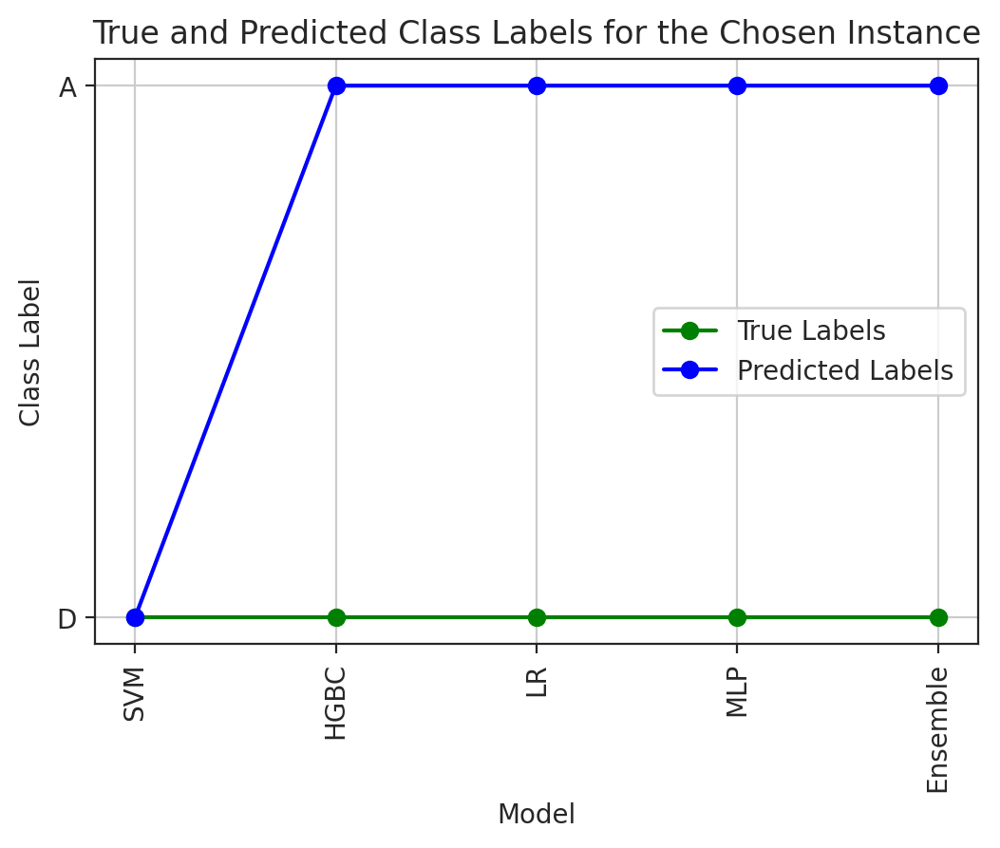

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Choose an instance index (e.g., 0 for the first instance)
instance_idx = 1

# Get the instance from the test data
instance = X_test_scale.iloc[instance_idx]

# Define the names of all models (including the ensemble)
modelnames = ["SVM", "HGBC", "LR", "MLP", "Ensemble"]

# Create lists to store the true and predicted class labels for each model
true_labels = []
predicted_labels = []

# Iterate over all models and predict the class labels for the chosen instance
for model in [svm_model, histgradboost_model, logistic_model, mlp_model, ensemble_model]:
    try:
        # Use the resampled data for all models
        model.fit(X_train_resampled, y_train_resampled)
        predicted_label = model.predict(instance.values.reshape(1, -1))[0]
        true_label = y_test.iloc[instance_idx]
        predicted_labels.append(predicted_label)
        true_labels.append(true_label)
    except:
        predicted_labels.append(None)
        true_labels.append(None)

# Filter out None values and corresponding model names
valid_predicted_labels = [label for label in predicted_labels if label is not None]
valid_true_labels = [label for label in true_labels if label is not None]
valid_modelnames = [modelname for modelname, label in zip(modelnames, predicted_labels) if label is not None]

# Create a line plot for both true and predicted class labels
x = range(len(valid_modelnames))
plt.plot(x, valid_true_labels, marker='o', linestyle='-', color='green', label='True Labels')
plt.plot(x, valid_predicted_labels, marker='o', linestyle='-', color='blue', label='Predicted Labels')
plt.xticks(x, valid_modelnames, rotation=90)
plt.grid(visible=True)
plt.xlabel("Model")
plt.ylabel("Class Label")
plt.title("True and Predicted Class Labels for the Chosen Instance")
plt.legend()
plt.show()


X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but HistGradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but HistGradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names


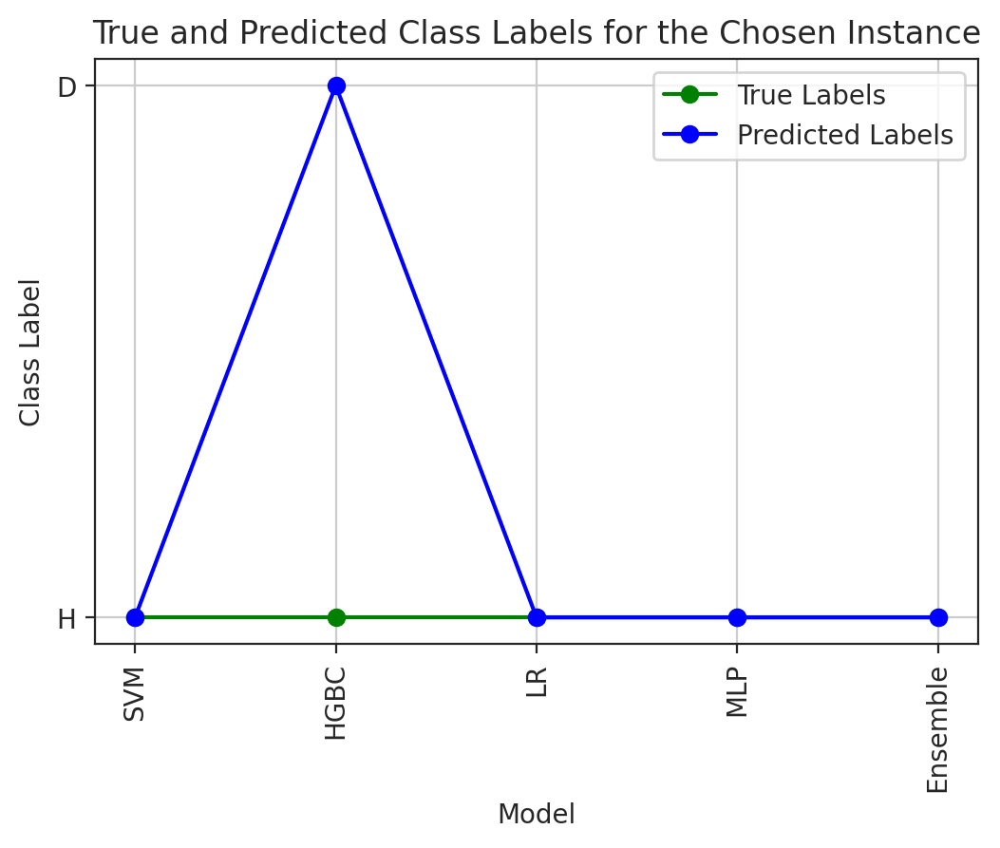

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Choose an instance index (e.g., 0 for the first instance)
instance_idx = 4

# Get the instance from the test data
instance = X_test_scale.iloc[instance_idx]

# Define the names of all models (including the ensemble)
modelnames = ["SVM", "HGBC", "LR", "MLP", "Ensemble"]

# Create lists to store the true and predicted class labels for each model
true_labels = []
predicted_labels = []

# Iterate over all models and predict the class labels for the chosen instance
for model in [svm_model, histgradboost_model, logistic_model, mlp_model, ensemble_model]:
    try:
        # Use the resampled data for all models
        model.fit(X_train_resampled, y_train_resampled)
        predicted_label = model.predict(instance.values.reshape(1, -1))[0]
        true_label = y_test.iloc[instance_idx]
        predicted_labels.append(predicted_label)
        true_labels.append(true_label)
    except:
        predicted_labels.append(None)
        true_labels.append(None)

# Filter out None values and corresponding model names
valid_predicted_labels = [label for label in predicted_labels if label is not None]
valid_true_labels = [label for label in true_labels if label is not None]
valid_modelnames = [modelname for modelname, label in zip(modelnames, predicted_labels) if label is not None]

# Create a line plot for both true and predicted class labels
x = range(len(valid_modelnames))
plt.plot(x, valid_true_labels, marker='o', linestyle='-', color='green', label='True Labels')
plt.plot(x, valid_predicted_labels, marker='o', linestyle='-', color='blue', label='Predicted Labels')
plt.xticks(x, valid_modelnames, rotation=90)
plt.grid(visible=True)
plt.xlabel("Model")
plt.ylabel("Class Label")
plt.title("True and Predicted Class Labels for the Chosen Instance")
plt.legend()
plt.show()


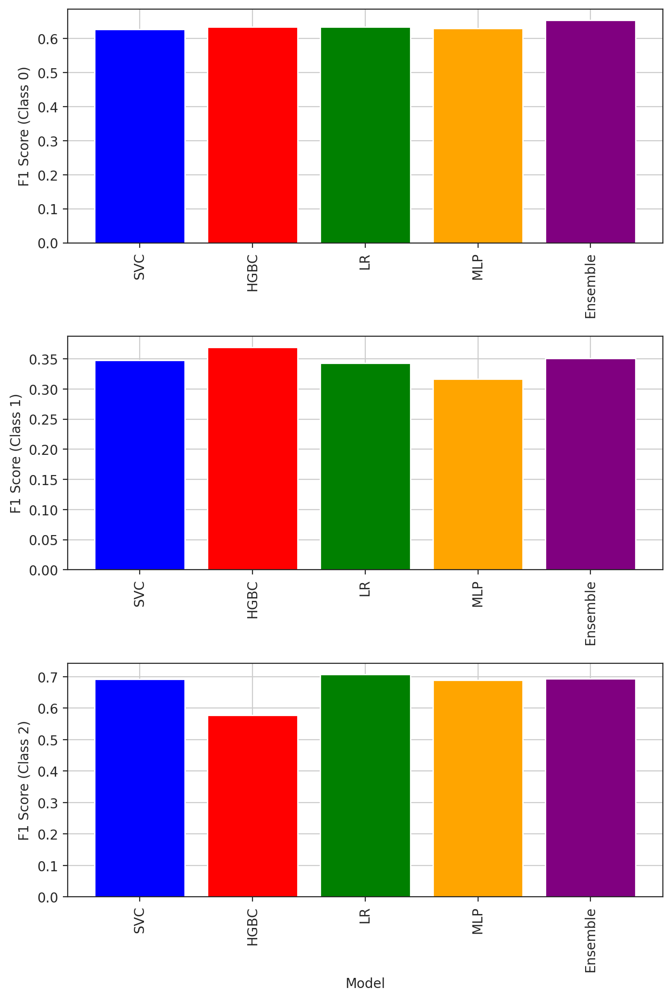

In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import f1_score, precision_score, recall_score
import matplotlib.pyplot as plt
import numpy as np

# Define the best weight combination you found
best_weights = (0.1, 0.3, 0.2, 0.4)

# Create a VotingClassifier with the best weights
ensemble_model = VotingClassifier(estimators=[
    ('svm', svm_model),
    ('histgradboost', histgradboost_model),
    ('logistic', logistic_model),
    ('mlp', mlp_model)
], voting='hard', weights=best_weights)

# Apply SMOTE to the entire training dataset
smote = SMOTE(random_state=42, sampling_strategy='auto')
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_scale, y_train)

# Fit the ensemble model on the resampled training data
ensemble_model.fit(X_train_resampled, y_train_resampled)

# Calculate the F1 score for each class
ensemble_f1 = f1_score(y_test, ensemble_model.predict(X_test_scale), average=None)

# Define the names of all models (including the ensemble)
modelnames = ["SVC", "HGBC", "LR", "MLP", "Ensemble"]

# Create lists to store the F1 scores for each class
f1_scores = {modelname: [] for modelname in modelnames}

# Iterate over all models and calculate their F1 scores for each class
for model, modelname in zip([svm_model, histgradboost_model, logistic_model, mlp_model, ensemble_model], modelnames):
    try:
        # Use the resampled data for all models
        model.fit(X_train_resampled, y_train_resampled)
        y_pred = model.predict(X_test_scale)

        f1 = f1_score(y_test, y_pred, average=None)
        f1_scores[modelname].extend(f1)
    except:
        f1_scores[modelname].extend([None] * len(np.unique(y_test)))

# Create subplots for F1 score for each class
num_classes = len(np.unique(y_test))
fig, axs = plt.subplots(num_classes, 1, figsize=(8, 12))
plt.subplots_adjust(hspace=0.4)

# Plot F1 scores for each class
for class_idx in range(num_classes):
    axs[class_idx].bar(range(len(modelnames)), [f1_scores[modelname][class_idx] for modelname in modelnames],
                      color=['blue', 'red', 'green', 'orange', 'purple'])
    axs[class_idx].set_xticks(range(len(modelnames)))
    axs[class_idx].set_xticklabels(modelnames, rotation=90)
    axs[class_idx].grid(visible=True)
    axs[class_idx].set_ylabel(f"F1 Score (Class {class_idx})")

plt.xlabel("Model")
plt.show()


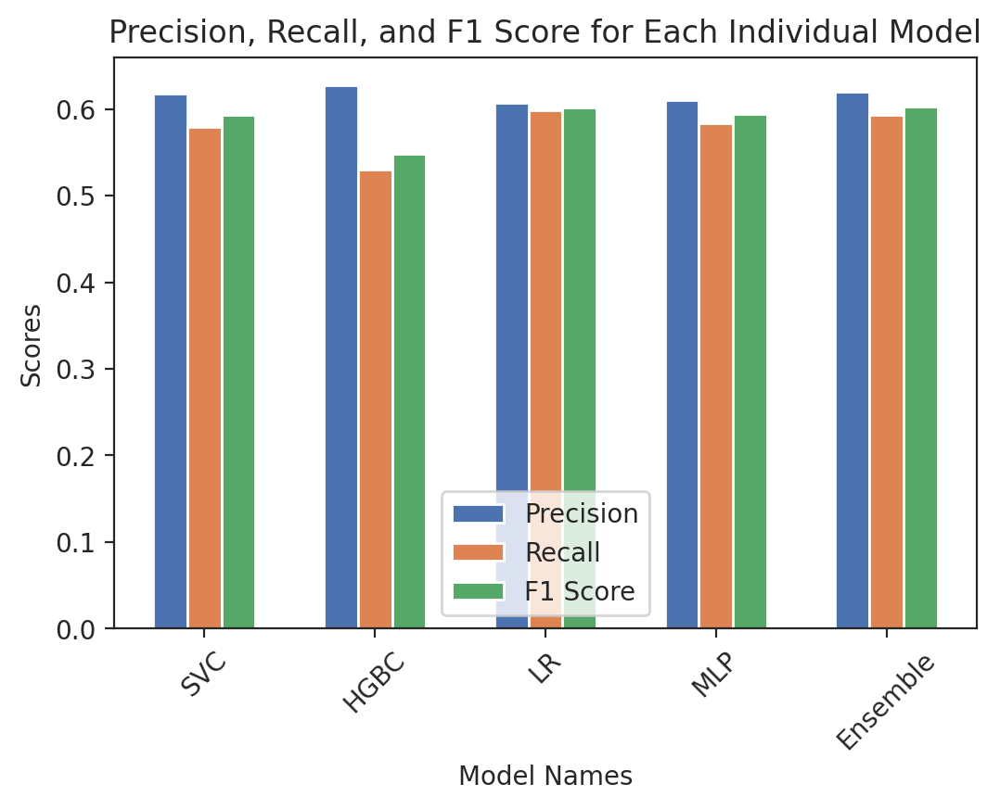

In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import numpy as np

# Define the best weight combination you found
best_weights = (0.1, 0.3, 0.2, 0.4)

# Create a VotingClassifier with the best weights
ensemble_model = VotingClassifier(estimators=[
    ('svm', svm_model),
    ('histgradboost', histgradboost_model),
    ('logistic', logistic_model),
    ('mlp', mlp_model)
], voting='hard', weights=best_weights)

# Apply SMOTE to the entire training dataset
smote = SMOTE(random_state=42, sampling_strategy='auto')
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_scale, y_train)

# Fit the ensemble model on the resampled training data
ensemble_model.fit(X_train_resampled, y_train_resampled)

# Define the names of all models (including the ensemble)
modelnames = ["SVC", "HGBC", "LR", "MLP", "Ensemble"]

# Calculate precision, recall, and F1 scores for each individual model
precision_scores = {}
recall_scores = {}
f1_scores = {}

for model, modelname in zip([svm_model, histgradboost_model, logistic_model, mlp_model, ensemble_model], modelnames):
    try:
        # Use the resampled data for all models
        model.fit(X_train_resampled, y_train_resampled)
        y_pred = model.predict(X_test_scale)

        precision = precision_score(y_test, y_pred, average='weighted')
        recall = recall_score(y_test, y_pred, average='weighted')
        f1 = f1_score(y_test, y_pred, average='weighted')

        precision_scores[modelname] = precision
        recall_scores[modelname] = recall
        f1_scores[modelname] = f1
    except:
        precision_scores[modelname] = None
        recall_scores[modelname] = None
        f1_scores[modelname] = None

# Create bar graphs for precision, recall, and F1 scores for each individual model
x = np.arange(len(modelnames))
width = 0.2

for label in ['Precision', 'Recall', 'F1 Score']:
    scores = [precision_scores[modelname] if label == 'Precision' else
              recall_scores[modelname] if label == 'Recall' else
              f1_scores[modelname] for modelname in modelnames]
    plt.bar(x, scores, width, label=label)
    x = [i + width for i in x]

plt.xlabel('Model Names')
plt.ylabel('Scores')
plt.title('Precision, Recall, and F1 Score for Each Individual Model')
plt.xticks([r + width for r in range(len(modelnames))], modelnames, rotation=45)
plt.legend()
plt.show()


In [ ]:
import pandas as pd

# Create a dictionary to store the scores
scores_dict = {
    'Model': modelnames,
    'Precision': [precision_scores[modelname] for modelname in modelnames],
    'Recall': [recall_scores[modelname] for modelname in modelnames],
    'F1 Score': [f1_scores[modelname] for modelname in modelnames]
}

# Create a DataFrame from the dictionary
scores_df = pd.DataFrame(scores_dict)

# Display the DataFrame
print(scores_df)


      Model  Precision    Recall  F1 Score
0       SVC   0.618229  0.578947  0.593258
1      HGBC   0.627875  0.529904  0.548134
2        LR   0.607135  0.598086  0.601500
3       MLP   0.610122  0.583732  0.593929
4  Ensemble   0.619760  0.593301  0.603297


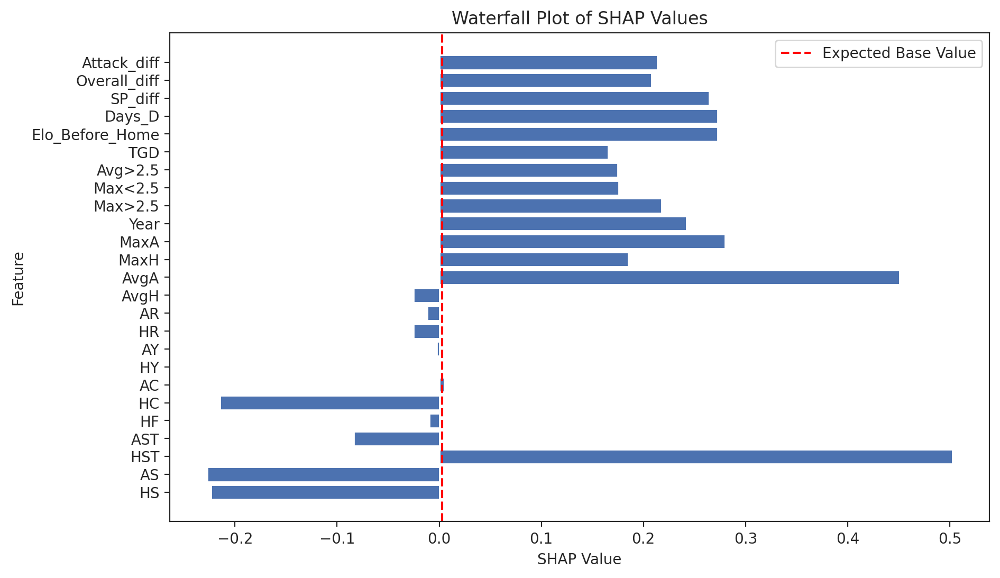

In [ ]:
import shap
import matplotlib.pyplot as plt
import numpy as np

shap.initjs()
# Initialize the SHAP explainer and compute SHAP values
explainer = shap.TreeExplainer(hgc)
shap_values = explainer.shap_values(X_test_hgc)

# Choose a specific instance to explain (you can change row_idx as needed)
row_idx = 0

# Get the expected base value for the specific instance
expected_value = explainer.expected_value[1]

# Calculate the contributions to the prediction for each feature
contributions = shap_values[0][row_idx]

# Create a waterfall plot
cumulative_contributions = np.cumsum(contributions)
feature_names = X_test_hgc.columns

plt.figure(figsize=(10, 6))
plt.barh(feature_names, cumulative_contributions)
plt.xlabel("SHAP Value")
plt.ylabel("Feature")
plt.title("Waterfall Plot of SHAP Values")
plt.axvline(expected_value, color='red', linestyle='--', label='Expected Base Value')
plt.legend()
plt.show()


# **CNN ensemble**

In [ ]:
from sklearn.model_selection import train_test_split


X = pl.drop(columns=['FTR'])
y = pl['FTR']

# Split the data into training, validation, and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, stratify=y_train, test_size=0.2, random_state=42)

## scaling the data

In [ ]:
norm_cols=['MW', 'Year','Overall_diff', 'Attack_diff',\
       'Midfield_diff', 'Defence_diff']

In [ ]:
std_cols = [col for col in X_train.columns if col not in norm_cols]

In [ ]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler,Normalizer

In [ ]:
# Create transformers
stdscaling_transformer = StandardScaler()
normscaling_transformer = Normalizer()

# Create a ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ("std", stdscaling_transformer, std_cols),
        ("norm", normscaling_transformer, norm_cols)
    ],
    remainder='passthrough'
)

# Apply the transformations and convert back to a pandas DataFrame
X_train_scale = preprocessor.fit_transform(X_train)
X_train_scale = pd.DataFrame(X_train_scale, columns=std_cols + norm_cols)

In [ ]:
X_train_scale.head(5)

,HS,AS,HST,AST,HF,AF,HC,AC,HY,AY,...,Elo_Before_Away,Days_D,form_diff,SP_diff,MW,Year,Overall_diff,Attack_diff,Midfield_diff,Defence_diff
0,-1.396419,0.555852,-0.342593,1.196182,0.439857,-0.258782,-0.921011,-0.630620,1.220044,-0.585084,...,1.341247,0.093985,-2.073264,-0.171657,0.017384,0.999826,-0.002980,-0.003973,-0.002980,-0.003477
1,2.468657,-0.466638,1.760932,-0.838788,-1.043524,-1.097526,0.692840,-0.630620,-0.421615,-1.357973,...,0.841969,-0.093076,-0.088650,-0.567289,0.005932,0.999979,0.000494,-0.001483,0.001977,0.000989
2,1.238860,0.146856,0.709170,-0.431794,-0.450171,-2.495432,0.370070,-0.630620,-0.421615,-1.357973,...,-0.407460,-0.093076,0.087822,2.004324,0.001978,0.999969,0.003462,0.002473,0.004451,0.004451
3,-1.396419,1.373844,-1.394355,-0.024800,0.736533,1.139124,-1.243782,2.332769,1.220044,0.960694,...,2.074483,0.093985,-0.902241,-0.171657,0.013881,0.999896,-0.001983,-0.001487,-0.001983,-0.002479
4,-0.517992,0.351354,-0.693180,-0.024800,0.143181,-0.258782,-0.598241,0.480651,-0.421615,-0.585084,...,0.171091,0.187516,-0.005569,-1.160738,0.008436,0.999957,-0.001489,-0.001489,-0.000993,-0.002978


In [ ]:
X_val_scale = preprocessor.fit_transform(X_val)
X_val_scale = pd.DataFrame(X_val_scale, columns=std_cols + norm_cols)

X_val_scale.head(5)

,HS,AS,HST,AST,HF,AF,HC,AC,HY,AY,...,Elo_Before_Away,Days_D,form_diff,SP_diff,MW,Year,Overall_diff,Attack_diff,Midfield_diff,Defence_diff
0,-0.163338,0.073125,-1.073667,0.280915,0.426005,0.298330,1.022407,0.070750,-0.497892,-1.378599,...,-0.300668,0.029292,-0.021987,-0.758409,0.003968,0.999990,-0.000496,-0.001488,-0.000992,0.000000
1,0.018481,-0.336252,-0.049985,-0.503771,-0.473040,-0.557024,-0.271192,0.070750,-0.497892,0.219811,...,-0.787930,-0.054452,0.756453,1.721466,0.010874,0.999923,0.002966,0.002471,0.003954,0.002471
2,1.654851,-1.769070,0.291242,-0.896114,-0.173358,0.868566,1.992606,-1.021518,1.159272,4.215836,...,0.265328,0.029292,0.266892,0.688185,0.009910,0.999913,0.003964,0.005946,0.003964,0.002973
3,0.563938,-1.564382,0.632469,-1.288458,-1.671767,-1.127260,0.375608,-1.385607,-0.497892,-0.579394,...,-0.183157,0.113035,0.124521,1.721466,0.005934,0.999963,0.002967,0.002473,0.003956,0.002967
4,0.563938,-1.155005,0.291242,-0.503771,0.426005,1.153684,2.639406,-0.657428,2.816437,1.019016,...,-0.435738,-0.054452,-0.104982,0.481529,0.005462,0.999984,0.000497,0.000993,0.000000,0.000497


In [ ]:
X_test_scale = preprocessor.fit_transform(X_test)
X_test_scale = pd.DataFrame(X_test_scale, columns=std_cols + norm_cols)

X_test_scale.head(5)

,HS,AS,HST,AST,HF,AF,HC,AC,HY,AY,...,Elo_Before_Away,Days_D,form_diff,SP_diff,MW,Year,Overall_diff,Attack_diff,Midfield_diff,Defence_diff
0,-0.561743,0.544859,-0.690512,1.858131,-1.599067,0.662203,1.707644,0.137403,-1.295508,1.093057,...,-0.059681,0.033114,0.137591,1.014738,0.006448,0.999973,0.000992,0.000992,0.002480,0.001984
1,-0.201469,1.573545,-1.023808,0.693956,-1.021482,0.947713,-1.209775,0.873739,-0.474398,1.936043,...,-0.174328,0.033114,0.174896,2.477192,0.001488,0.999987,-0.002480,-0.001984,-0.001984,-0.002976
2,-0.922016,1.779283,-1.023808,2.246189,0.133687,1.233222,0.411013,-0.598934,-0.474398,-0.592913,...,0.395013,0.142535,-0.380491,-1.520183,0.010885,0.999937,-0.001484,-0.001484,-0.001484,-0.000990
3,0.338942,-1.101039,0.309375,-0.082161,-1.021482,1.518731,3.004274,0.137403,1.167824,3.622013,...,-0.043499,0.142535,0.107122,0.429756,0.002978,0.999993,0.000496,0.000496,0.001489,0.001489
4,-0.741879,-0.483827,-0.690512,-0.470219,-0.732690,0.091185,-0.561460,-0.967103,-0.474398,-0.592913,...,0.854950,0.033114,0.844239,1.014738,0.012864,0.999891,0.003463,0.003463,0.003463,0.003958


In [ ]:
from sklearn.ensemble import VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
# from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.pipeline import Pipeline
from keras.models import Sequential
from keras.layers import Dense
import numpy as np


/usr/local/lib/python3.10/dist-packages/sklearn/experimental/enable_hist_gradient_boosting.py:16: UserWarning: Since version 1.0, it is not needed to import enable_hist_gradient_boosting anymore. HistGradientBoostingClassifier and HistGradientBoostingRegressor are now stable and can be normally imported from sklearn.ensemble.
  warnings.warn(


In [ ]:
from sklearn.preprocessing import LabelEncoder
# Convert categorical target variables to integer labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)
y_val_encoded = label_encoder.transform(y_val)

# Get the number of classes in the target variable
num_classes = len(label_encoder.classes_)

In [ ]:
X_train_cnn = np.expand_dims(X_train_scale, axis=-1)
X_test_cnn = np.expand_dims(X_test_scale, axis=-1)

In [ ]:
from keras.regularizers import l2
from keras.optimizers import Adam
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import SMOTE
from sklearn.metrics import  make_scorer,f1_score,precision_score,recall_score

#  learning rate
custom_learning_rate = 0.001

# Initialize lists to store cross-validation results
cv_scores = []

# Define the number of splits for StratifiedKFold
n_splits = 5

# Get the number of classes in the target variable
num_classes = len(label_encoder.classes_)

# Initialize lists to store trained CNN models
cnn_models = []


# Create an instance of the custom callback
loss_callback = LossCallback()

# Initialize StratifiedKFold with SMOTE
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Initialize SMOTE
smote = SMOTE(sampling_strategy='auto', random_state=42)

# Iterate over the cross-validation folds
for train_idx, val_idx in skf.split(X_train_cnn, y_train_encoded):
    X_train_fold, X_val_fold = X_train_cnn[train_idx], X_train_cnn[val_idx]
    y_train_fold, y_val_fold = y_train_encoded[train_idx], y_train_encoded[val_idx]

    # Apply SMOTE to the training fold
    X_train_fold_reshaped = X_train_fold.reshape(X_train_fold.shape[0], -1)  # Flatten the 3D input data
    X_train_fold_resampled, y_train_fold_resampled = smote.fit_resample(X_train_fold_reshaped, y_train_fold)
    X_train_fold_resampled = X_train_fold_resampled.reshape(X_train_fold_resampled.shape[0], X_train_fold.shape[1], 1)  # Reshape back to 3D

    # Create and compile the model inside the loop (if you want to start fresh for each fold)
    model = keras.Sequential([
    # 1D convolutional layer with 32 filters and kernel size of 3
        layers.Conv1D(64, kernel_size=3, strides=2, activation='relu', input_shape=(X_train.shape[1], 1)),
    # MaxPooling layer to downsample the data
        # layers.MaxPooling1D(pool_size=2),
        layers.AveragePooling1D(pool_size=2),
    # Dropout layer with a specified dropout rate
        layers.Dropout(0.1),
    # Flatten the data to prepare for the fully connected layers
        layers.Flatten(),
    # fully connected (dense) layer with 64 neurons, ReLU activation, and L2 regularization
        layers.Dense(64, activation='relu', kernel_regularizer=l2(0.01)),  # Adjust the L2 regularization strength as needed
    # Dropout layer
        layers.Dropout(0.5),
    # output layer with the number of classes and softmax activation
        layers.Dense(num_classes, activation='softmax')

    ])

    # Use the Adam optimizer with the custom learning rate
    custom_optimizer = Adam(learning_rate=custom_learning_rate)

    model.compile(optimizer = custom_optimizer,
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

    # Train the model for a fixed number of epochs
    history = model.fit(X_train_fold_resampled, y_train_fold_resampled, epochs=50, batch_size=64,
                        validation_data=(X_val_fold, y_val_fold),
                        callbacks=[loss_callback])


   # Append the trained CNN model to the list
    cnn_models.append(model)

Epoch 1/50
43/45 [===========================>..] - ETA: 0s - loss: 1.8185 - accuracy: 0.4535
Epoch 1/50 - 
45/45 [==============================] - 4s 20ms/step - loss: 1.8055 - accuracy: 0.4528 - val_loss: 1.4096 - val_accuracy: 0.5364
Epoch 2/50
39/45 [=========================>....] - ETA: 0s - loss: 1.3052 - accuracy: 0.5140
Epoch 2/50 - 
45/45 [==============================] - 0s 10ms/step - loss: 1.2884 - accuracy: 0.5210 - val_loss: 1.1058 - val_accuracy: 0.5645
Epoch 3/50
45/45 [==============================] - ETA: 0s - loss: 1.1045 - accuracy: 0.5430
Epoch 3/50 - 
45/45 [==============================] - 0s 9ms/step - loss: 1.1045 - accuracy: 0.5430 - val_loss: 1.0266 - val_accuracy: 0.5682
Epoch 4/50
43/45 [===========================>..] - ETA: 0s - loss: 1.0338 - accuracy: 0.5440
Epoch 4/50 - 
45/45 [==============================] - 0s 10ms/step - loss: 1.0331 - accuracy: 0.5454 - val_loss: 0.9727 - val_accuracy: 0.5776
Epoch 5/50
39/45 [=========================>....]

In [ ]:
from sklearn.base import BaseEstimator, ClassifierMixin
import numpy as np

class KerasCNNClassifier(BaseEstimator, ClassifierMixin):
    def __init__(self, model):
        self.model = model

    def fit(self, X, y):
        X = np.expand_dims(X, axis=-1)  # Ensure the input has the correct shape
        y = np.array(y)
        self.model.fit(X, y, epochs=50, batch_size=64)  # Modify the training parameters as needed
        return self

    def predict(self, X):
        X = np.expand_dims(X, axis=-1)  # Ensure the input has the correct shape
        # Predict class labels instead of class probabilities
        return np.argmax(self.model.predict(X), axis=1)

    def score(self, X, y):
        predictions = self.predict(X)
        return np.mean(predictions == y)

# Create an instance of your trained CNN model
cnn_model = cnn_models[-1]  # Replace with the actual trained CNN model


In [ ]:
cnn0 = cnn_models[0]

In [ ]:
cnn0

In [ ]:
from sklearn.metrics import classification_report
y_pred_ensemble_model = np.argmax(cnn0.predict(X_val_scale), axis=1)

# y_pred_ensemble_model = cnn0.predict(X_val_scale)
class_report_ensemble_model = classification_report(y_val_encoded, y_pred_ensemble_model )
print("\nClassification Report:")
print(class_report_ensemble_model)

21/21 [==============================] - 0s 4ms/step

Classification Report:
              precision    recall  f1-score   support

           0       0.60      0.60      0.60       210
           1       0.30      0.43      0.35       160
           2       0.74      0.57      0.64       299

    accuracy                           0.55       669
   macro avg       0.55      0.53      0.53       669
weighted avg       0.59      0.55      0.56       669



In [ ]:
cnn1 = cnn_models[1]

In [ ]:
from sklearn.metrics import classification_report
y_pred_ensemble_model = np.argmax(cnn1.predict(X_val_scale), axis=1)

# y_pred_ensemble_model = cnn0.predict(X_val_scale)
class_report_ensemble_model = classification_report(y_val_encoded, y_pred_ensemble_model )
print("\nClassification Report:")
print(class_report_ensemble_model)

21/21 [==============================] - 0s 5ms/step

Classification Report:
              precision    recall  f1-score   support

           0       0.61      0.60      0.60       210
           1       0.32      0.33      0.32       160
           2       0.70      0.71      0.71       299

    accuracy                           0.58       669
   macro avg       0.55      0.54      0.54       669
weighted avg       0.58      0.58      0.58       669



In [ ]:
cnn2 = cnn_models[2]

In [ ]:
from sklearn.metrics import classification_report
y_pred_ensemble_model = np.argmax(cnn2.predict(X_val_scale), axis=1)

# y_pred_ensemble_model = cnn0.predict(X_val_scale)
class_report_ensemble_model = classification_report(y_val_encoded, y_pred_ensemble_model )
print("\nClassification Report:")
print(class_report_ensemble_model)

21/21 [==============================] - 1s 9ms/step

Classification Report:
              precision    recall  f1-score   support

           0       0.55      0.72      0.63       210
           1       0.32      0.39      0.35       160
           2       0.77      0.52      0.62       299

    accuracy                           0.55       669
   macro avg       0.55      0.54      0.53       669
weighted avg       0.60      0.55      0.56       669



In [ ]:
cnn3 = cnn_models[3]

In [ ]:
from sklearn.metrics import classification_report
y_pred_ensemble_model = np.argmax(cnn3.predict(X_val_scale), axis=1)

# y_pred_ensemble_model = cnn0.predict(X_val_scale)
class_report_ensemble_model = classification_report(y_val_encoded, y_pred_ensemble_model )
print("\nClassification Report:")
print(class_report_ensemble_model)

21/21 [==============================] - 0s 7ms/step

Classification Report:
              precision    recall  f1-score   support

           0       0.56      0.57      0.56       210
           1       0.33      0.34      0.34       160
           2       0.71      0.69      0.70       299

    accuracy                           0.57       669
   macro avg       0.53      0.53      0.53       669
weighted avg       0.57      0.57      0.57       669



In [ ]:
cnn4 = cnn_models[4]

In [ ]:
from sklearn.metrics import classification_report
y_pred_ensemble_model = np.argmax(cnn4.predict(X_val_scale), axis=1)

# y_pred_ensemble_model = cnn0.predict(X_val_scale)
class_report_ensemble_model = classification_report(y_val_encoded, y_pred_ensemble_model )
print("\nClassification Report:")
print(class_report_ensemble_model)

21/21 [==============================] - 0s 7ms/step

Classification Report:
              precision    recall  f1-score   support

           0       0.58      0.68      0.62       210
           1       0.30      0.42      0.36       160
           2       0.78      0.52      0.62       299

    accuracy                           0.55       669
   macro avg       0.55      0.54      0.53       669
weighted avg       0.60      0.55      0.56       669



In [ ]:
cnnm = cnn_models[-1]

In [ ]:
from sklearn.metrics import classification_report
y_pred_ensemble_model = np.argmax(cnnm.predict(X_val_scale), axis=1)

# y_pred_ensemble_model = cnn0.predict(X_val_scale)
class_report_ensemble_model = classification_report(y_val_encoded, y_pred_ensemble_model )
print("\nClassification Report:")
print(class_report_ensemble_model)

21/21 [==============================] - 0s 10ms/step

Classification Report:
              precision    recall  f1-score   support

           0       0.58      0.68      0.62       210
           1       0.30      0.42      0.36       160
           2       0.78      0.52      0.62       299

    accuracy                           0.55       669
   macro avg       0.55      0.54      0.53       669
weighted avg       0.60      0.55      0.56       669



In [ ]:
cnn_model = cnn_models[1]

In [ ]:
cnn_classifier = KerasCNNClassifier(cnn_model)

In [ ]:
# Create a VotingClassifier with the individual models
ensemble_model = VotingClassifier(estimators=[
    ('svm', SVC(C=0.1, class_weight=None, degree=2, gamma='scale', kernel='linear')),
    ('histgradboost', HistGradientBoostingClassifier(
        l2_regularization=0.1, learning_rate=0.1,
        max_depth=3, max_leaf_nodes=200, min_samples_leaf=20,
        max_iter=50)),
    ('logistic', LogisticRegression(
        multi_class='ovr', solver='liblinear', C=0.1, class_weight='balanced', penalty='l1')),
    ('cnn', cnn_classifier)  # Use the custom wrapper for the CNN model
], voting='hard',verbose = True,n_jobs=-1)

# Fit the VotingClassifier on your data
ensemble_model.fit(X_train_scale, y_train_encoded)

VotingClassifier(estimators=[('svm', SVC(C=0.1, degree=2, kernel='linear')),
                             ('histgradboost',
                              HistGradientBoostingClassifier(l2_regularization=0.1,
                                                             max_depth=3,
                                                             max_iter=50,
                                                             max_leaf_nodes=200)),
                             ('logistic',
                              LogisticRegression(C=0.1, class_weight='balanced',
                                                 multi_class='ovr',
                                                 penalty='l1',
                                                 solver='liblinear')),
                             ('cnn',
                              KerasCNNClassifier(model=<keras.src.engine.sequential.Sequential object at 0x7e6b7ecd2f50>))],
                 n_jobs=-1, verbose=True)

In [ ]:
from sklearn.metrics import classification_report

y_pred_ensemble_model = ensemble_model.predict(X_val_scale)
class_report_ensemble_model = classification_report(y_val_encoded, y_pred_ensemble_model )
print("\nClassification Report:")
print(class_report_ensemble_model)

21/21 [==============================] - 0s 2ms/step

Classification Report:
              precision    recall  f1-score   support

           0       0.55      0.72      0.62       210
           1       0.29      0.06      0.10       160
           2       0.67      0.81      0.74       299

    accuracy                           0.60       669
   macro avg       0.50      0.53      0.49       669
weighted avg       0.54      0.60      0.55       669



21/21 [==============================] - 0s 2ms/step


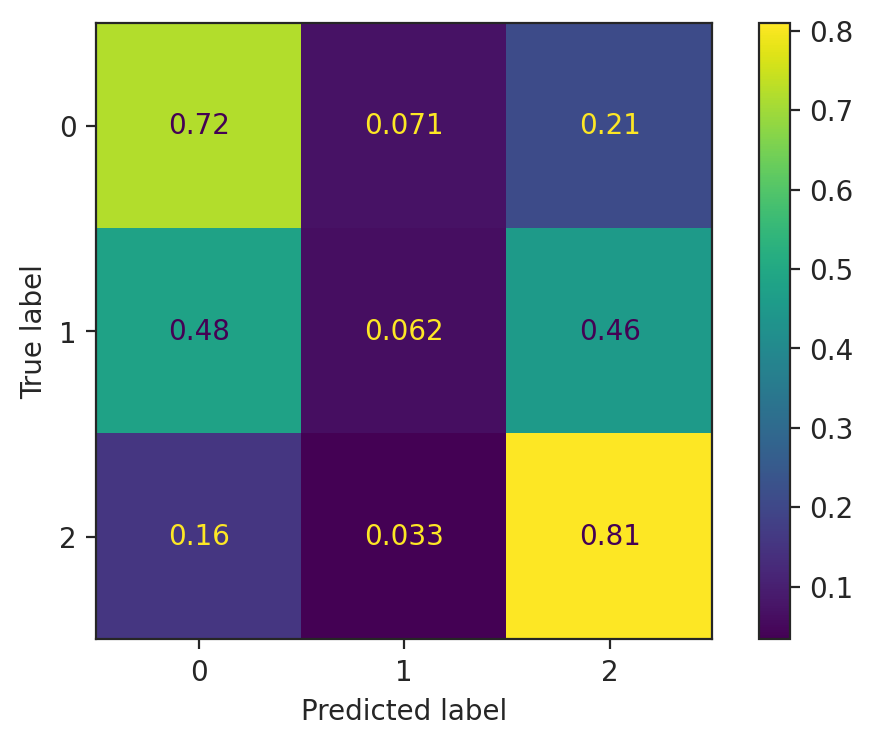

In [ ]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_val_encoded,ensemble_model.predict(X_val_scale),normalize='true')
ConfusionMatrixDisplay(confusion_matrix=cm).plot();

In [ ]:
cnn_models